# CSC 499 Graphing QUIC vs TCP Simulation Performance

This notebook is the source of the analysis figures for my thesis. The others were used during development and as helpers for this one.

In [109]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patches as patches
from matplotlib.lines import Line2D
import numpy as np
import os
import string

999
2000
1000000
QUIC with loss sample
C:\Users\Jamie\Documents\UVic\4th Year\Fall 2021\CSC 499 - QUIC\jupyter-csc499\499-Visualization\data\benchmarking-loss\TCP\festive\2Mbps\0.05\no-pacing\
TCP | festive | 2Mbps (2000000bps) | 5.0% loss | no pacing
444
222
QUIC | festive | 1Mbps (1000000bps) | 0.0% loss | pacing
QUIC | festive | 1Mbps (1000000bps) | 1.0% loss | no pacing
QUIC | festive | 2Mbps (2000000bps) | 5.0% loss | no pacing
QUIC | tobasco | 500Kbps (500000bps) | 1.0% loss | pacing
QUIC | tobasco | 2Mbps (2000000bps) | 2.0% loss | pacing
QUIC | tobasco | 3Mbps (3000000bps) | 2.0% loss | no pacing
QUIC | tobasco | 3Mbps (3000000bps) | 5.0% loss | pacing
QUIC | tobasco | 5Mbps (5000000bps) | 5.0% loss | no pacing
festive over QUIC @ 2Mbps with 0% loss
festive over QUIC @ 2Mbps with 5.0% loss
Mean Quality Level - QUIC 500Kbps:  0.7278911564625851
Mean Quality Level - TCP  500Kbps:  0.9099099099099099
Mean Quality Level - QUIC 1Mbps:  1.5
Mean Quality Level - TCP  1Mbps:  1.9099099

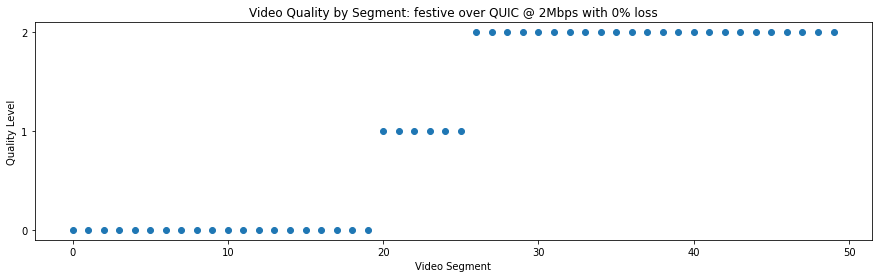

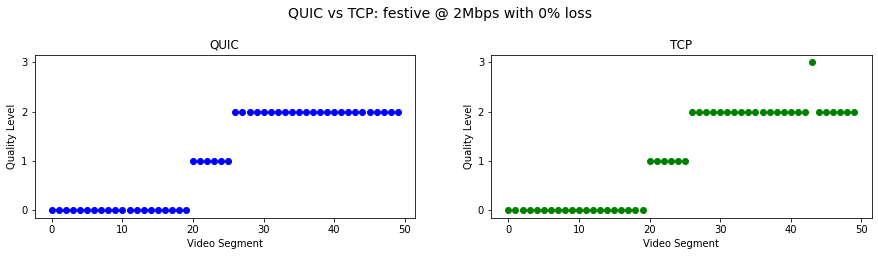

Overlayed comparison


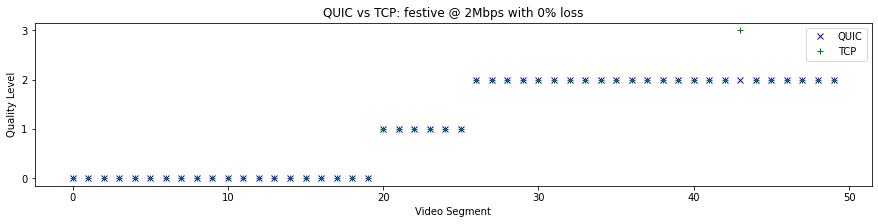

QUIC buffer level graph demo


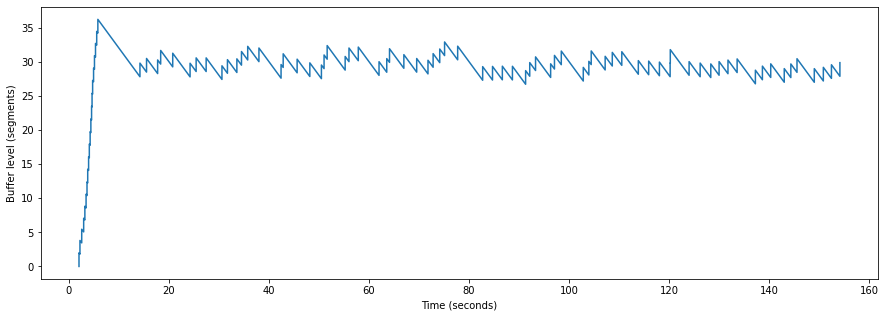

TCP buffer level graph demo


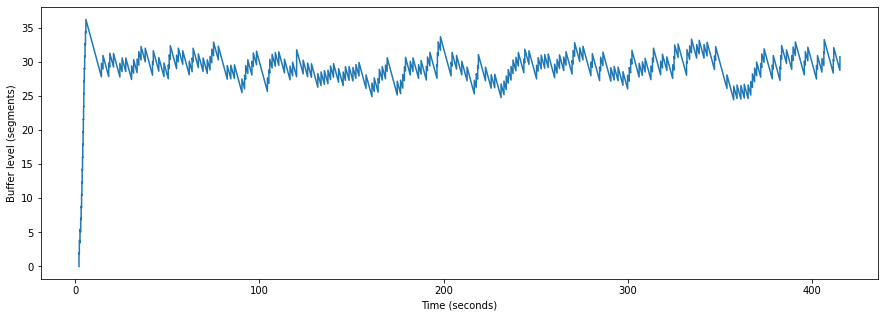

Buffer level comparison for normal rate


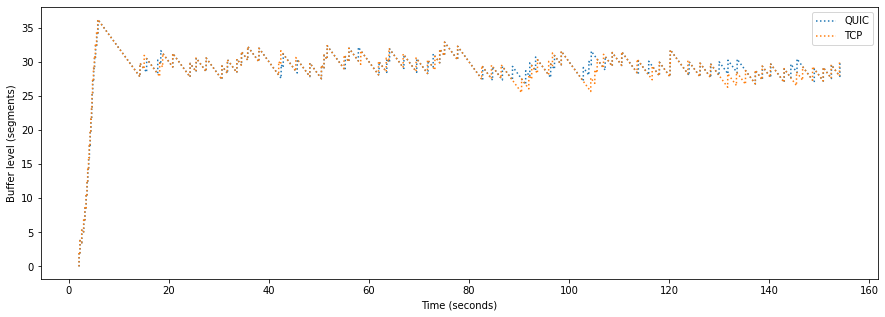

Buffer level comparison for slow rate


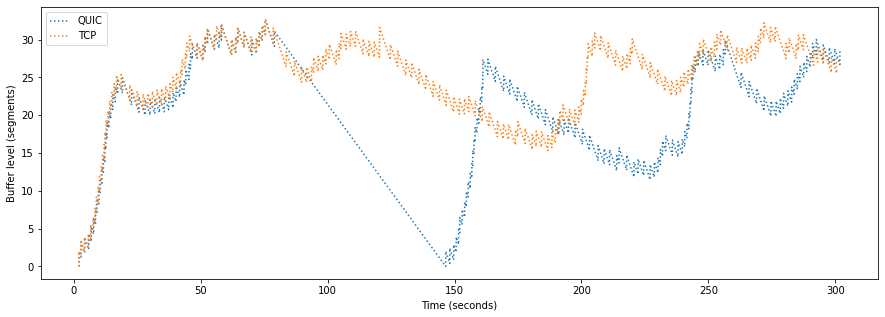

Buffer level over time with underflow annotations
Malformed buffer underflow log. Likely that QUIC failed near time 330.524


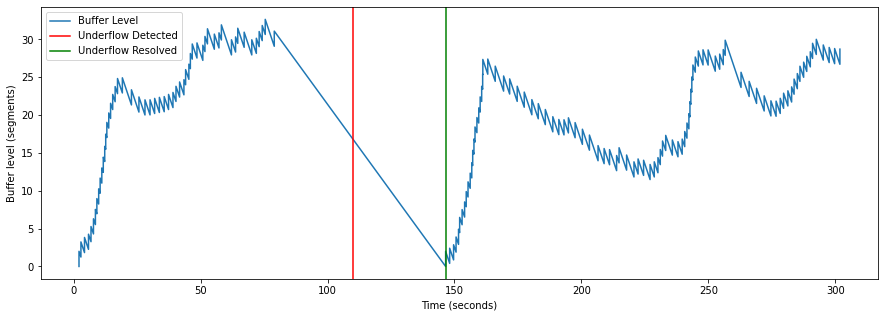

Full timeline for QUIC 500Kbps
Malformed buffer underflow log. Likely that QUIC failed near time 330.524


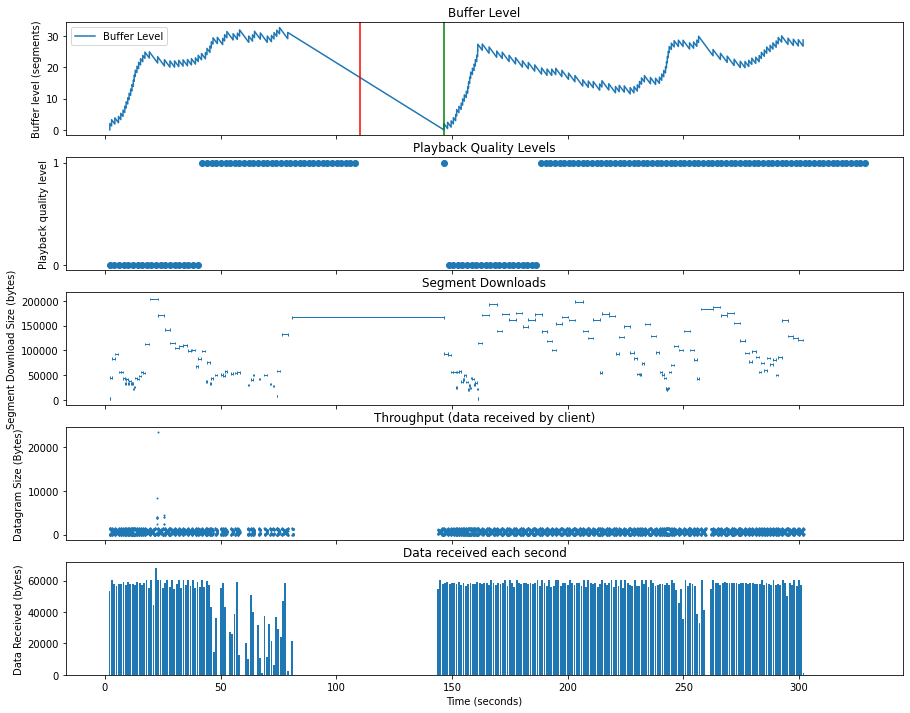

Full timeline for TCP 500Kbps


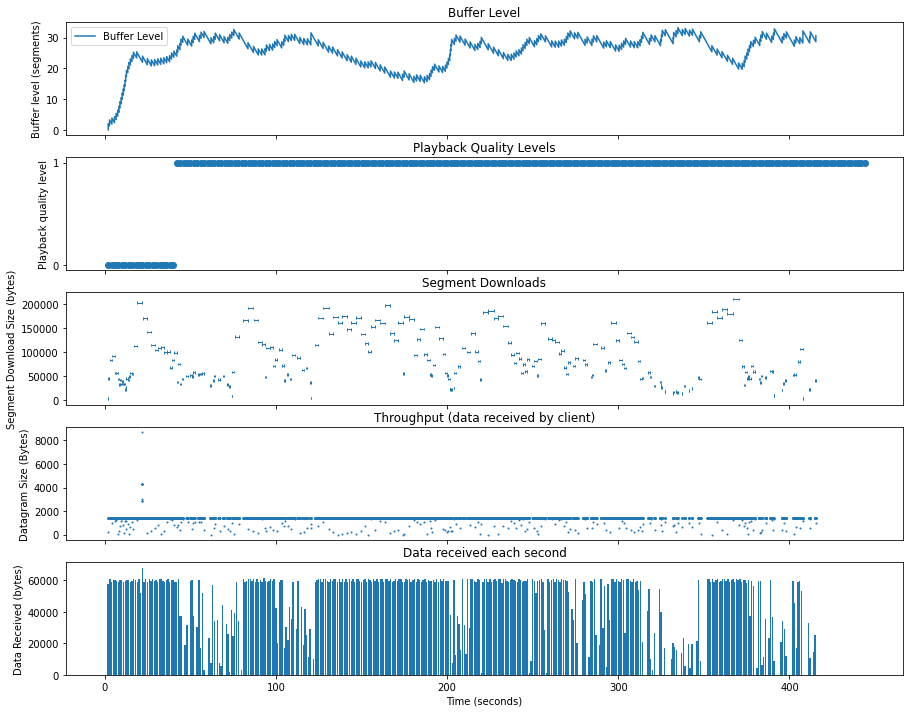

Full timeline for QUIC 2Mbps
Malformed buffer underflow log. Likely that QUIC failed near time 184.045


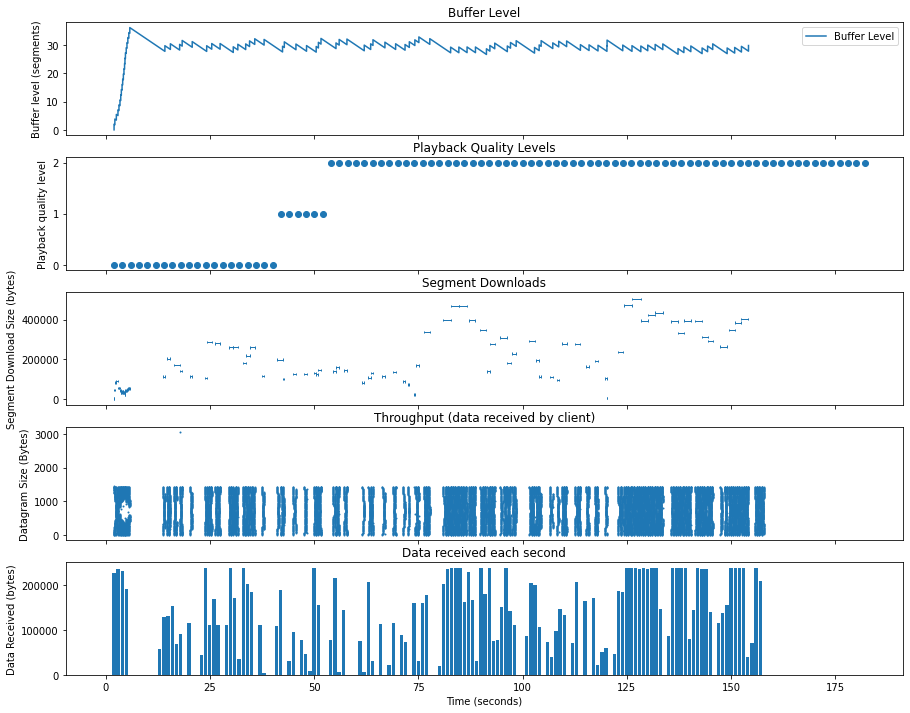

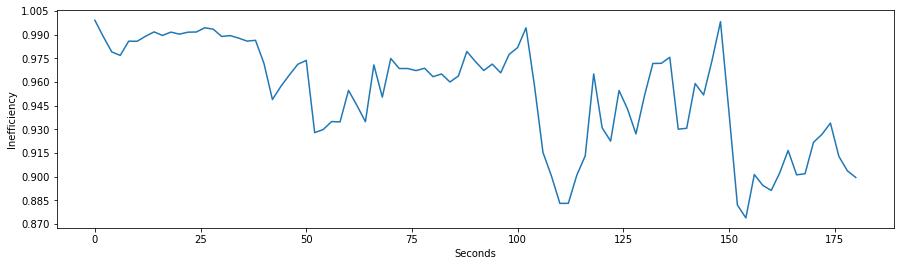

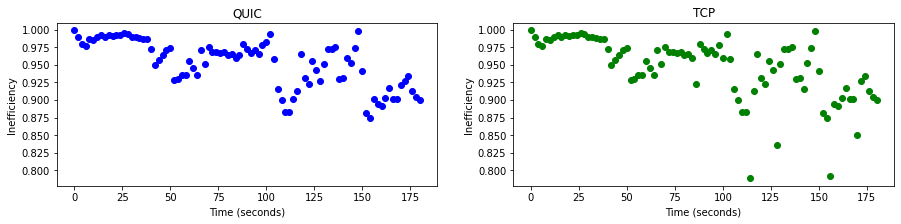

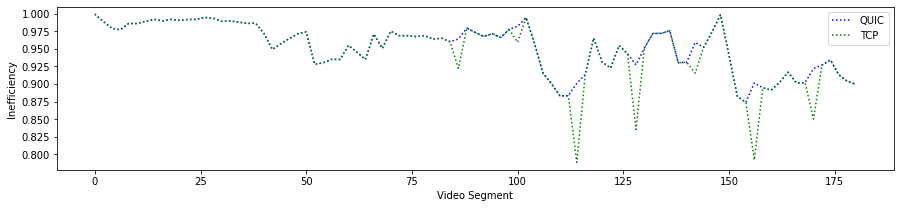

Stability for QUIC sample
Stability for TCP sample


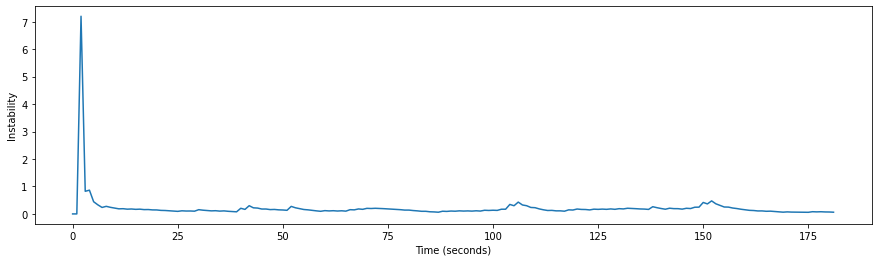

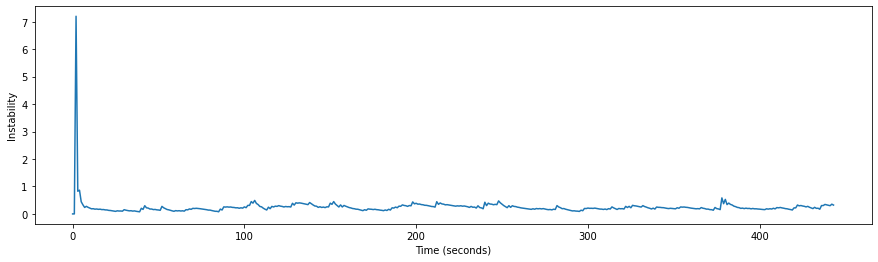

QUIC vs TCP samples


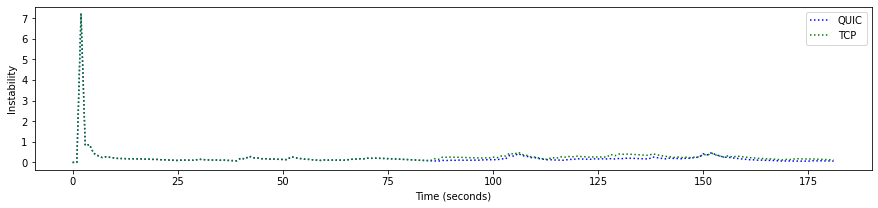

QUIC vs TCP lossy samples


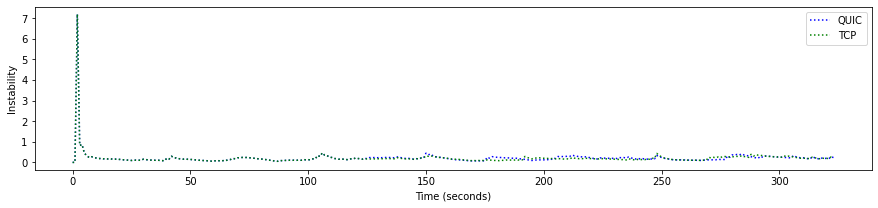

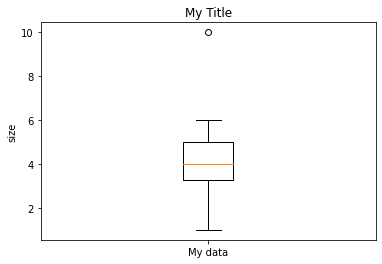

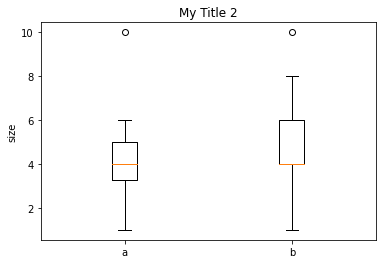

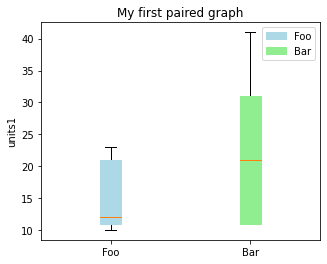

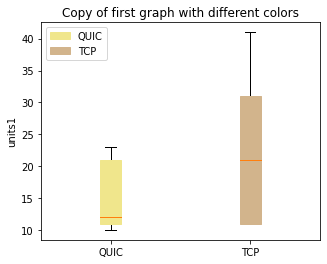

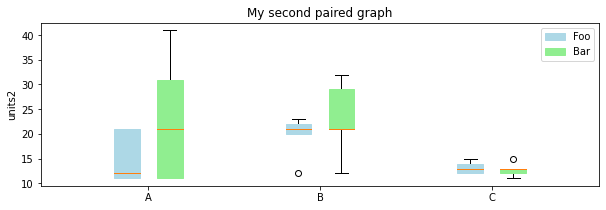

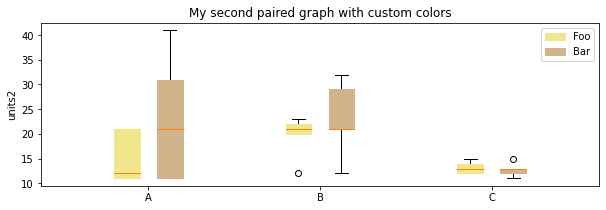

In [110]:
# Get all the supporting utilities set up. 
# Suggest using command-mode 'o' shortcut to hide output as it will include all the demos.
%run GraphHelpers.ipynb

## Enumerate QUIC simulations


In [19]:
def compareSims(sim1, sim2):
    return sim1.proto == sim2.proto and \
           sim1.algo == sim2.algo and \
           sim1.rateVal == sim2.rateVal and \
           sim1.errRate == sim2.errRate

# Return a list of all unique QUIC simulations that ran for at least 100 seconds
def findUniqueQuicSims():
    allQuicSims = findSimulationsWithMinSegCount(quicFinalDir, 50)
    
    prev = allQuicSims[0]
    result = [prev]
    
    for sim in allQuicSims[1:]:
        if not compareSims(sim, prev):
            result.append(sim)
            prev = sim
    
    return result

In [111]:
print ("Min 50 segments (final data set, one simulation per config) -- total {}".format(len(findUniqueQuicSims())))
for sim in findUniqueQuicSims():
    print (getDescription(sim))

Min 50 segments (final data set, one simulation per config) -- total 37
festive over QUIC @ 500Kbps with 0.0% loss
festive over QUIC @ 500Kbps with 1.0% loss
festive over QUIC @ 500Kbps with 2.0% loss
festive over QUIC @ 1Mbps with 0.0% loss
festive over QUIC @ 1Mbps with 1.0% loss
festive over QUIC @ 1Mbps with 2.0% loss
festive over QUIC @ 1Mbps with 5.0% loss
festive over QUIC @ 2Mbps with 0.0% loss
festive over QUIC @ 2Mbps with 1.0% loss
festive over QUIC @ 2Mbps with 2.0% loss
festive over QUIC @ 2Mbps with 5.0% loss
festive over QUIC @ 3Mbps with 0.0% loss
festive over QUIC @ 3Mbps with 1.0% loss
festive over QUIC @ 3Mbps with 2.0% loss
festive over QUIC @ 3Mbps with 5.0% loss
festive over QUIC @ 5Mbps with 1.0% loss
festive over QUIC @ 5Mbps with 2.0% loss
festive over QUIC @ 5Mbps with 5.0% loss
tobasco over QUIC @ 500Kbps with 0.0% loss
tobasco over QUIC @ 500Kbps with 1.0% loss
tobasco over QUIC @ 500Kbps with 2.0% loss
tobasco over QUIC @ 1Mbps with 0.0% loss
tobasco over Q

In [112]:
allQuicSims = findUniqueQuicSims()
allTcpSims = getTcpSimulations(allQuicSims)

allSimPairs = list(zip(allQuicSims, allTcpSims))

## Bulk Data Visualization
Some initial graphs of the QUIC simulations and the corresponding TCP simulations, up to 50 segments. 

festive over QUIC @ 500Kbps with 0.0% loss  vs.  festive over TCP @ 500Kbps with 0.0% loss


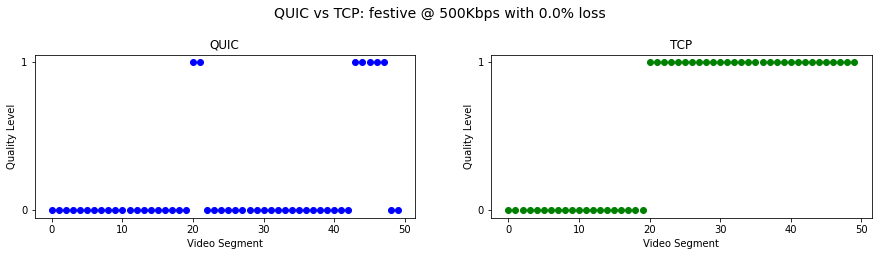

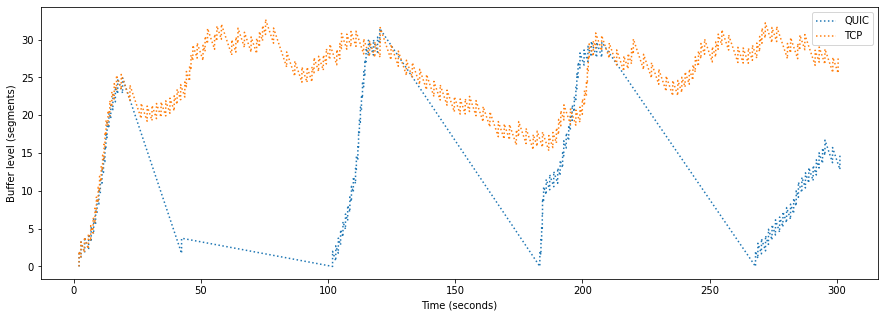



festive over QUIC @ 500Kbps with 1.0% loss  vs.  festive over TCP @ 500Kbps with 1.0% loss


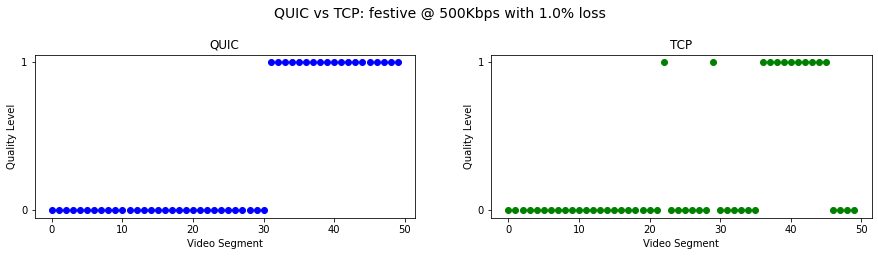

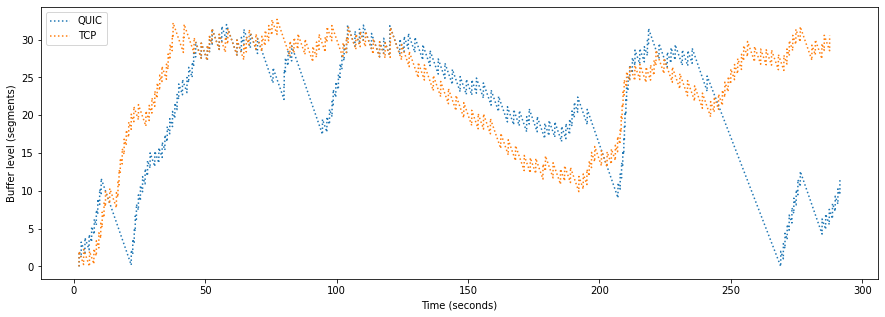



festive over QUIC @ 500Kbps with 2.0% loss  vs.  festive over TCP @ 500Kbps with 2.0% loss


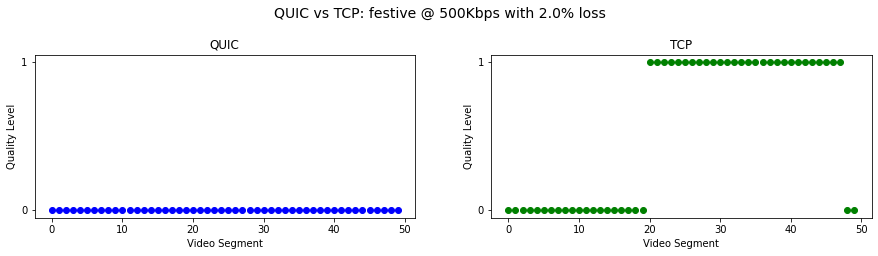

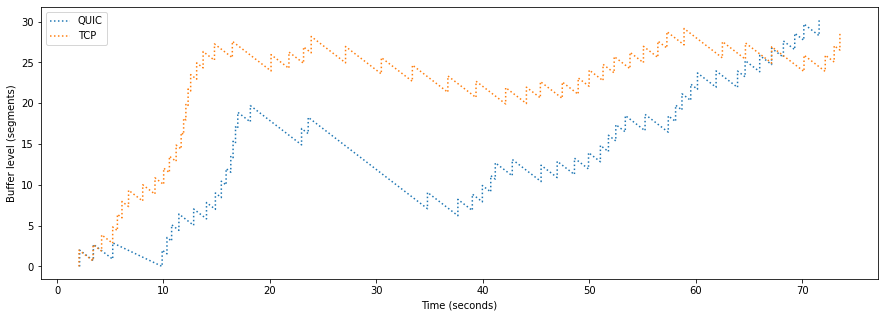



festive over QUIC @ 1Mbps with 0.0% loss  vs.  festive over TCP @ 1Mbps with 0.0% loss


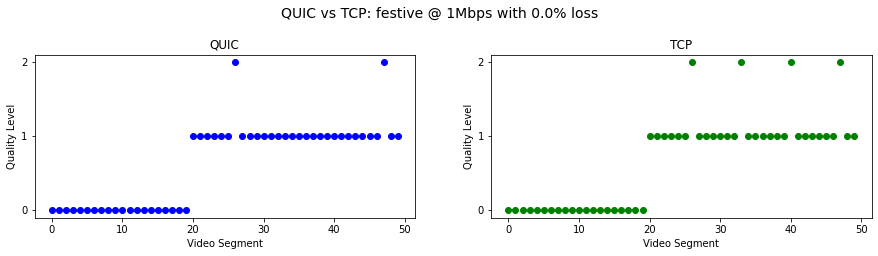

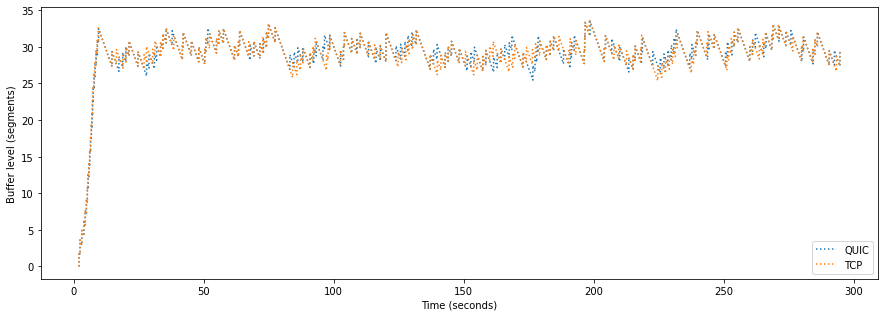



festive over QUIC @ 1Mbps with 1.0% loss  vs.  festive over TCP @ 1Mbps with 1.0% loss


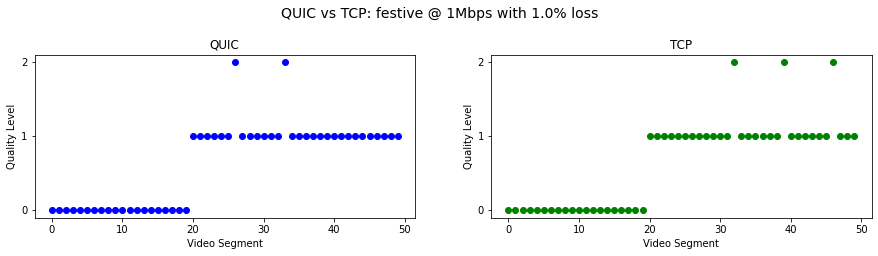

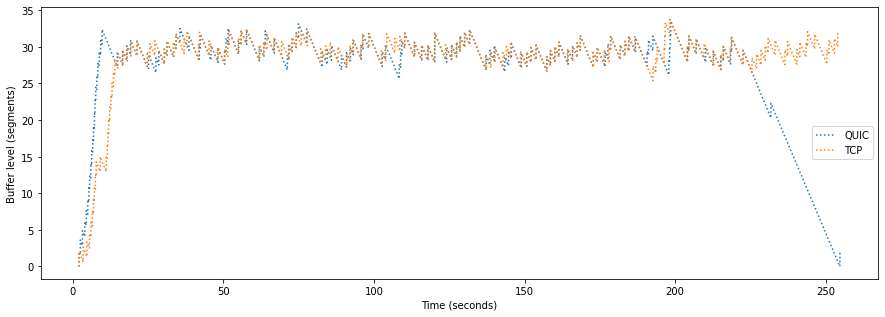



festive over QUIC @ 1Mbps with 2.0% loss  vs.  festive over TCP @ 1Mbps with 2.0% loss


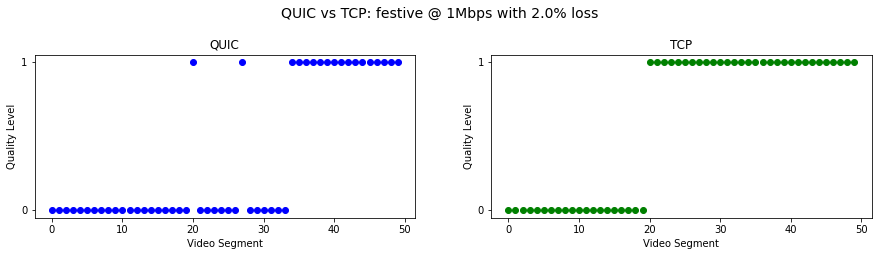

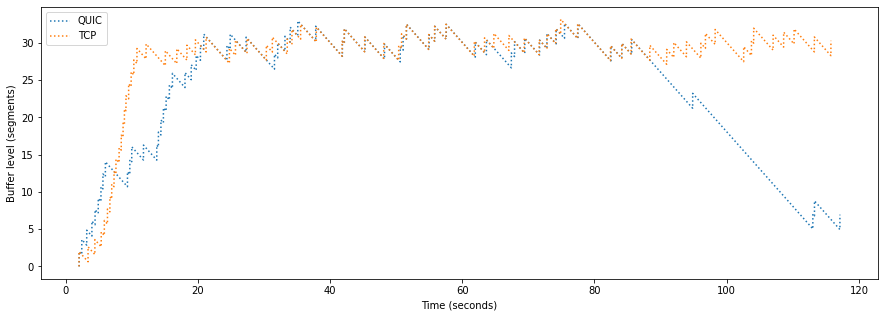



festive over QUIC @ 1Mbps with 5.0% loss  vs.  festive over TCP @ 1Mbps with 5.0% loss


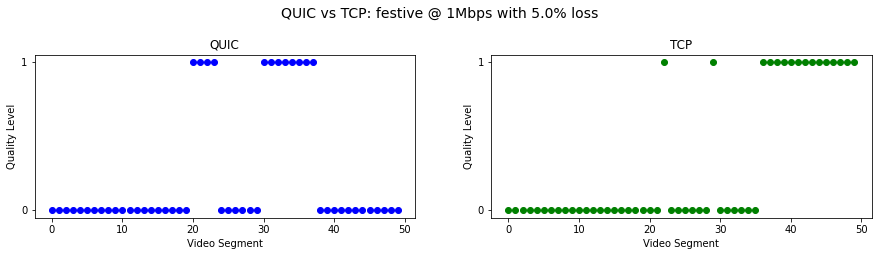

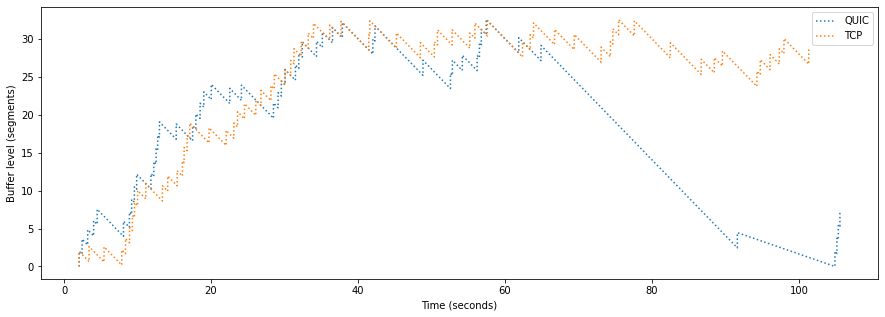



festive over QUIC @ 2Mbps with 0.0% loss  vs.  festive over TCP @ 2Mbps with 0.0% loss


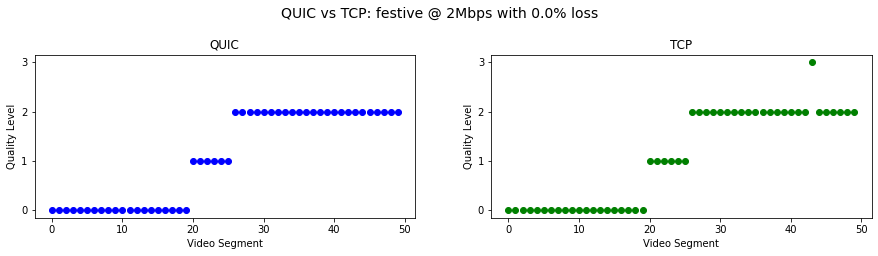

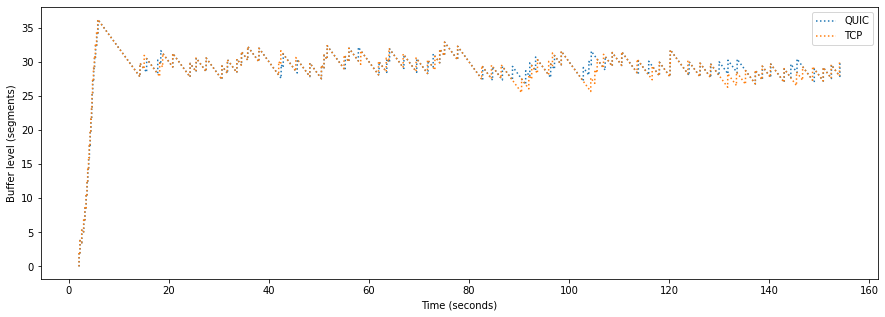



festive over QUIC @ 2Mbps with 1.0% loss  vs.  festive over TCP @ 2Mbps with 1.0% loss


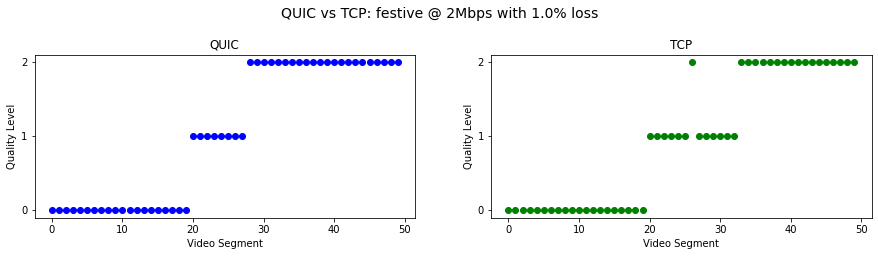

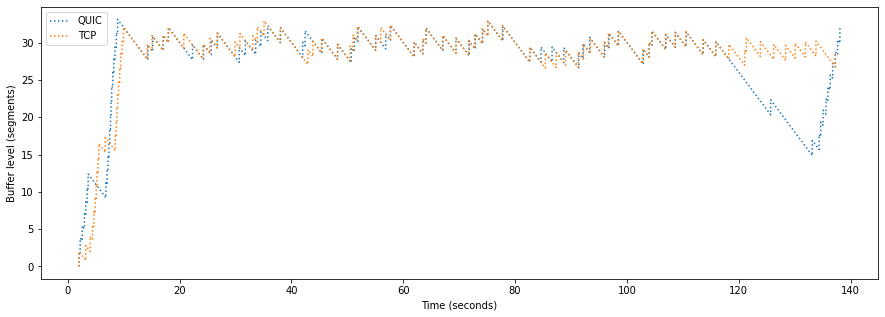



festive over QUIC @ 2Mbps with 2.0% loss  vs.  festive over TCP @ 2Mbps with 2.0% loss


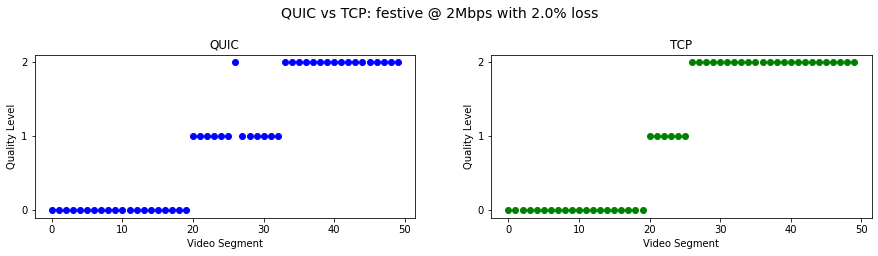

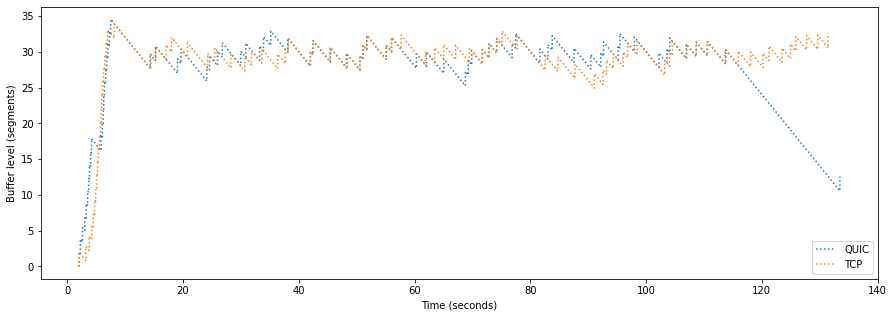



festive over QUIC @ 2Mbps with 5.0% loss  vs.  festive over TCP @ 2Mbps with 5.0% loss


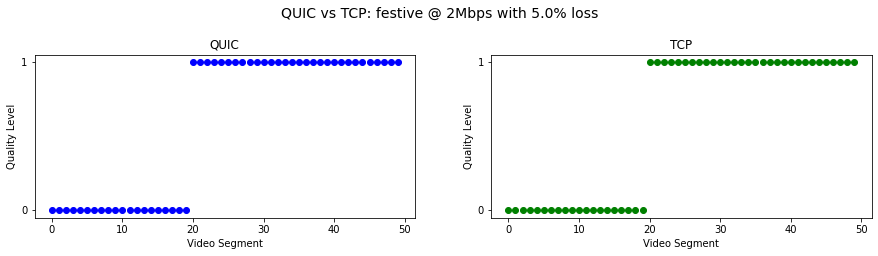

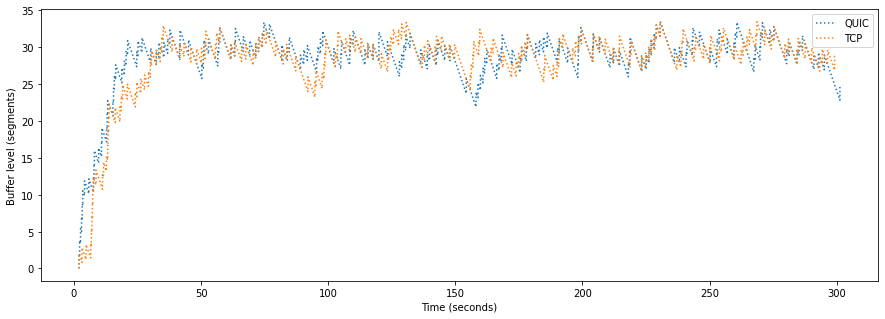



festive over QUIC @ 3Mbps with 0.0% loss  vs.  festive over TCP @ 3Mbps with 0.0% loss


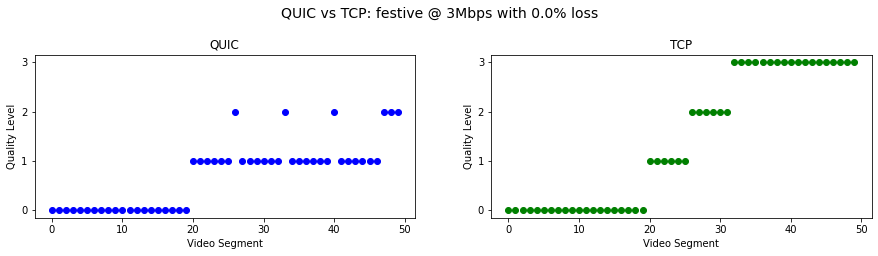

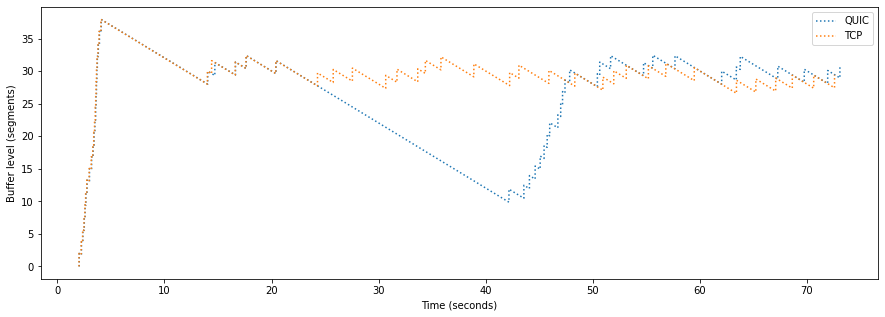



festive over QUIC @ 3Mbps with 1.0% loss  vs.  festive over TCP @ 3Mbps with 1.0% loss


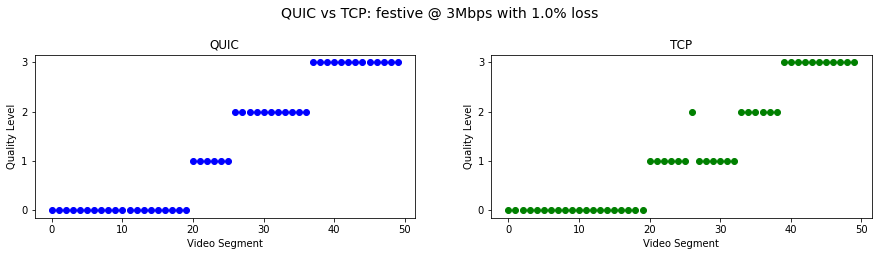

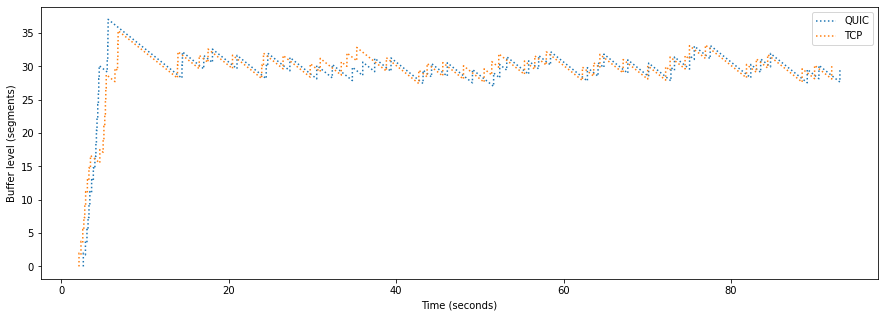



festive over QUIC @ 3Mbps with 2.0% loss  vs.  festive over TCP @ 3Mbps with 2.0% loss


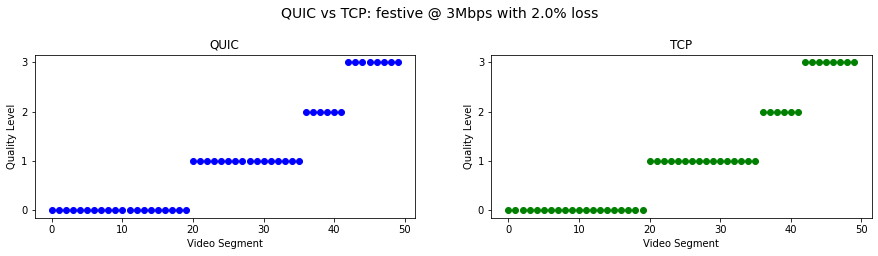

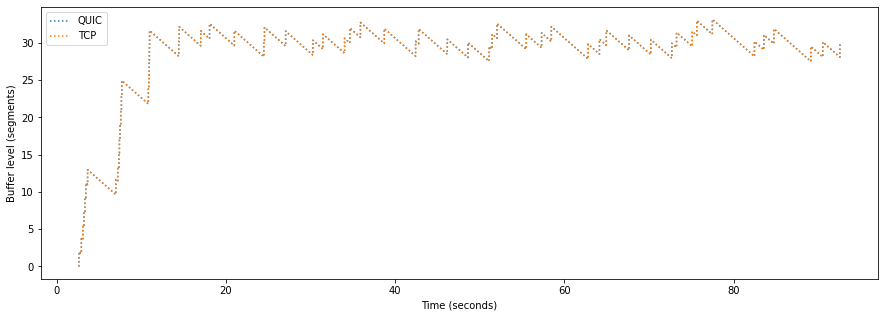



festive over QUIC @ 3Mbps with 5.0% loss  vs.  festive over TCP @ 3Mbps with 5.0% loss


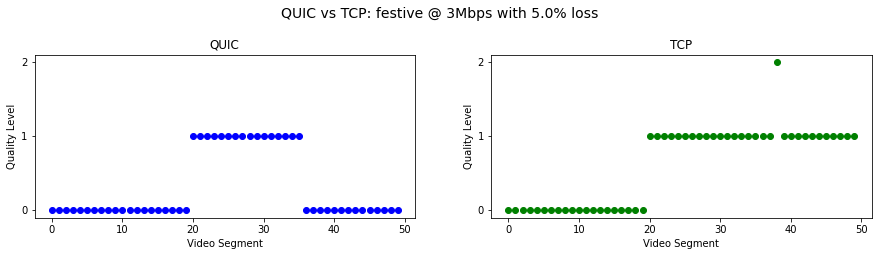

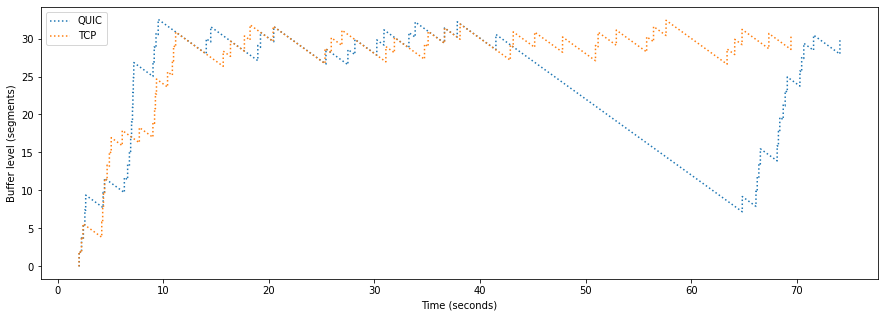



festive over QUIC @ 5Mbps with 1.0% loss  vs.  festive over TCP @ 5Mbps with 1.0% loss


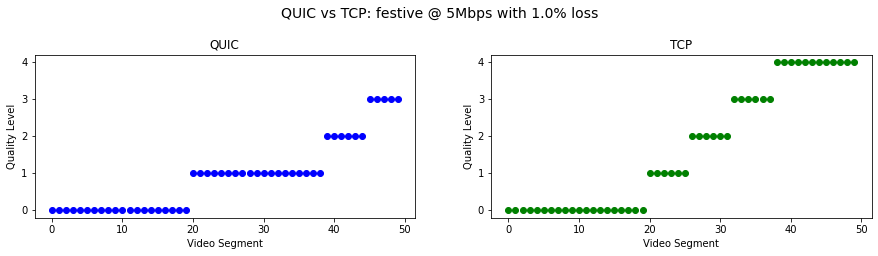

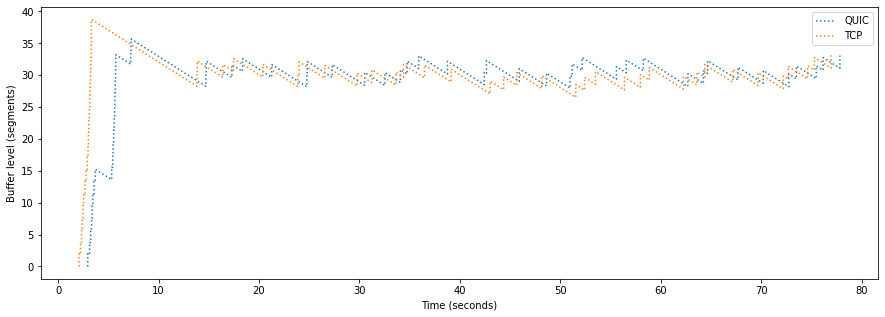



festive over QUIC @ 5Mbps with 2.0% loss  vs.  festive over TCP @ 5Mbps with 2.0% loss


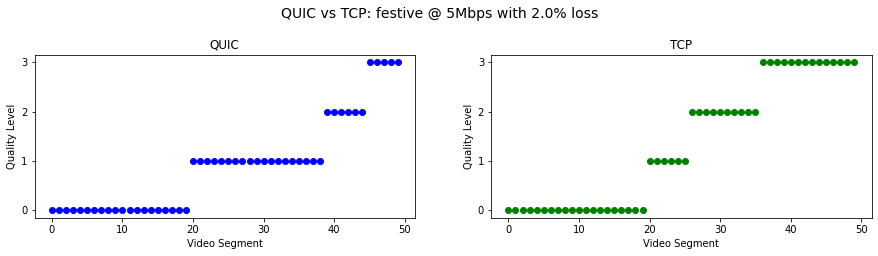

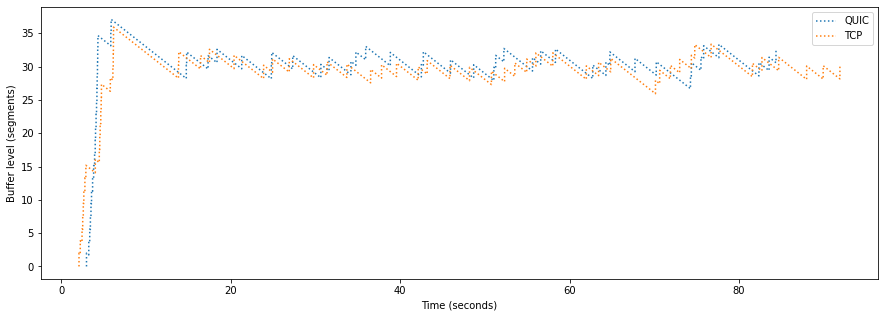



festive over QUIC @ 5Mbps with 5.0% loss  vs.  festive over TCP @ 5Mbps with 5.0% loss


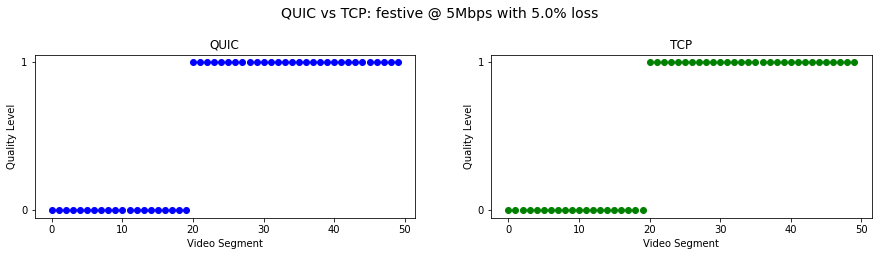

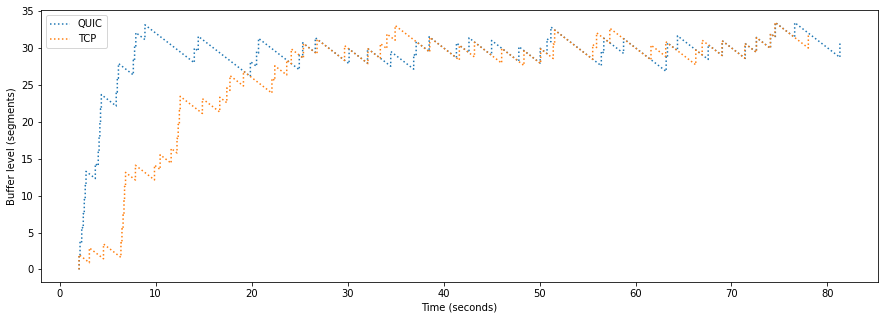



tobasco over QUIC @ 500Kbps with 0.0% loss  vs.  tobasco over TCP @ 500Kbps with 0.0% loss


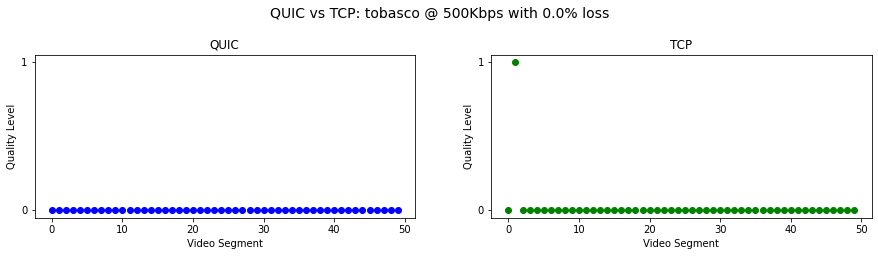

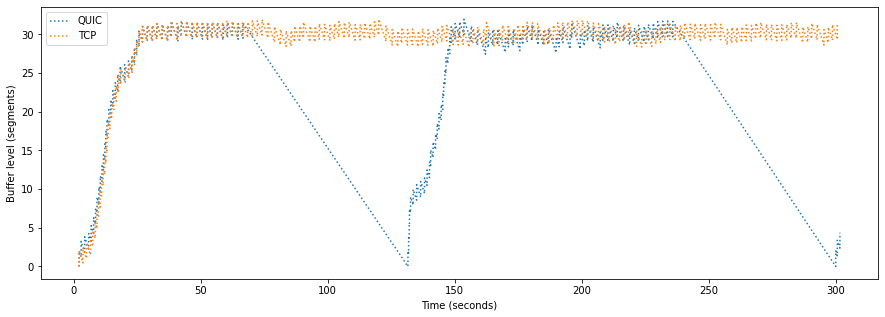



tobasco over QUIC @ 500Kbps with 1.0% loss  vs.  tobasco over TCP @ 500Kbps with 1.0% loss


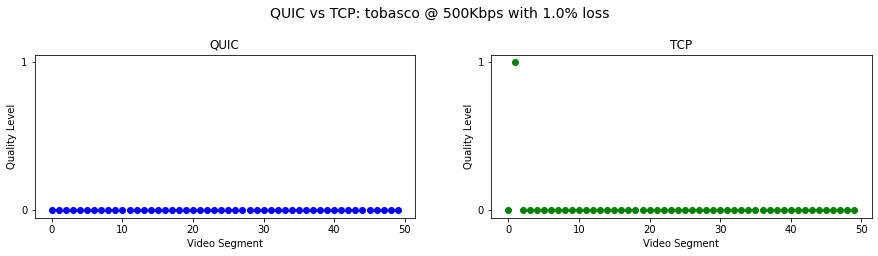

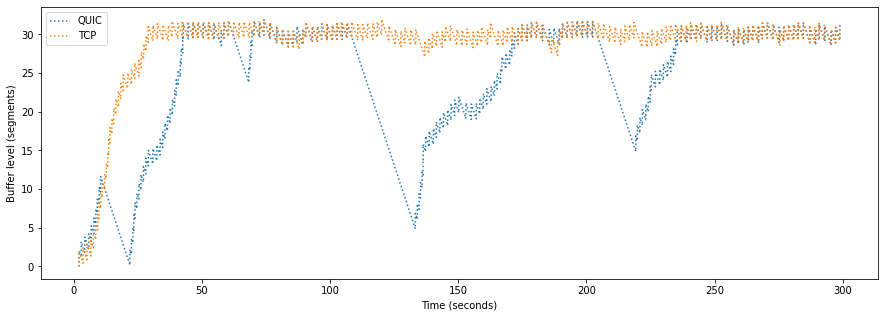



tobasco over QUIC @ 500Kbps with 2.0% loss  vs.  tobasco over TCP @ 500Kbps with 2.0% loss


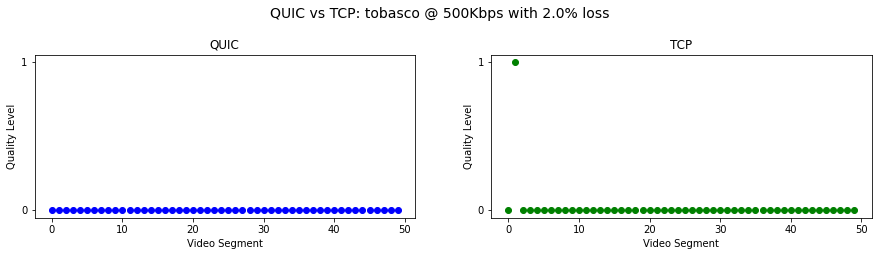

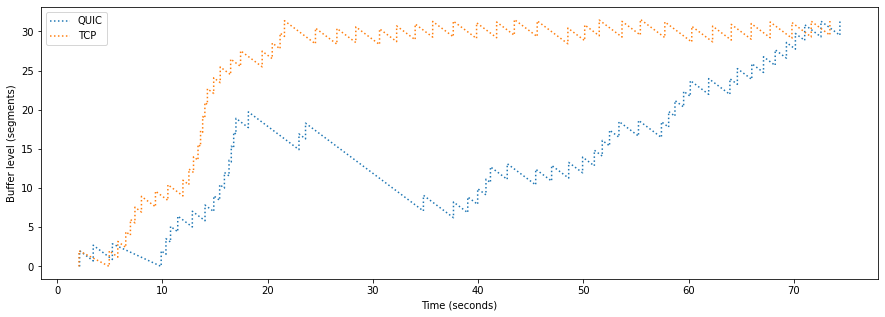



tobasco over QUIC @ 1Mbps with 0.0% loss  vs.  tobasco over TCP @ 1Mbps with 0.0% loss


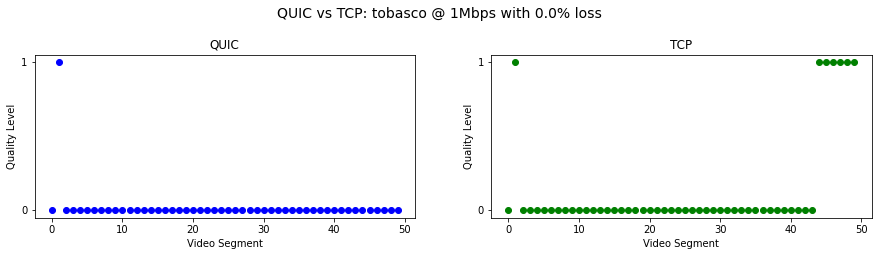

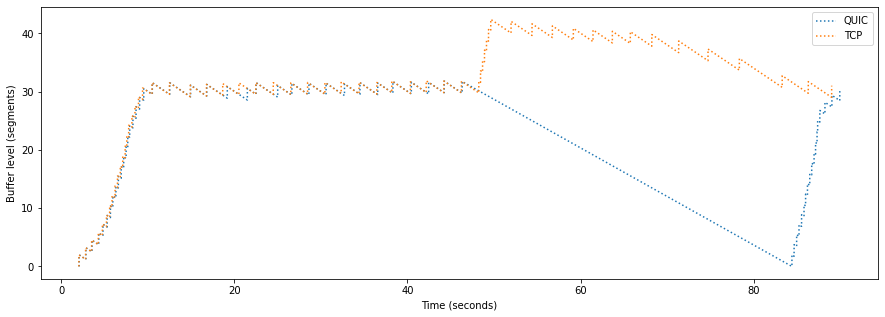



tobasco over QUIC @ 1Mbps with 1.0% loss  vs.  tobasco over TCP @ 1Mbps with 1.0% loss


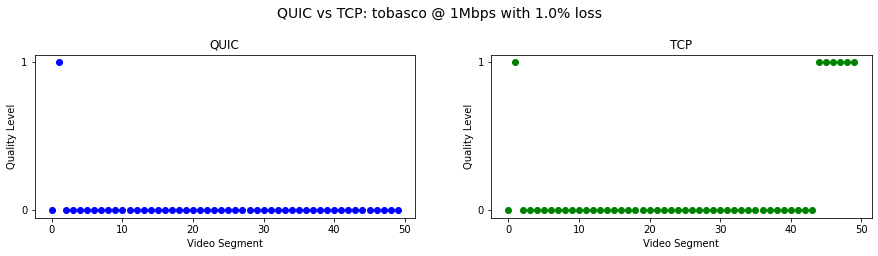

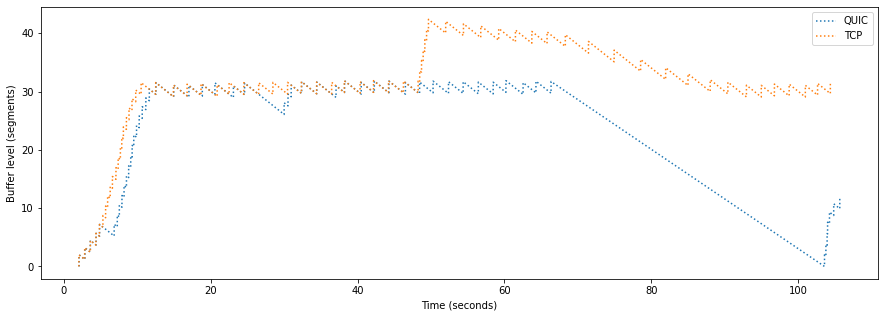



tobasco over QUIC @ 1Mbps with 2.0% loss  vs.  tobasco over TCP @ 1Mbps with 2.0% loss


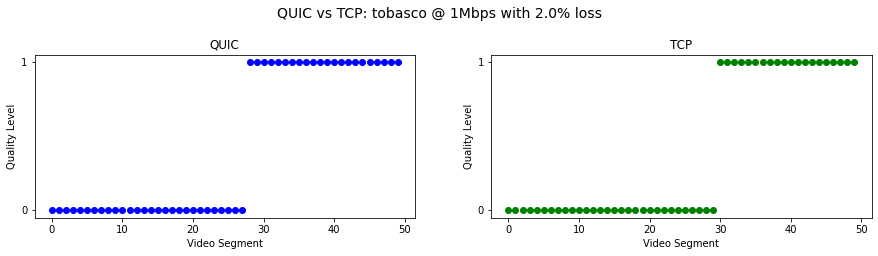

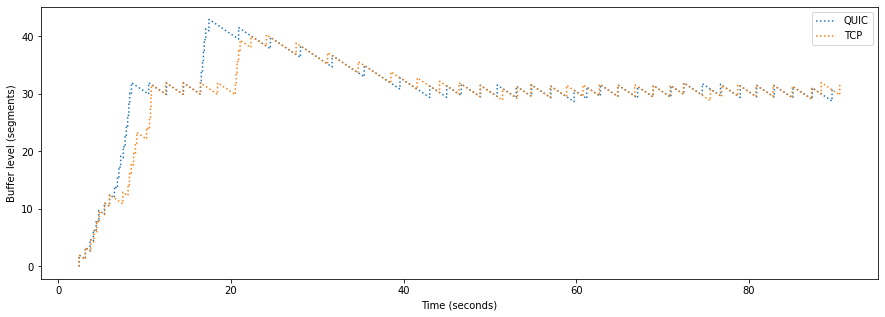



tobasco over QUIC @ 1Mbps with 5.0% loss  vs.  tobasco over TCP @ 1Mbps with 5.0% loss


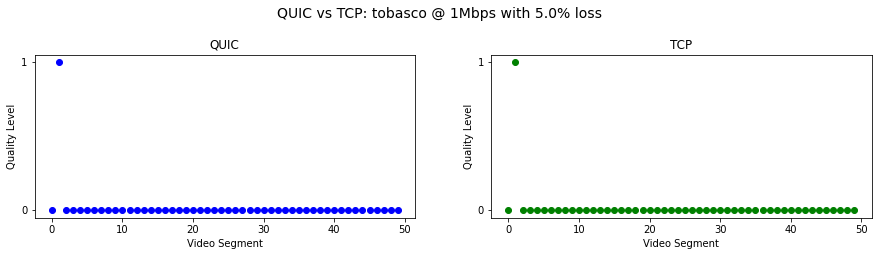

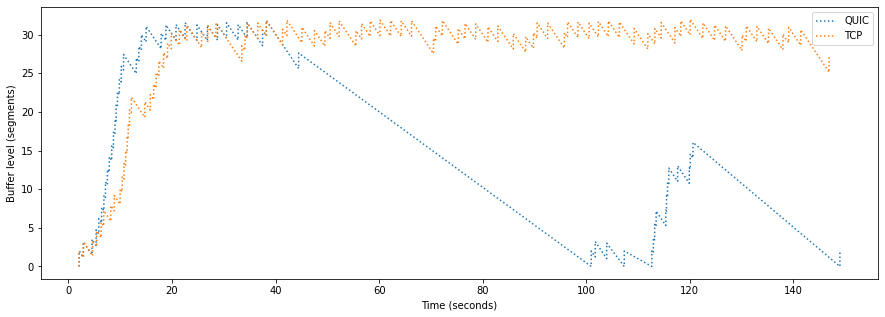



tobasco over QUIC @ 2Mbps with 0.0% loss  vs.  tobasco over TCP @ 2Mbps with 0.0% loss


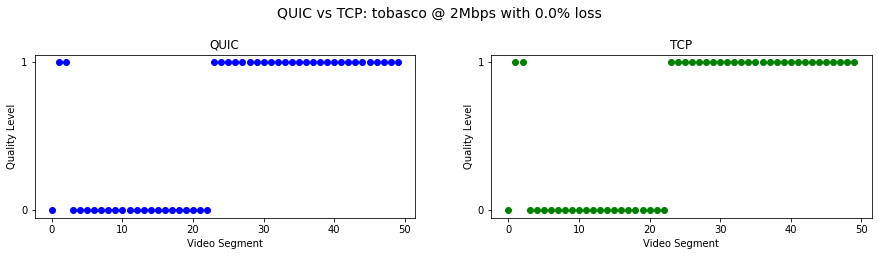

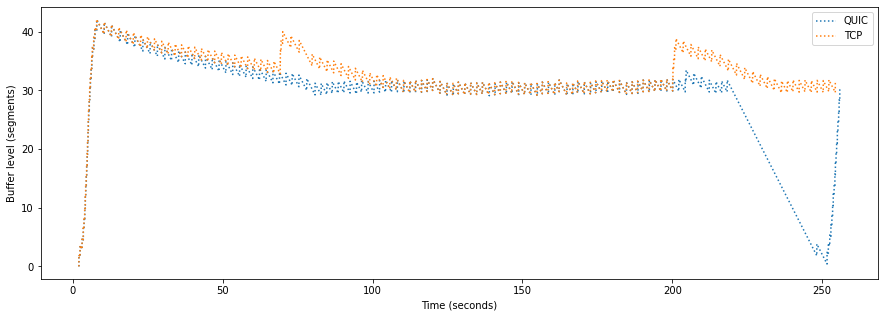



tobasco over QUIC @ 2Mbps with 1.0% loss  vs.  tobasco over TCP @ 2Mbps with 1.0% loss


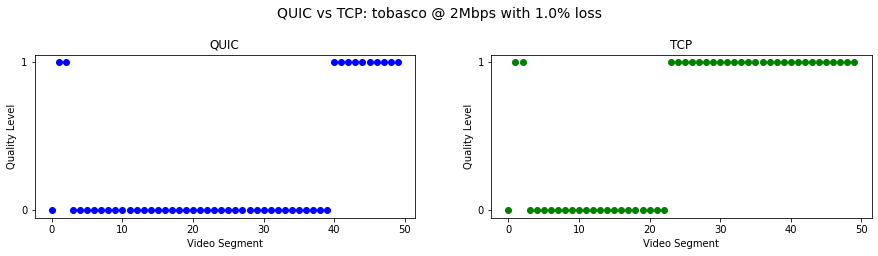

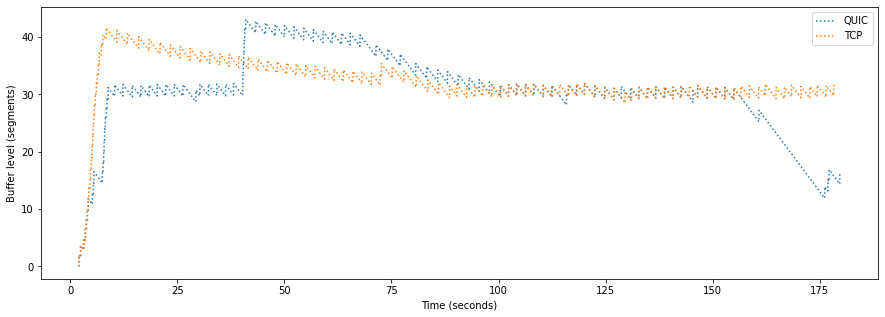



tobasco over QUIC @ 2Mbps with 2.0% loss  vs.  tobasco over TCP @ 2Mbps with 2.0% loss


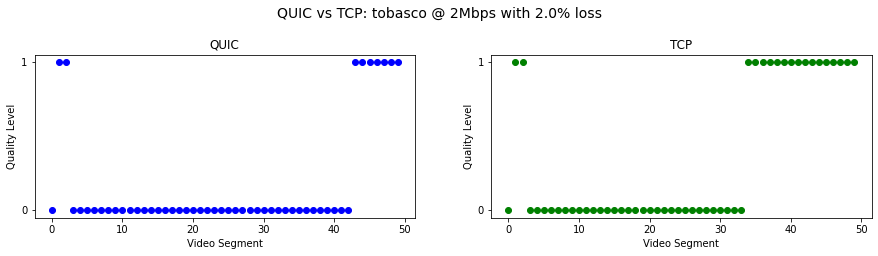

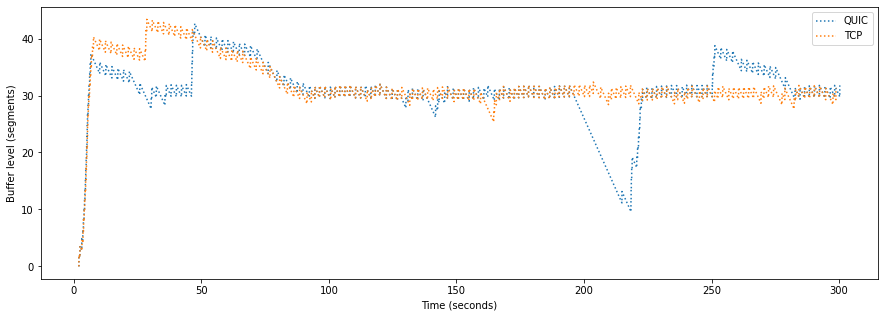



tobasco over QUIC @ 2Mbps with 5.0% loss  vs.  tobasco over TCP @ 2Mbps with 5.0% loss


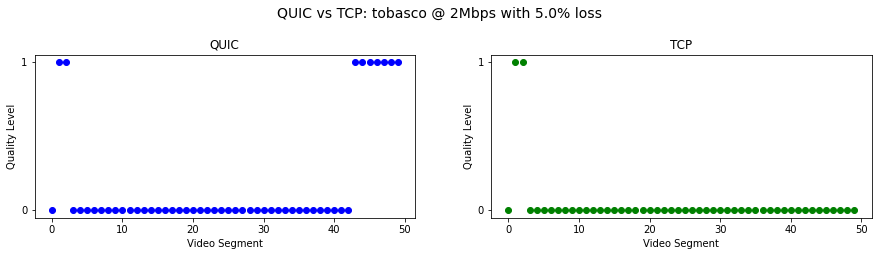

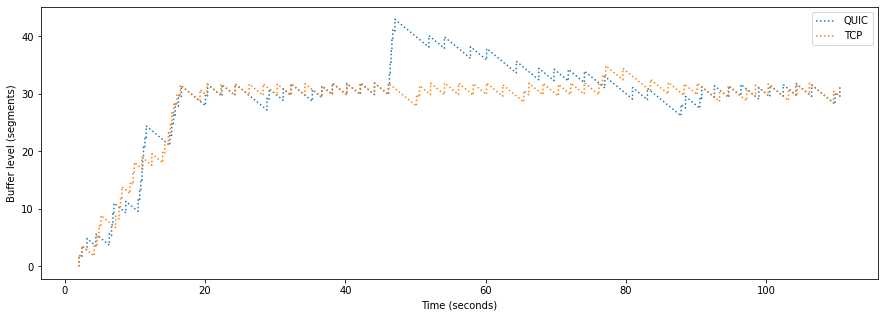



tobasco over QUIC @ 3Mbps with 0.0% loss  vs.  tobasco over TCP @ 3Mbps with 0.0% loss


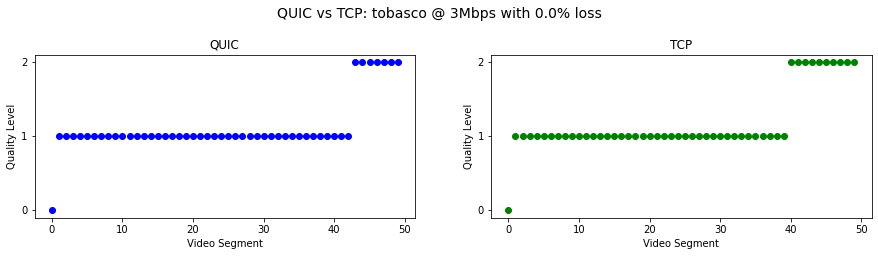

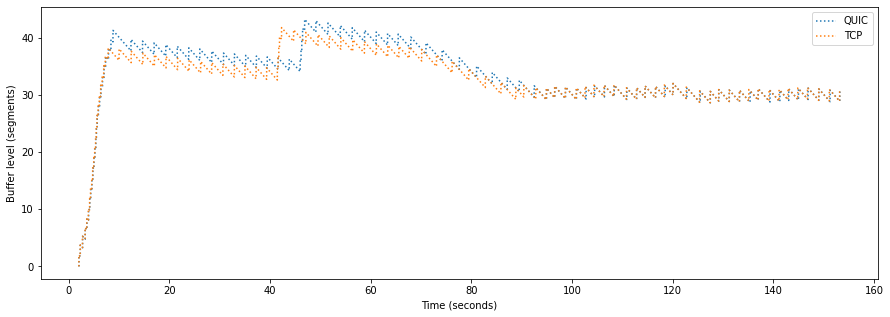



tobasco over QUIC @ 3Mbps with 1.0% loss  vs.  tobasco over TCP @ 3Mbps with 1.0% loss


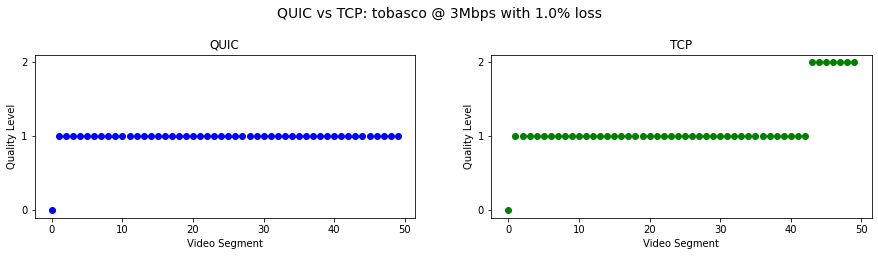

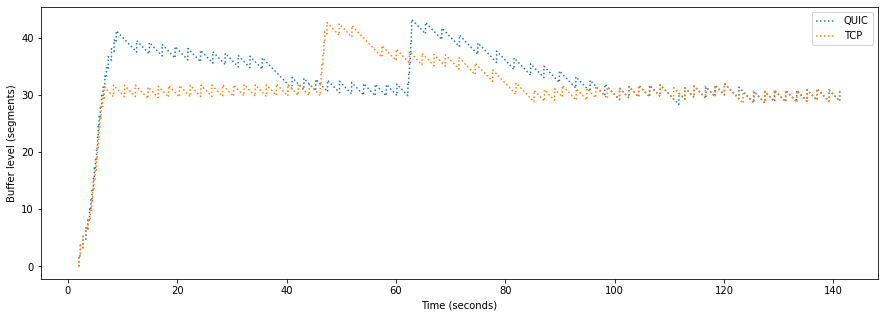



tobasco over QUIC @ 3Mbps with 2.0% loss  vs.  tobasco over TCP @ 3Mbps with 2.0% loss


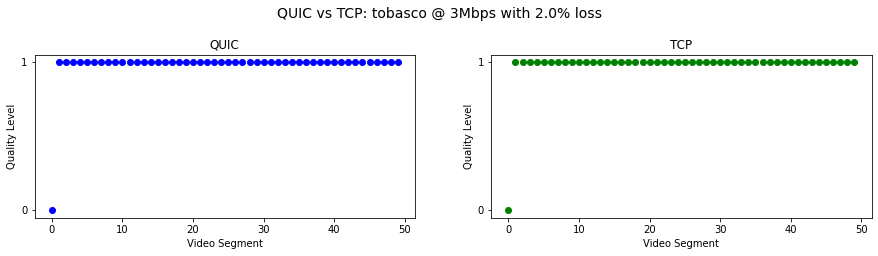

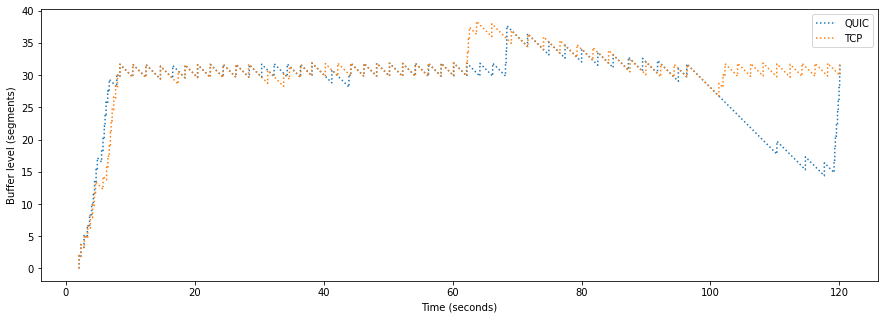



tobasco over QUIC @ 3Mbps with 5.0% loss  vs.  tobasco over TCP @ 3Mbps with 5.0% loss


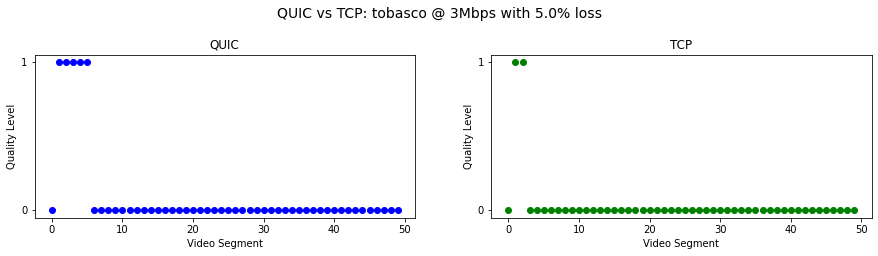

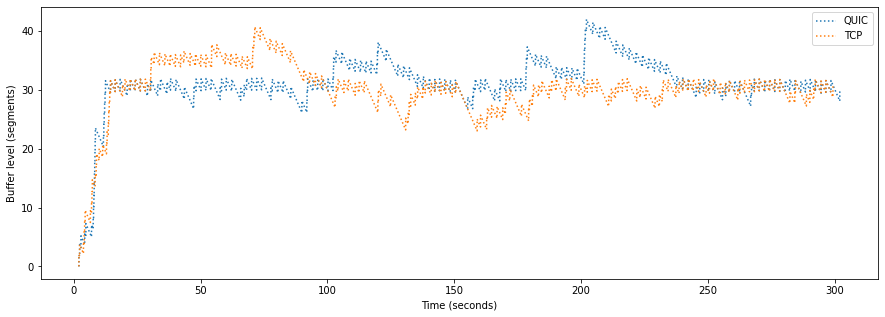



tobasco over QUIC @ 5Mbps with 0.0% loss  vs.  tobasco over TCP @ 5Mbps with 0.0% loss


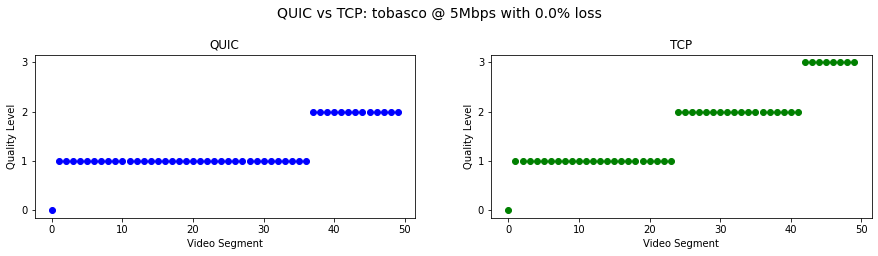

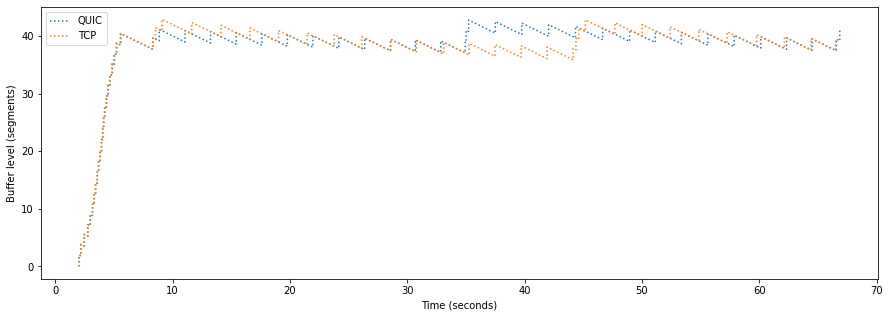



tobasco over QUIC @ 5Mbps with 1.0% loss  vs.  tobasco over TCP @ 5Mbps with 1.0% loss


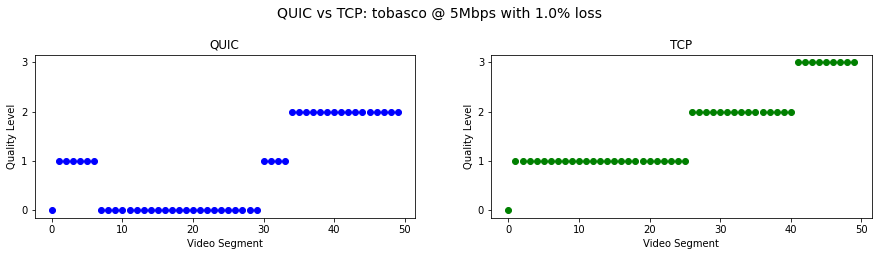

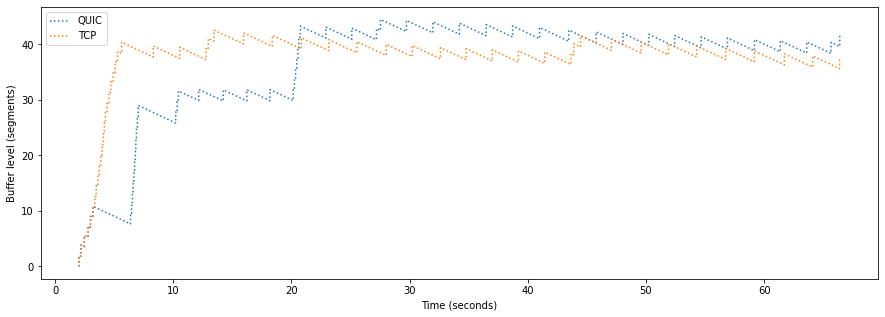



tobasco over QUIC @ 5Mbps with 2.0% loss  vs.  tobasco over TCP @ 5Mbps with 2.0% loss


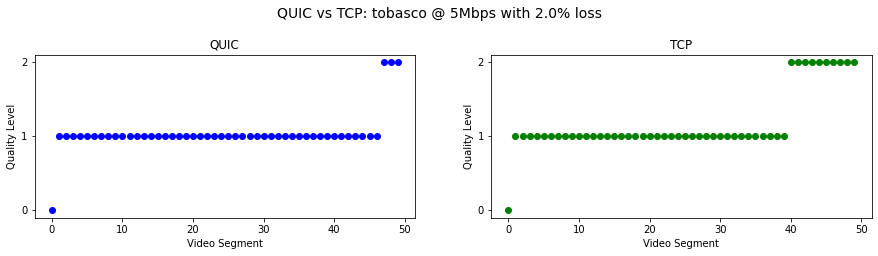

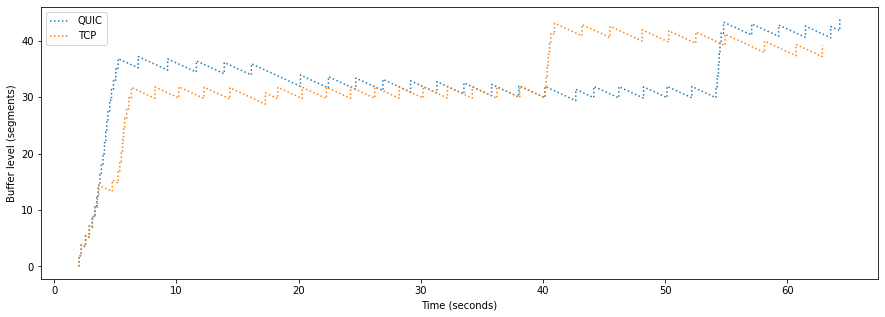



tobasco over QUIC @ 5Mbps with 5.0% loss  vs.  tobasco over TCP @ 5Mbps with 5.0% loss


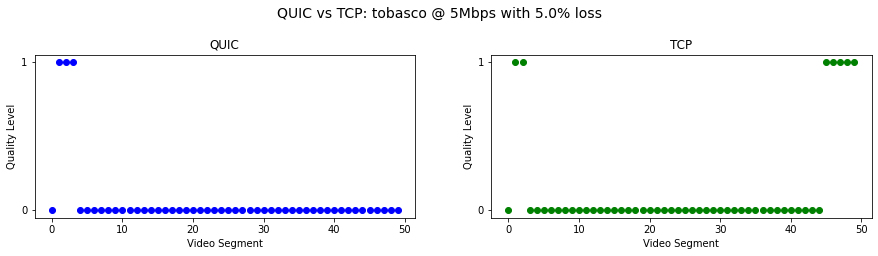

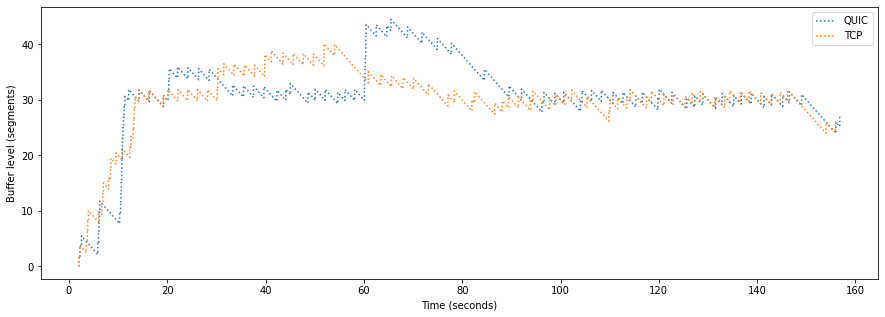

In [113]:
# Compare all the quality and buffer levels
for (quicSim, tcpSim) in allSimPairs:
    quicTitle = getDescription(quicSim)
    tcpTitle = getDescription(tcpSim)
    
    print (quicTitle, " vs. ", tcpTitle)
    compareAdaptationLevelsSeparate (quicSim, tcpSim, 'QUIC', 'TCP')
    graphBufferLevelComparison(quicSim, tcpSim, 'QUIC', 'TCP')

    print("\n")

festive over QUIC @ 500Kbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 316.032


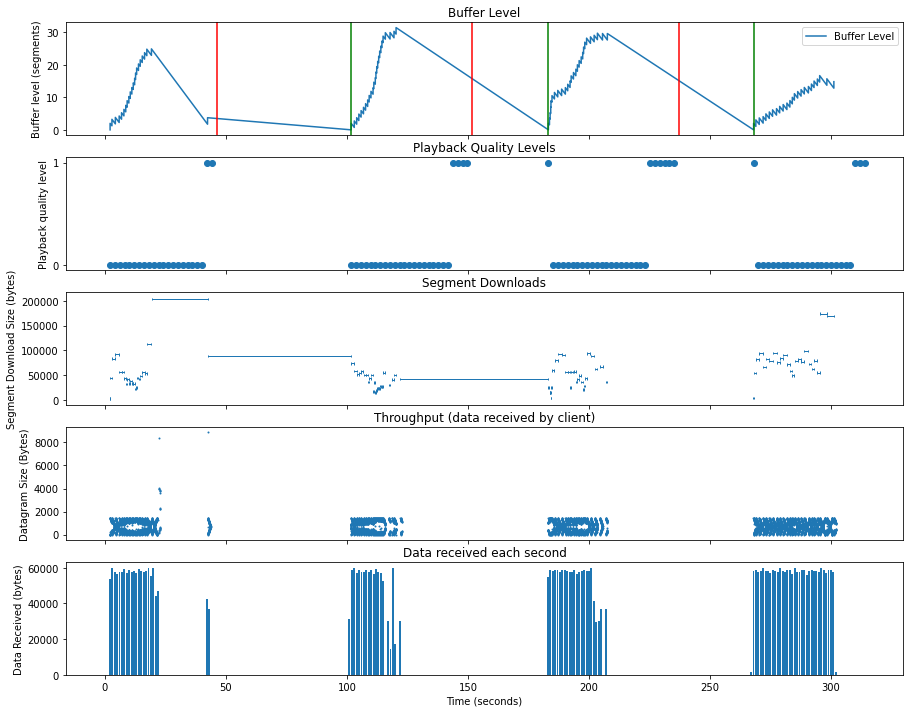



festive over QUIC @ 500Kbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 302.949


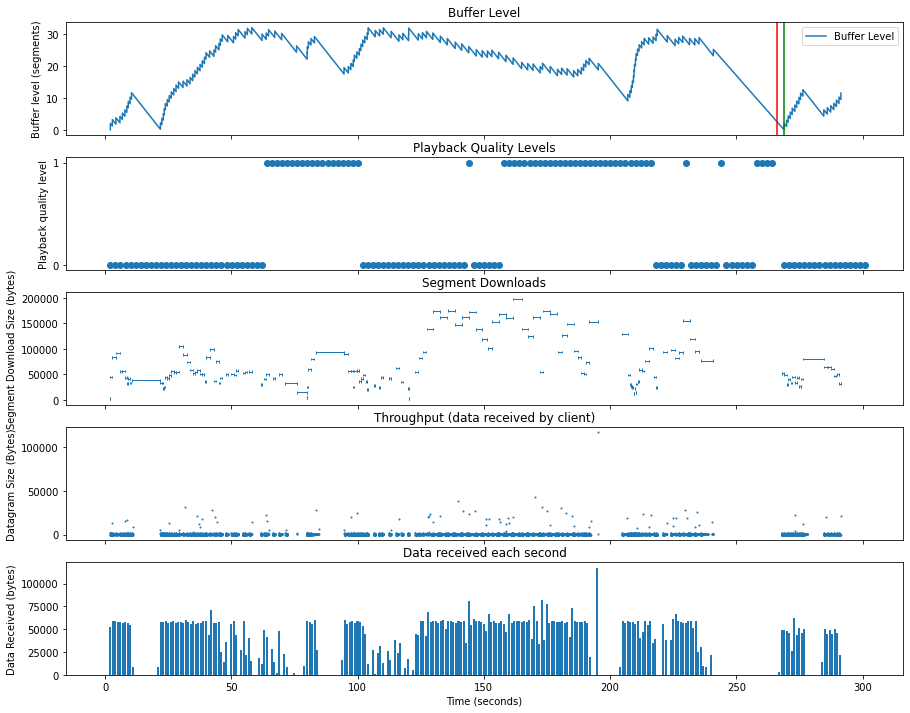



festive over QUIC @ 500Kbps with 2.0% loss


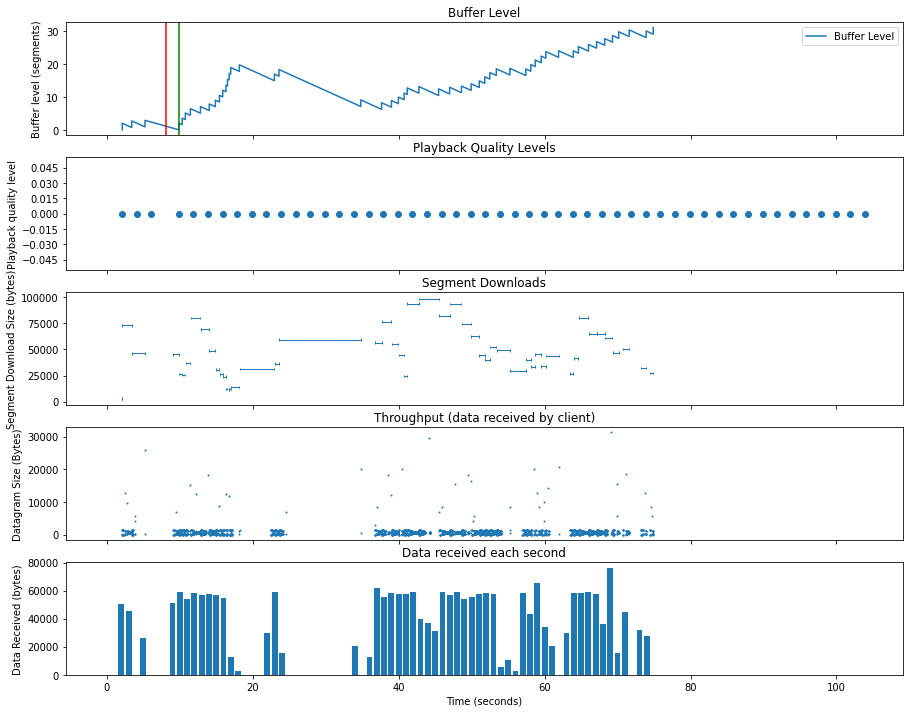



festive over QUIC @ 1Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 324.066


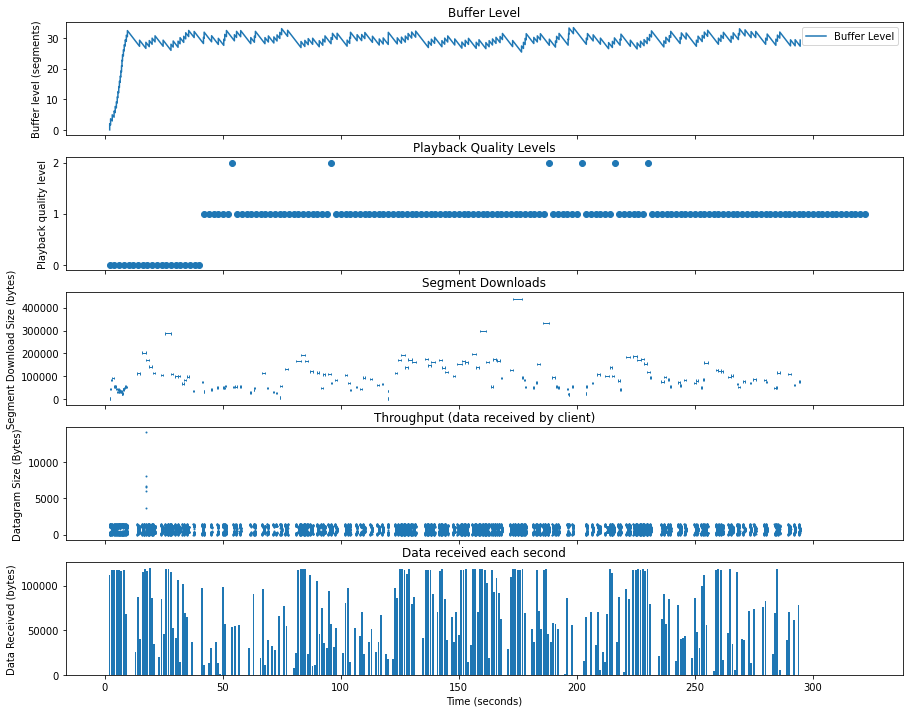



festive over QUIC @ 1Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 256.71


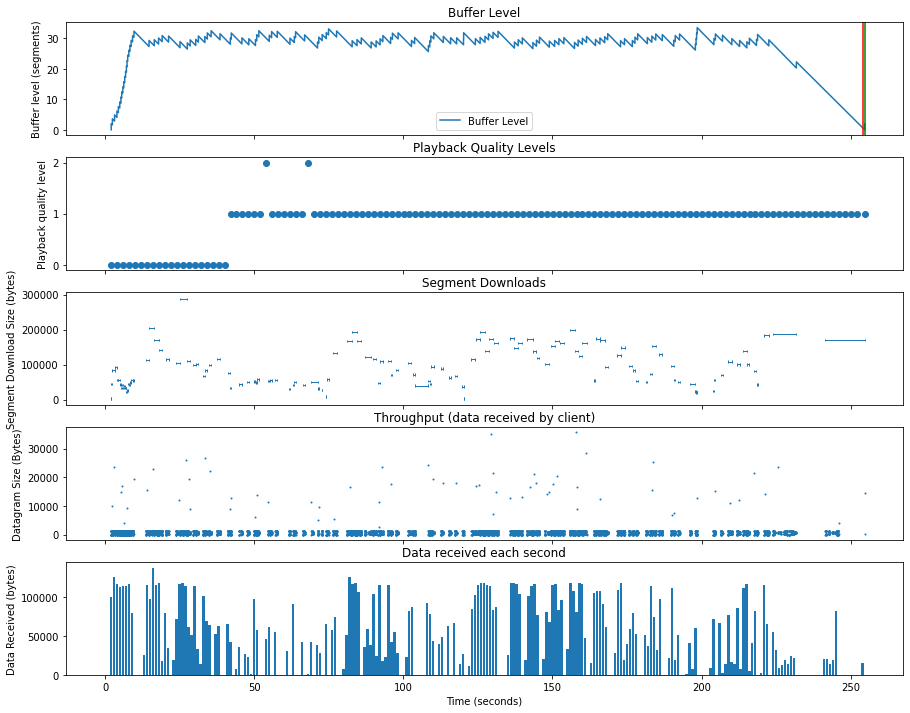



festive over QUIC @ 1Mbps with 2.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 124.066


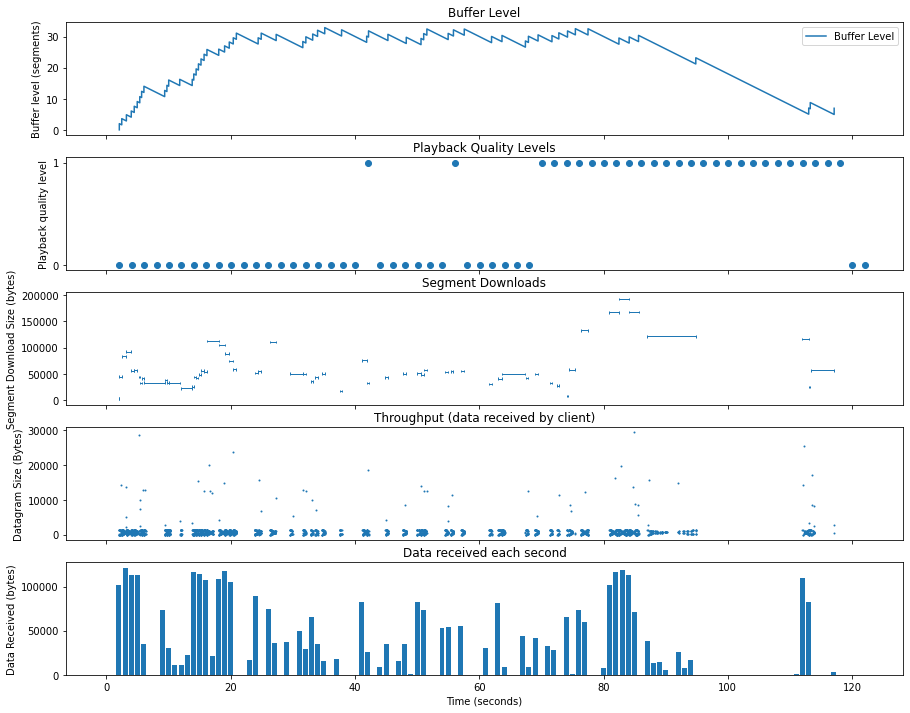



festive over QUIC @ 1Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 112.883


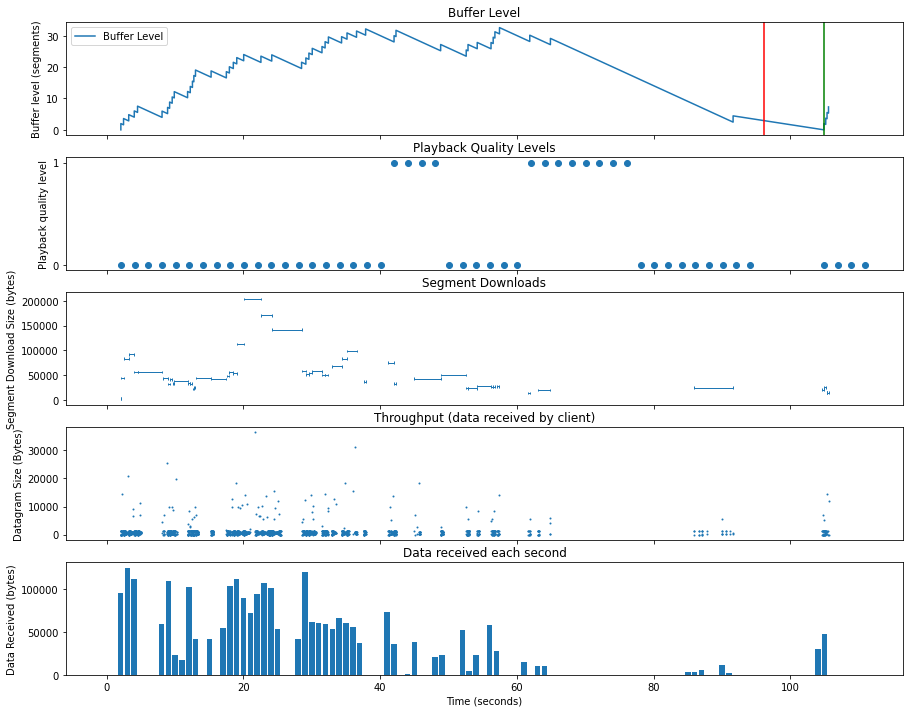



festive over QUIC @ 2Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 184.045


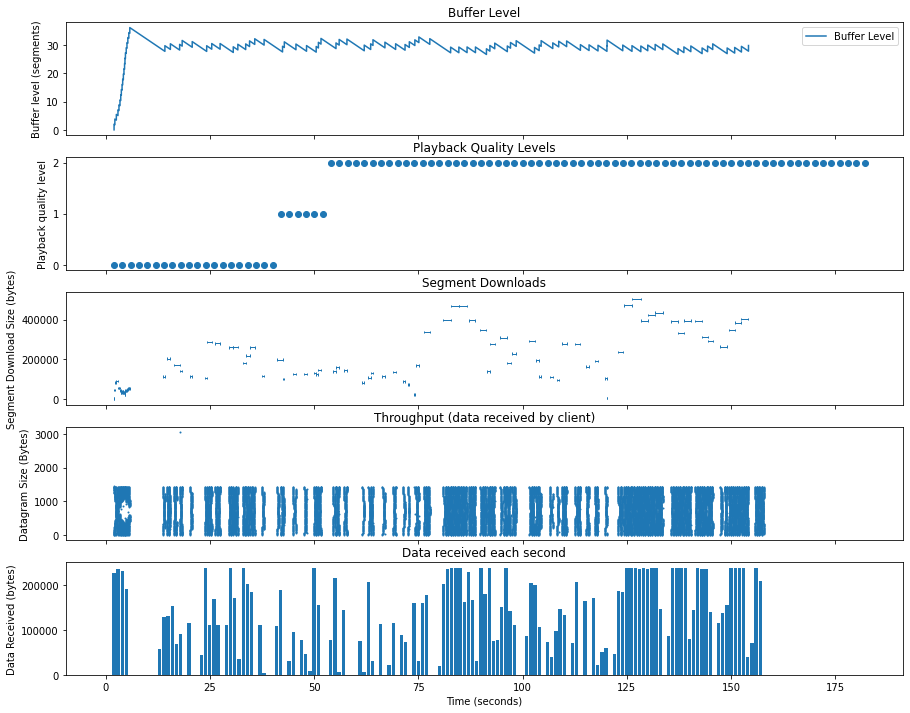



festive over QUIC @ 2Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 170.045


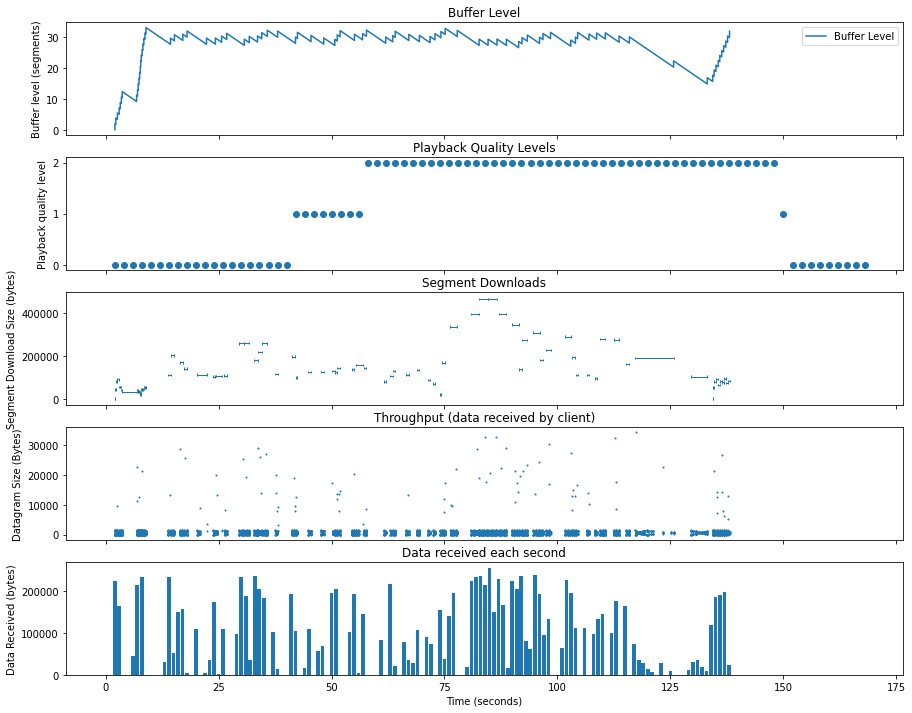



festive over QUIC @ 2Mbps with 2.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 146.045


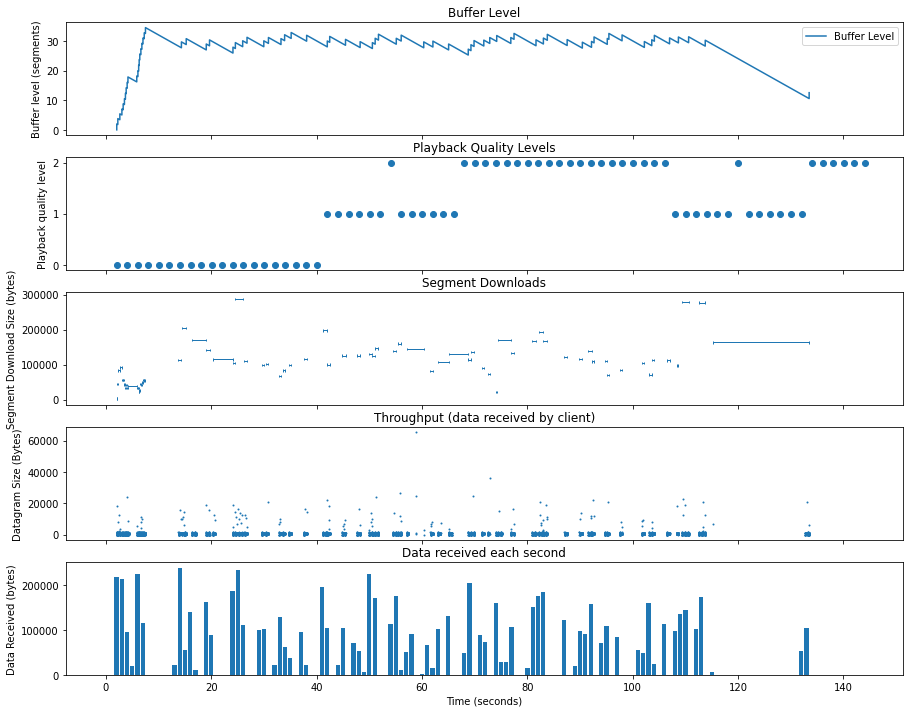



festive over QUIC @ 2Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 326.045


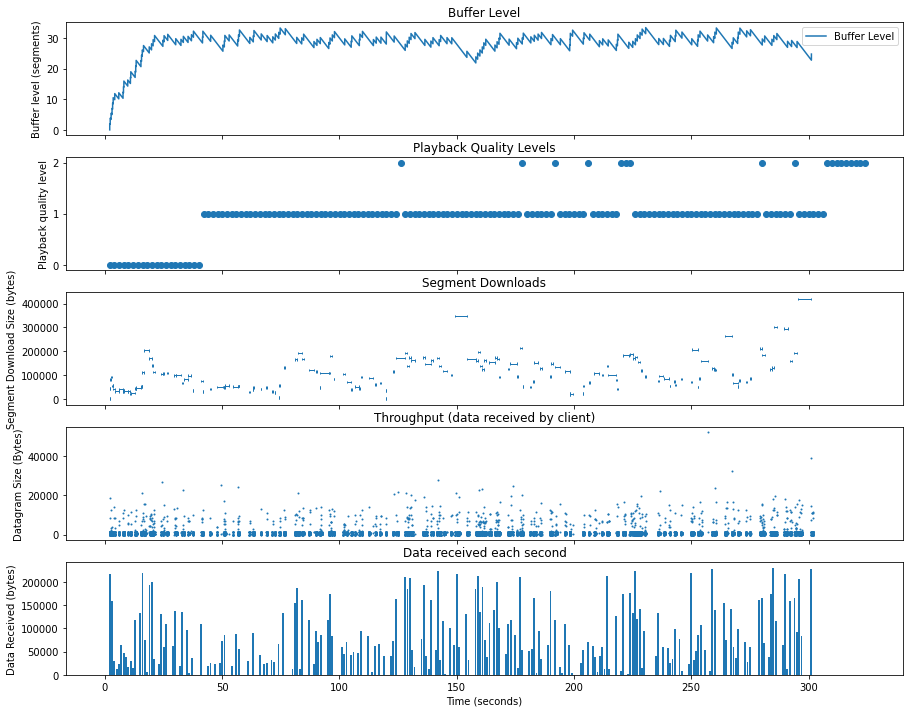



festive over QUIC @ 3Mbps with 0.0% loss


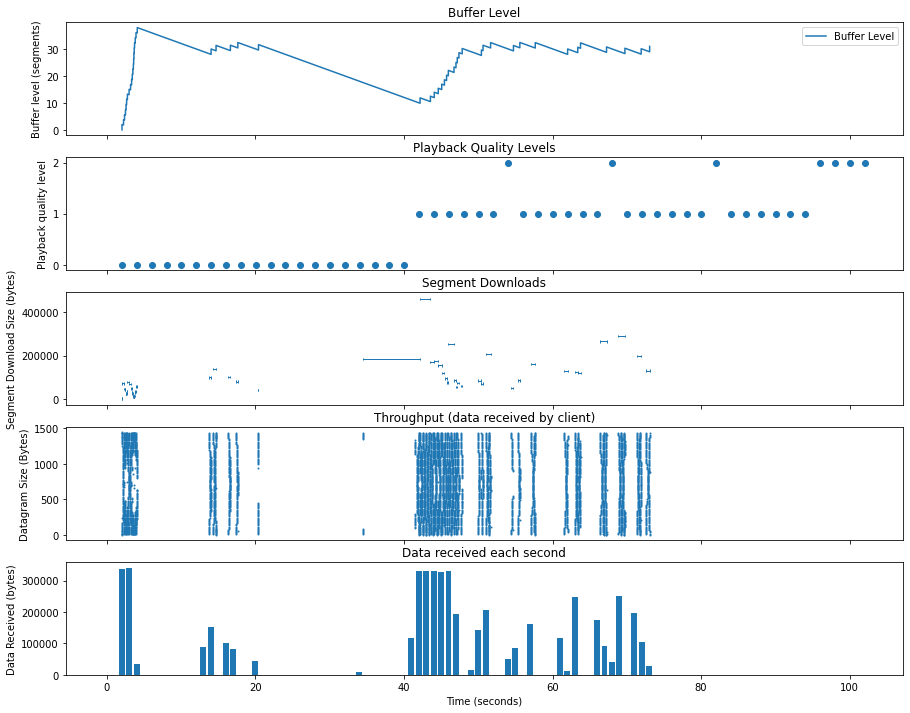



festive over QUIC @ 3Mbps with 1.0% loss


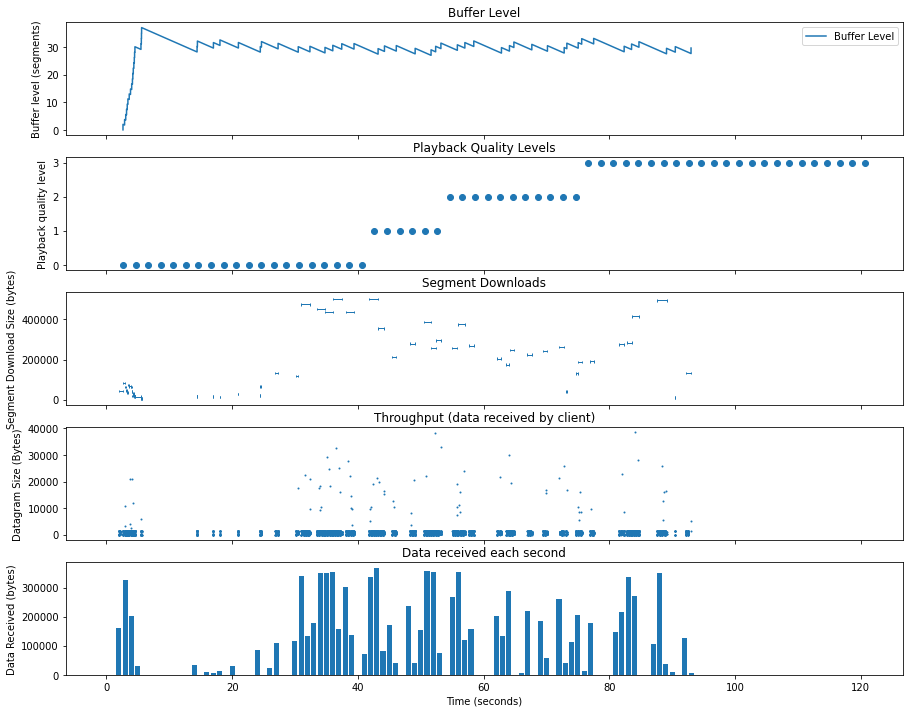



festive over QUIC @ 3Mbps with 2.0% loss


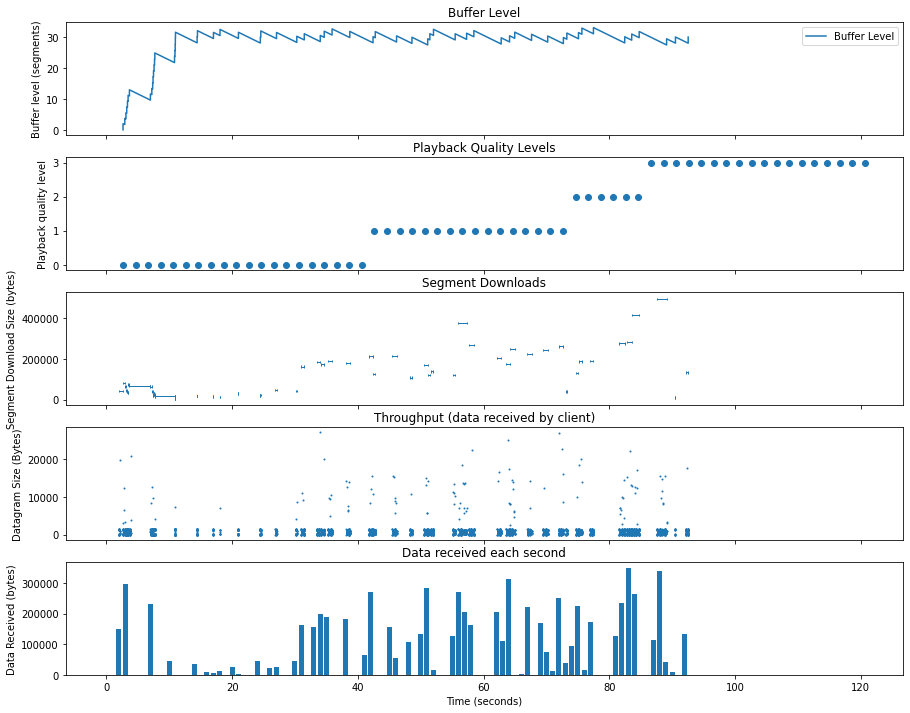



festive over QUIC @ 3Mbps with 5.0% loss


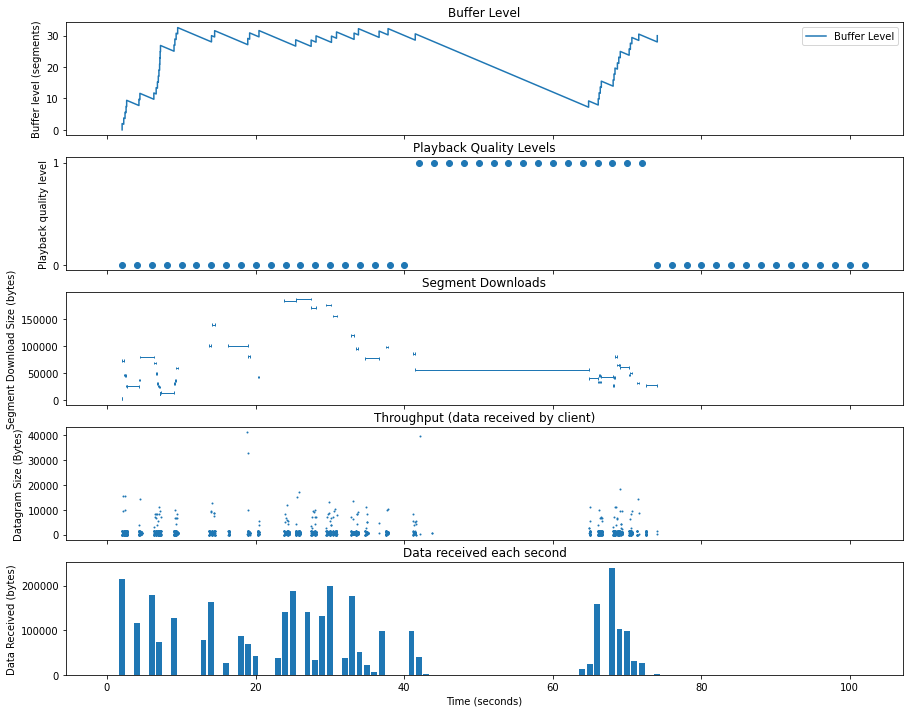



festive over QUIC @ 5Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 110.95


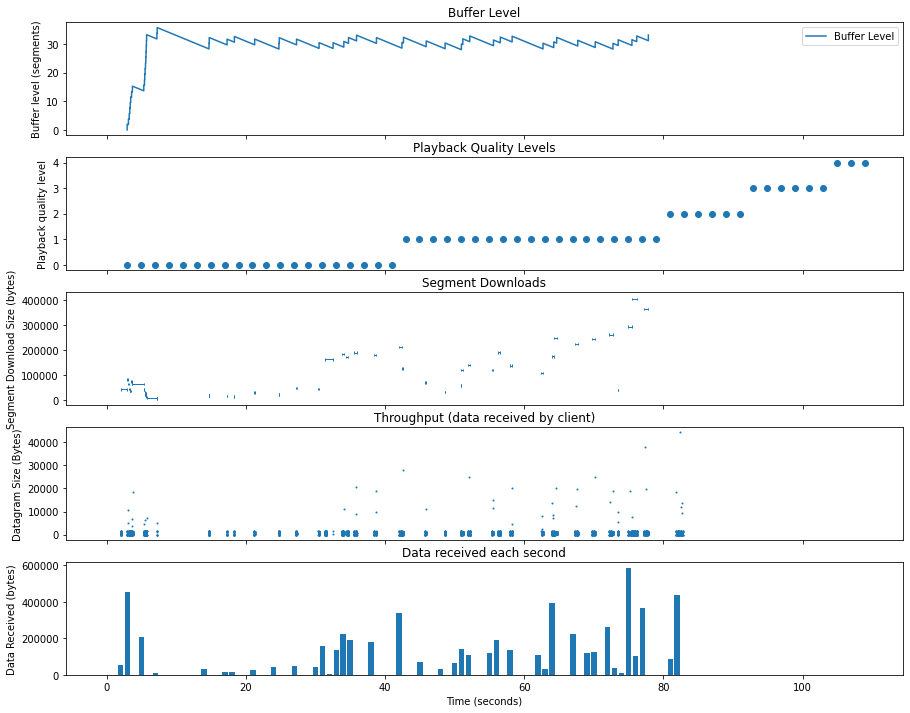



festive over QUIC @ 5Mbps with 2.0% loss


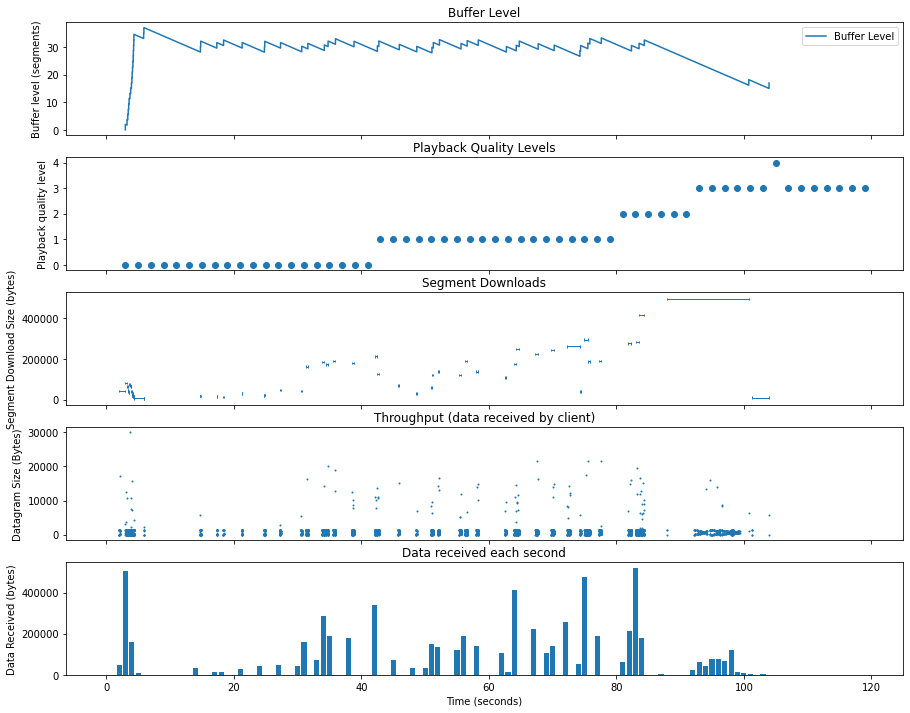



festive over QUIC @ 5Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 112.036


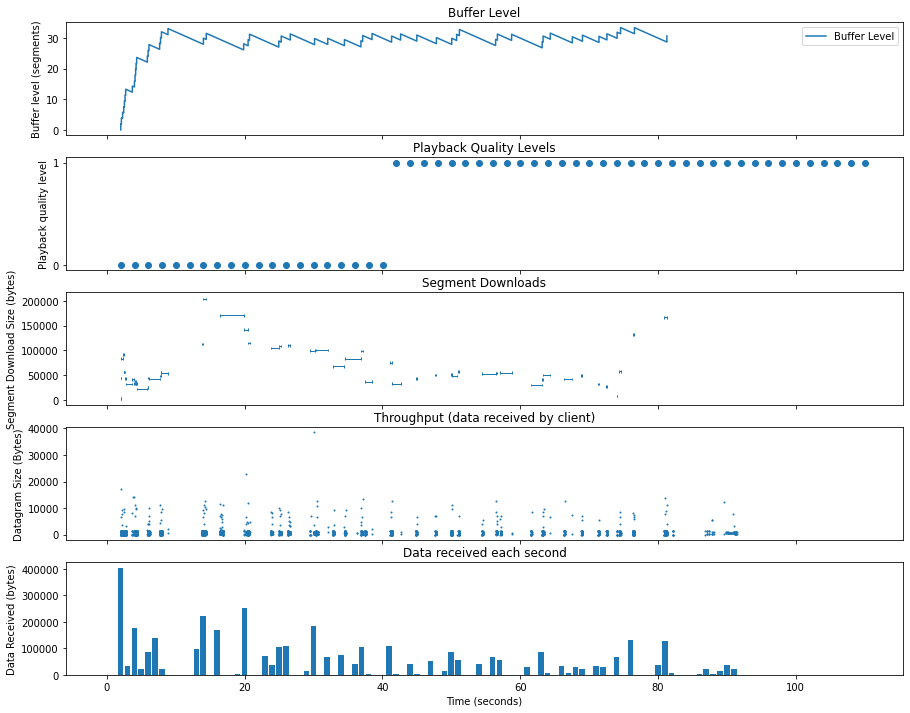



tobasco over QUIC @ 500Kbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 306.097


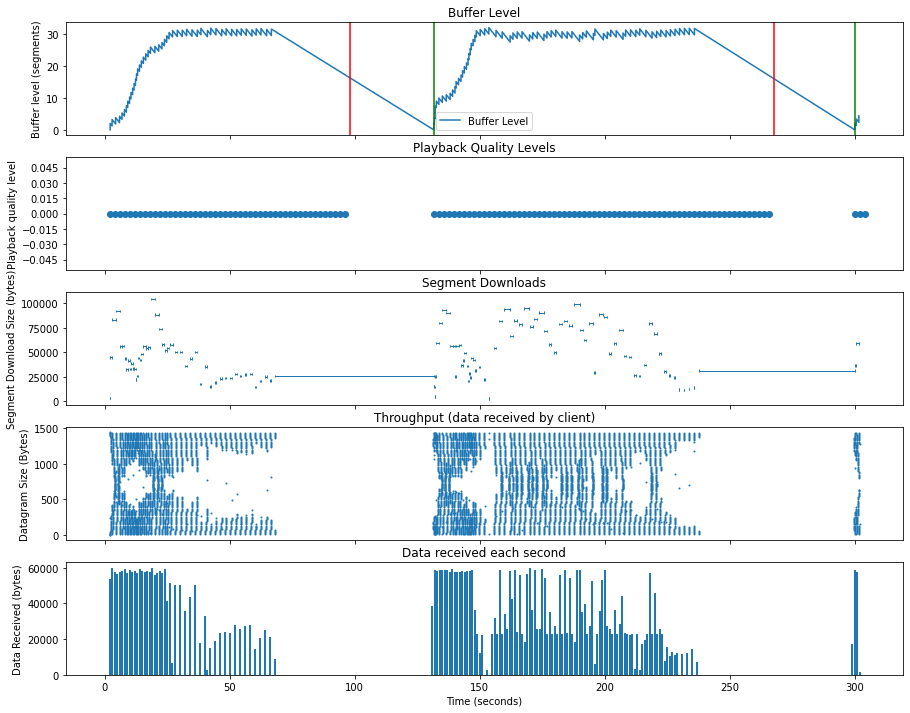



tobasco over QUIC @ 500Kbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 330.123


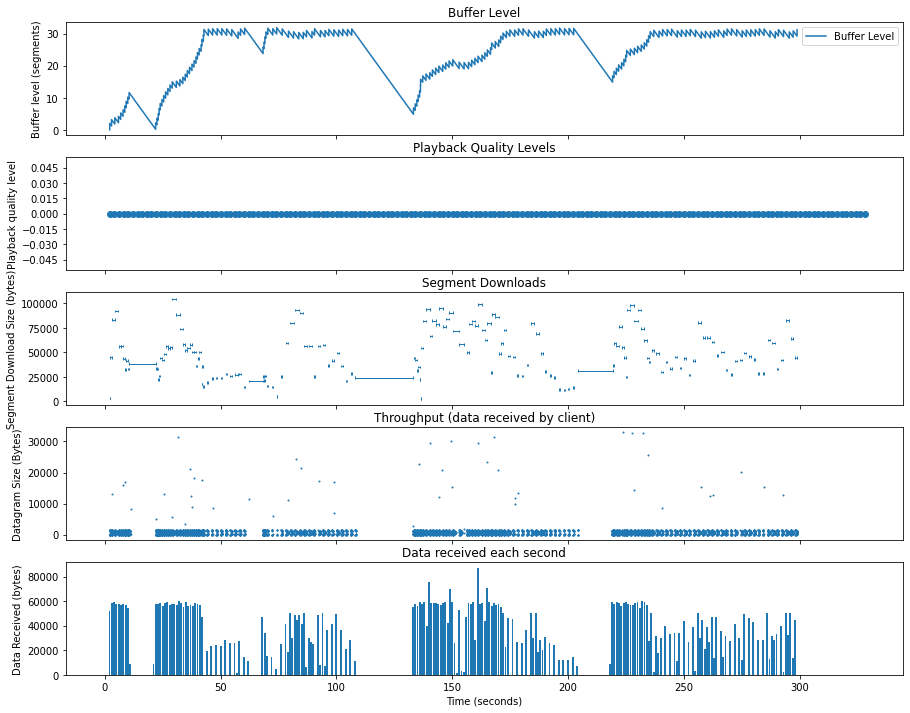



tobasco over QUIC @ 500Kbps with 2.0% loss


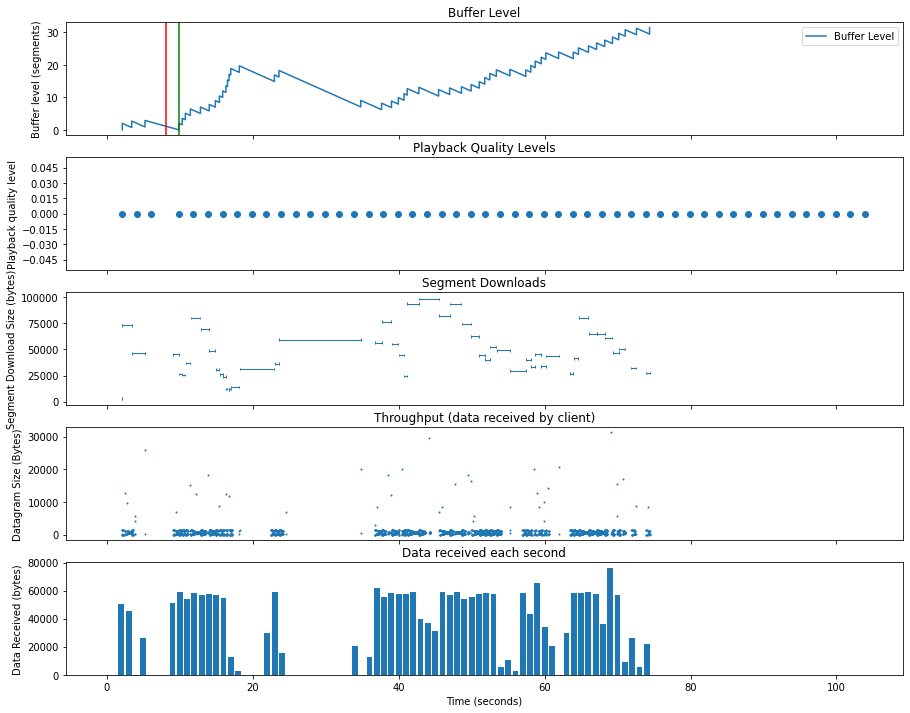



tobasco over QUIC @ 1Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 120.415


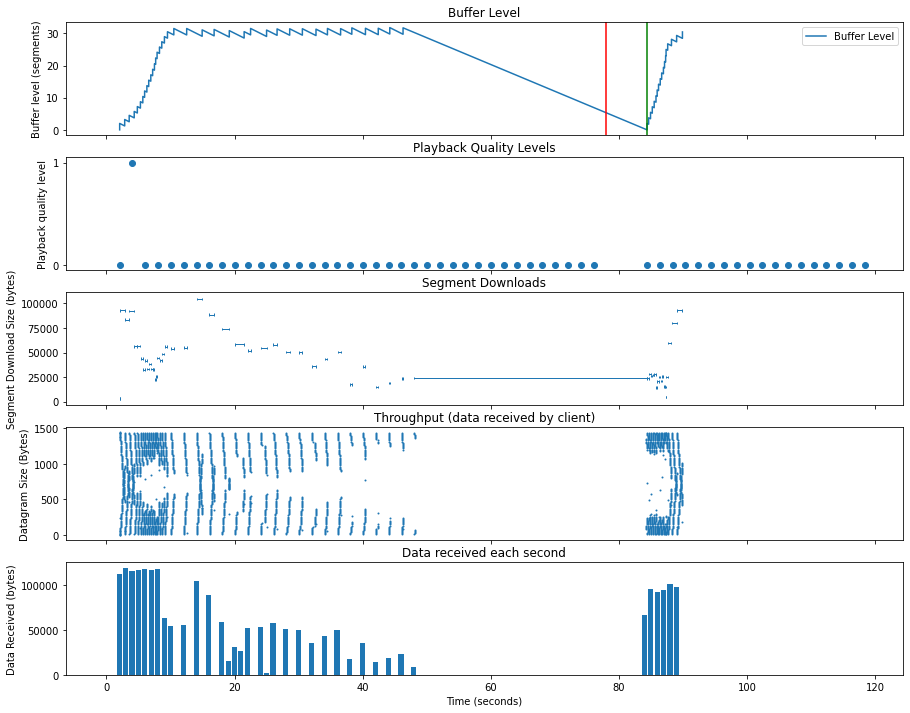



tobasco over QUIC @ 1Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 117.58


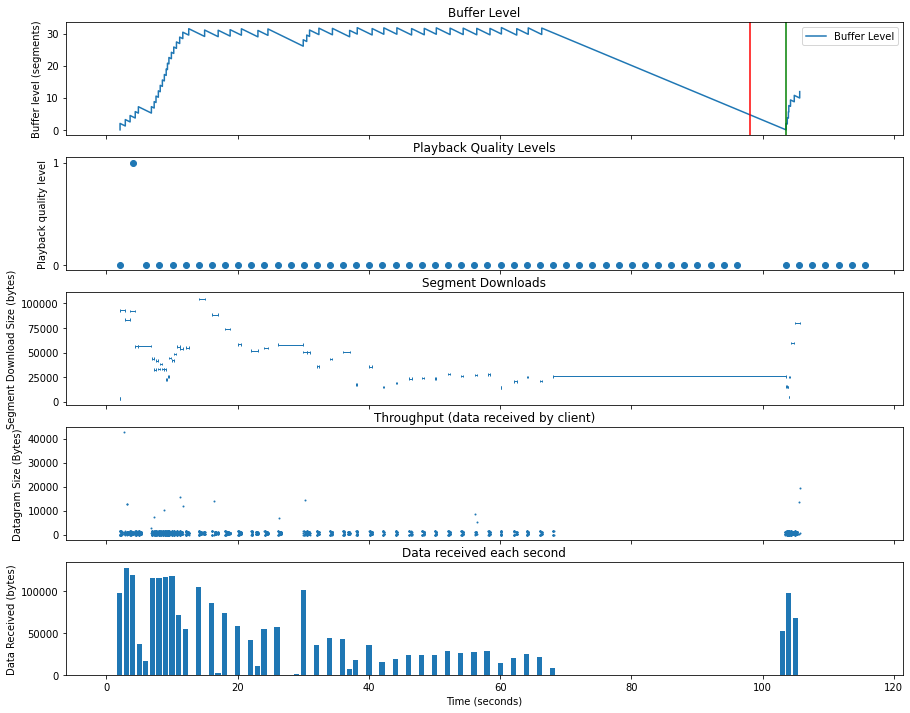



tobasco over QUIC @ 1Mbps with 2.0% loss


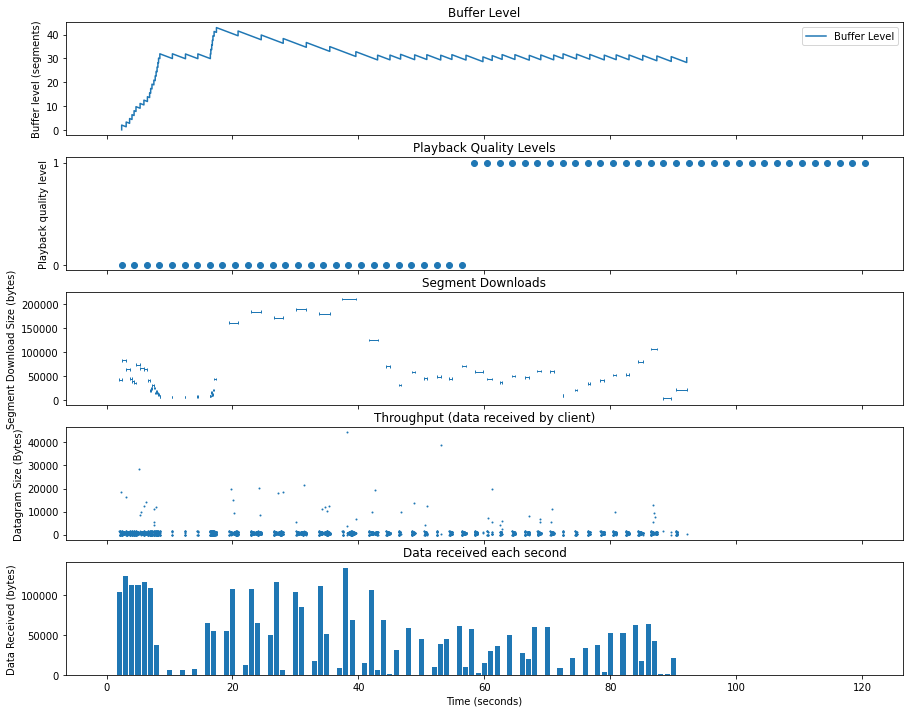



tobasco over QUIC @ 1Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 150.991


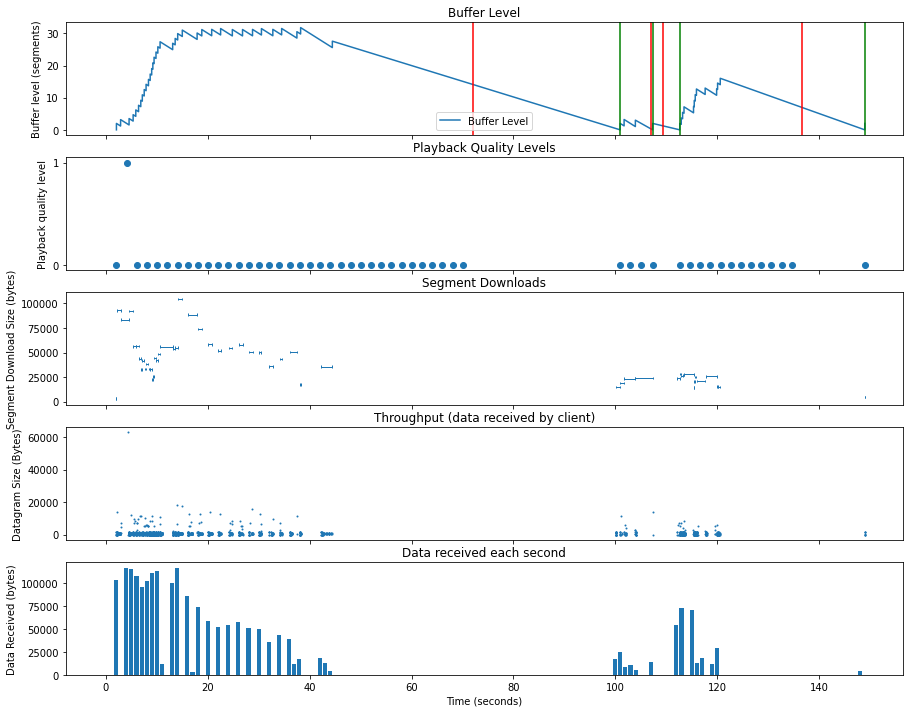



tobasco over QUIC @ 2Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 286.045


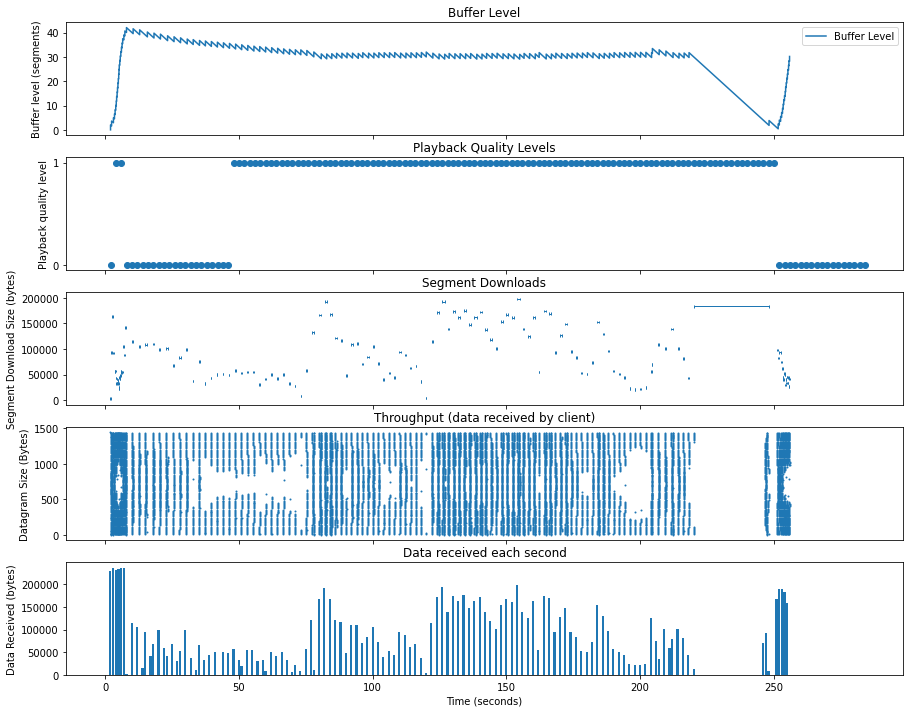



tobasco over QUIC @ 2Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 196.045


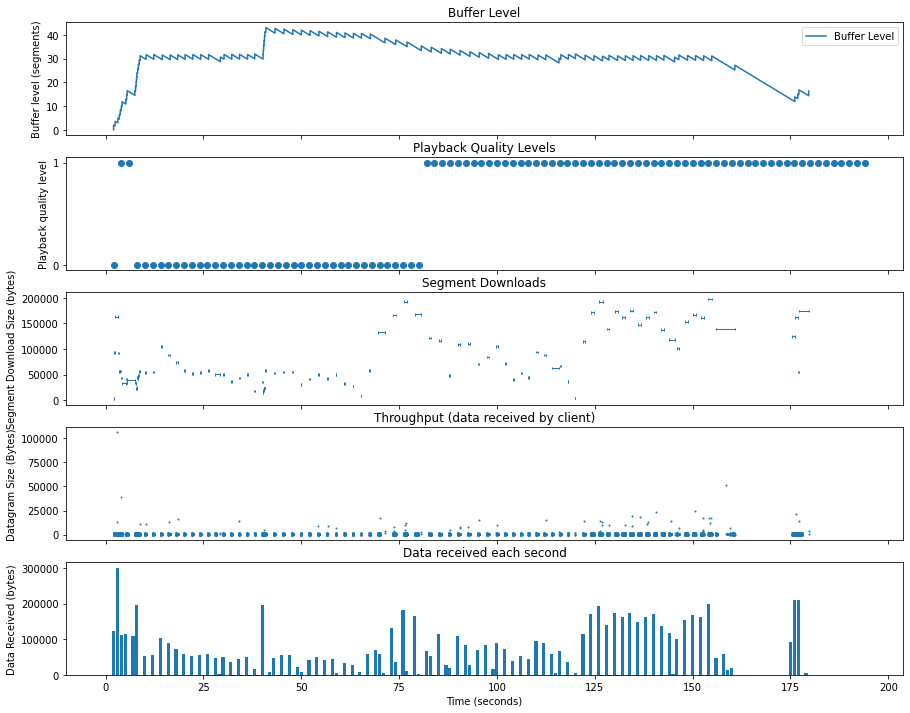



tobasco over QUIC @ 2Mbps with 2.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 332.045


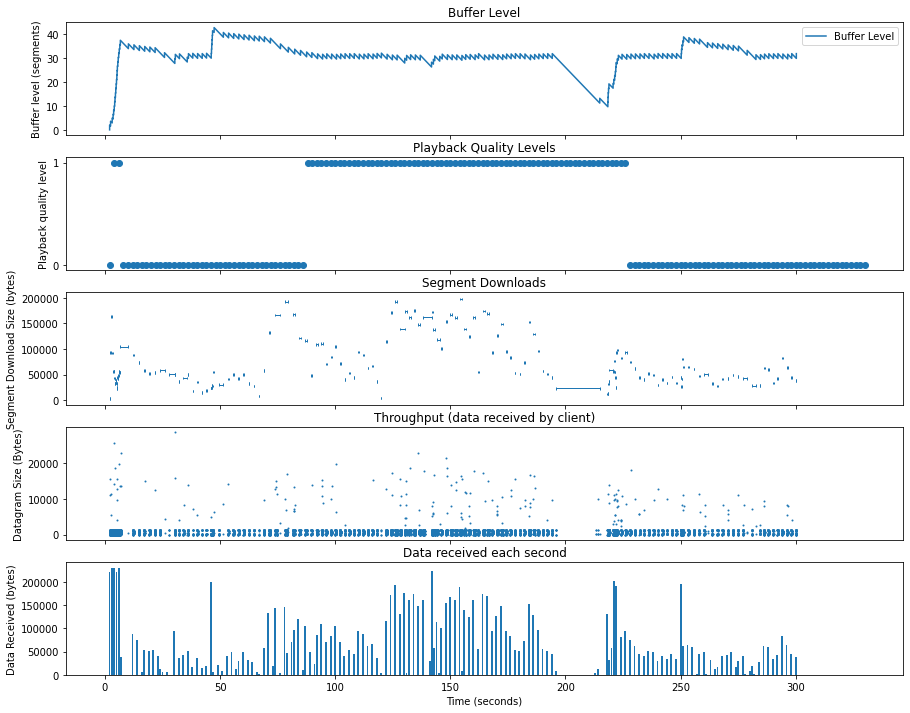



tobasco over QUIC @ 2Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 142.045


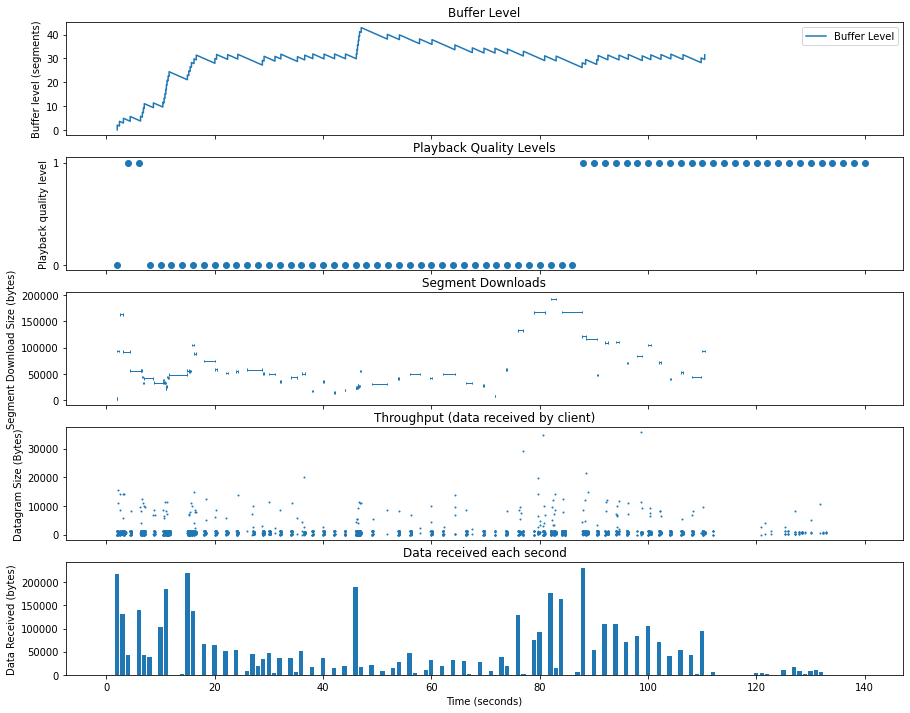



tobasco over QUIC @ 3Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 184.041


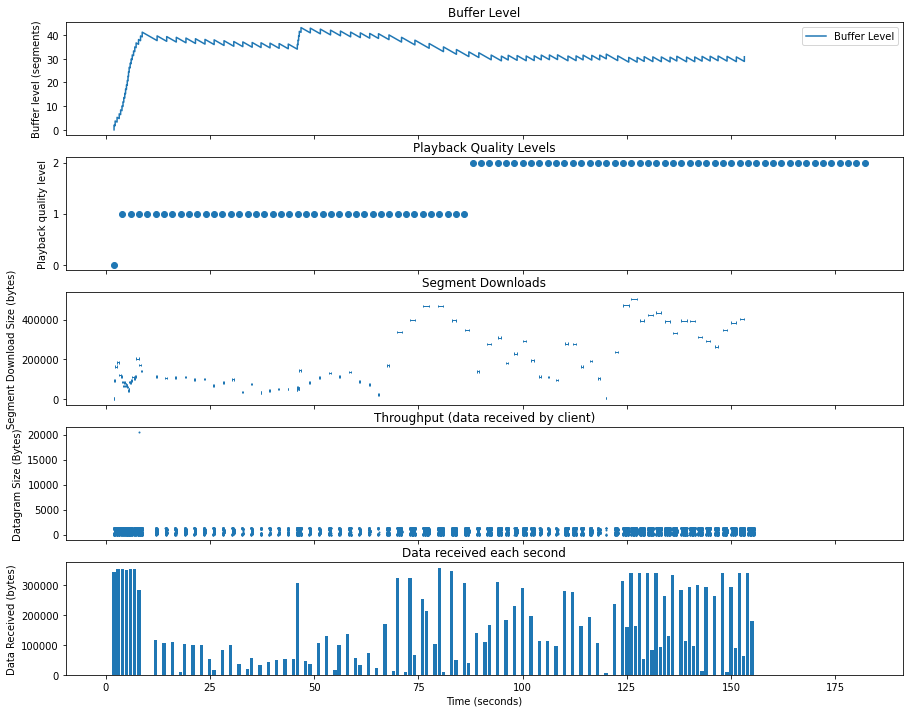



tobasco over QUIC @ 3Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 172.041


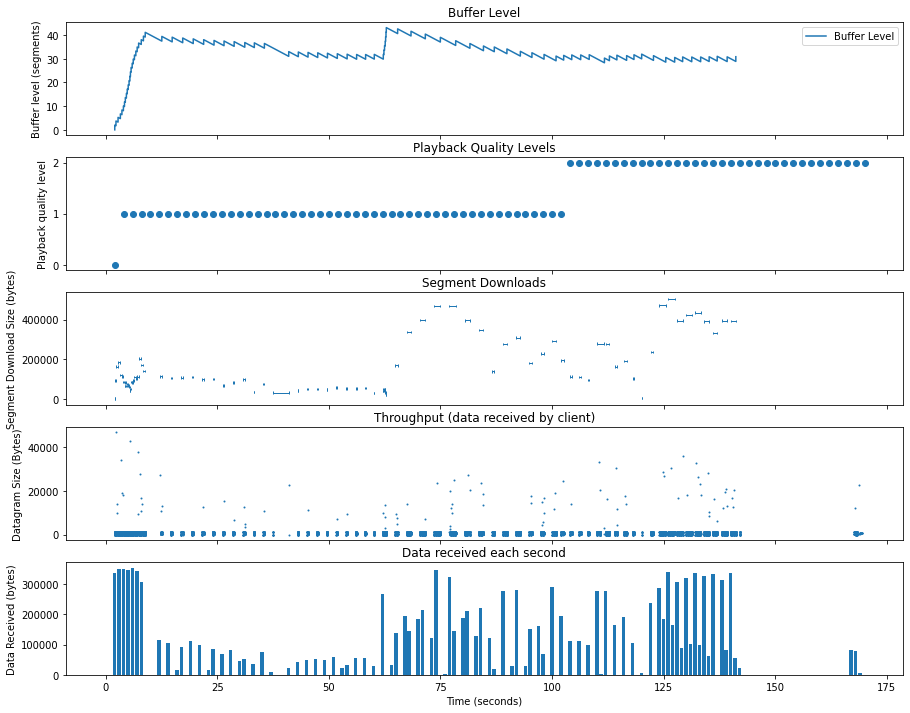



tobasco over QUIC @ 3Mbps with 2.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 152.041


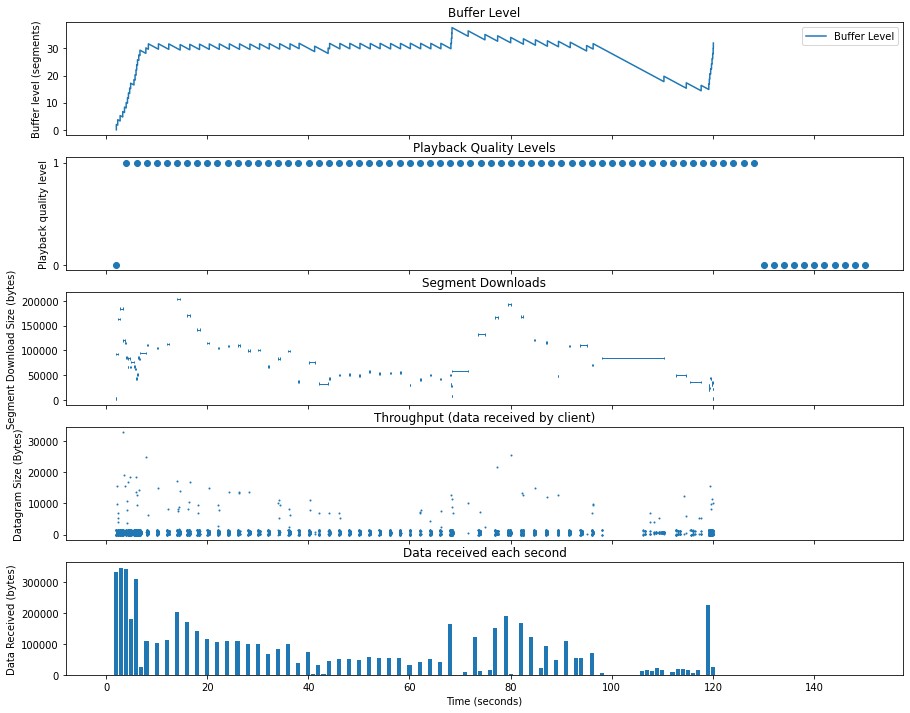



tobasco over QUIC @ 3Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 332.041


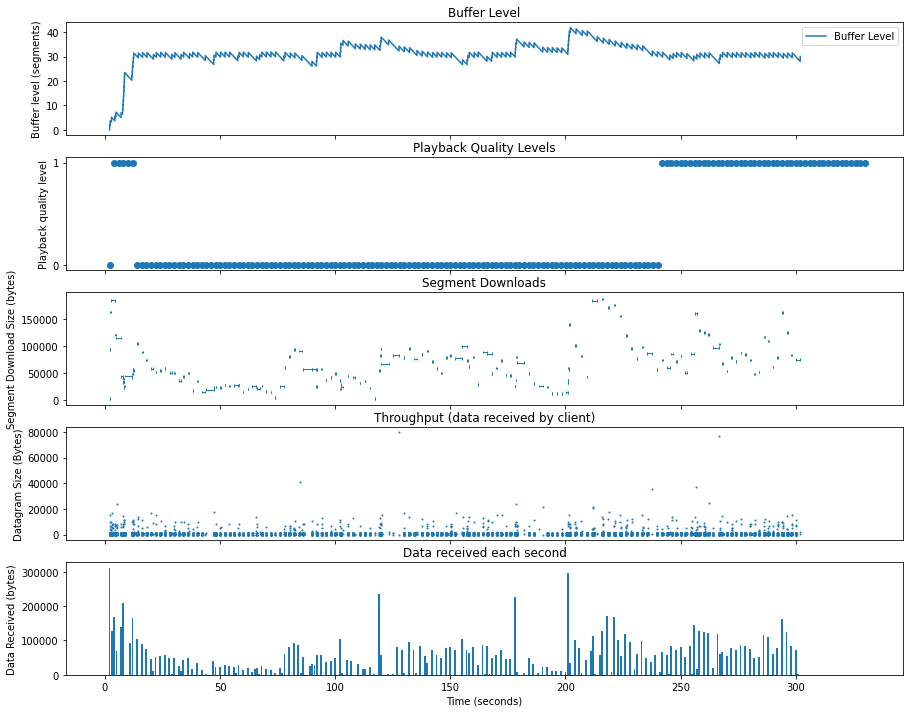



tobasco over QUIC @ 5Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 108.036


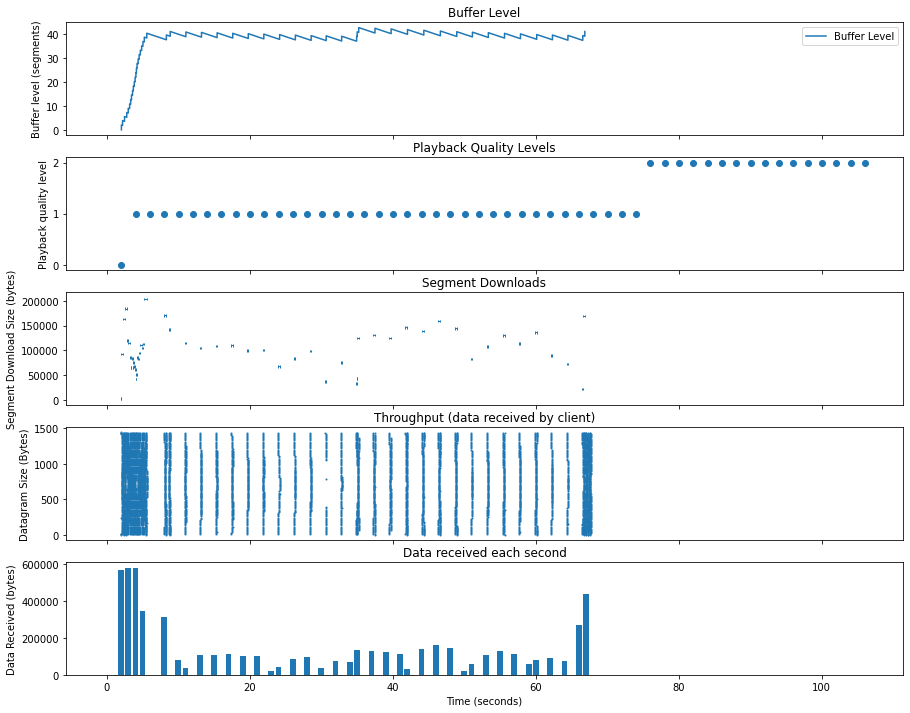



tobasco over QUIC @ 5Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 108.035


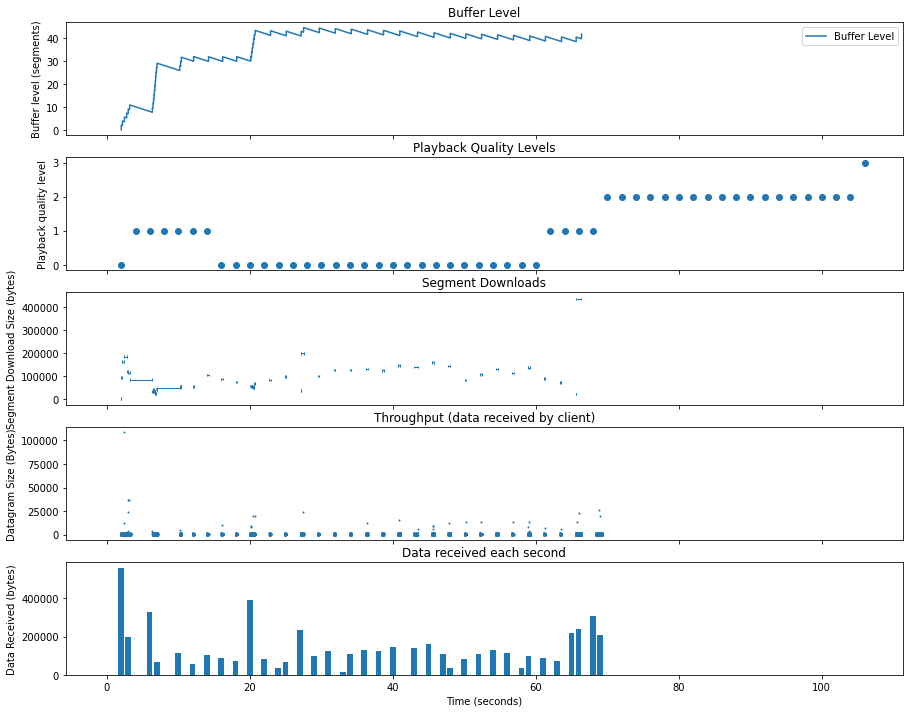



tobasco over QUIC @ 5Mbps with 2.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 108.036


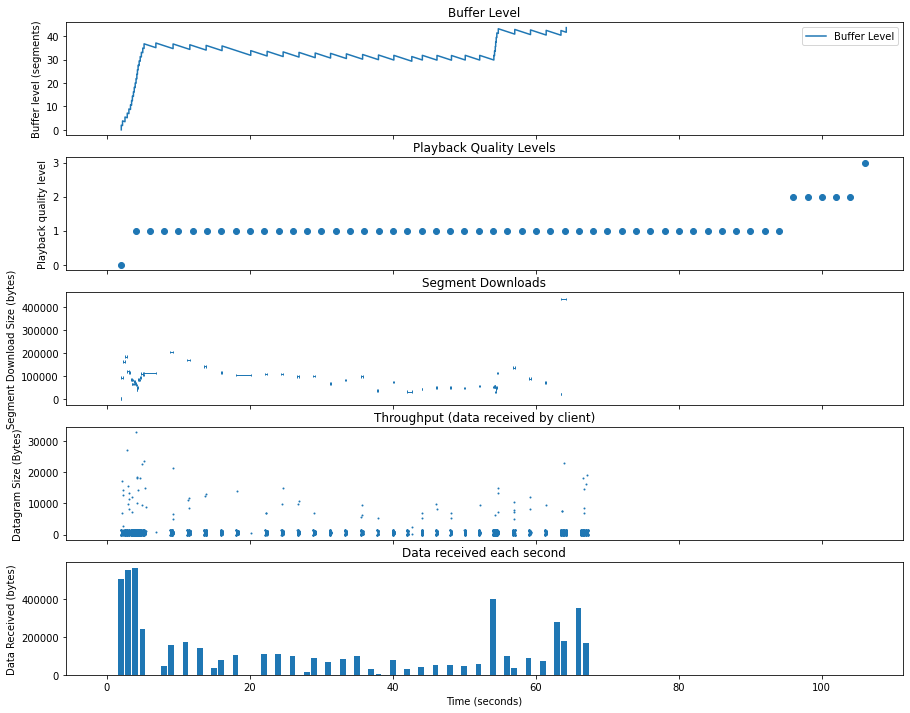



tobasco over QUIC @ 5Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 184.036


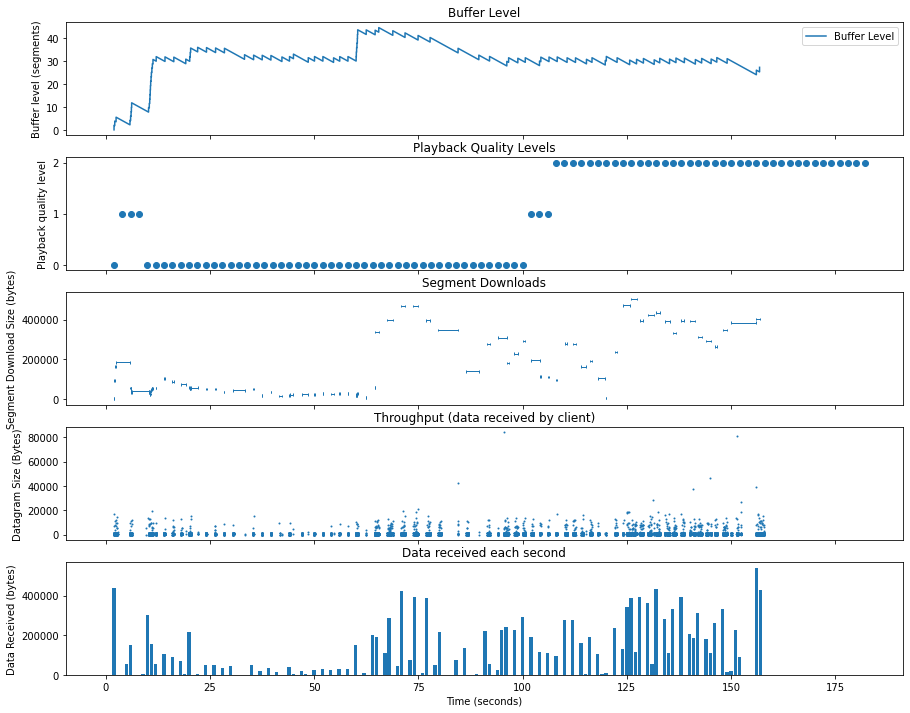

In [129]:
# Timelines for each QUIC run-through
for quicSim in allQuicSims:
    quicTitle = getDescription(quicSim)
    print (quicTitle)
    graphFullTimeline(quicSim)
    print ("\n")

festive over QUIC @ 500Kbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 316.032


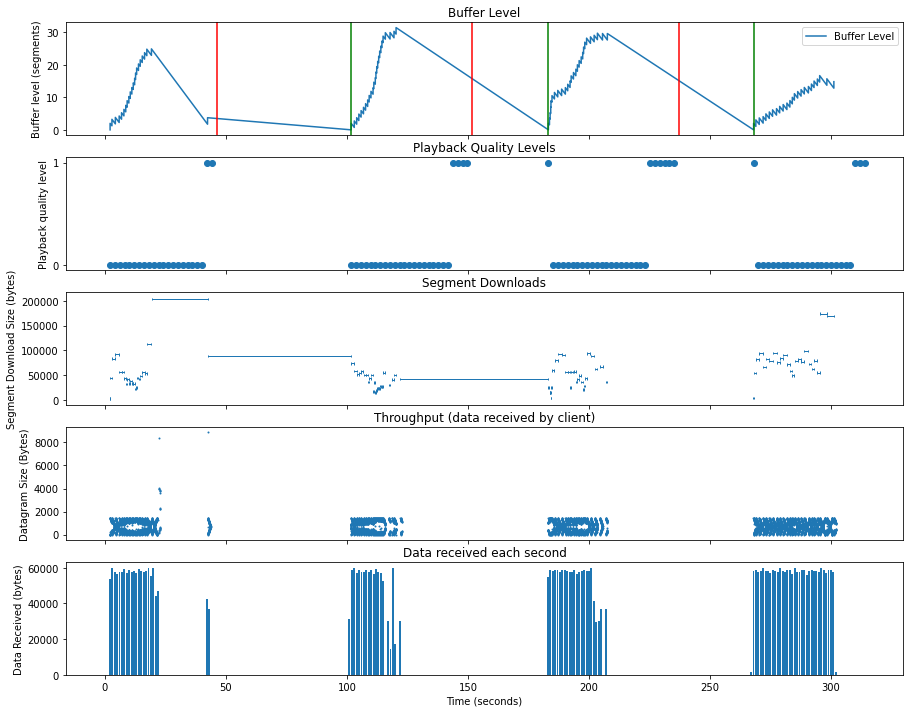



festive over QUIC @ 500Kbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 302.949


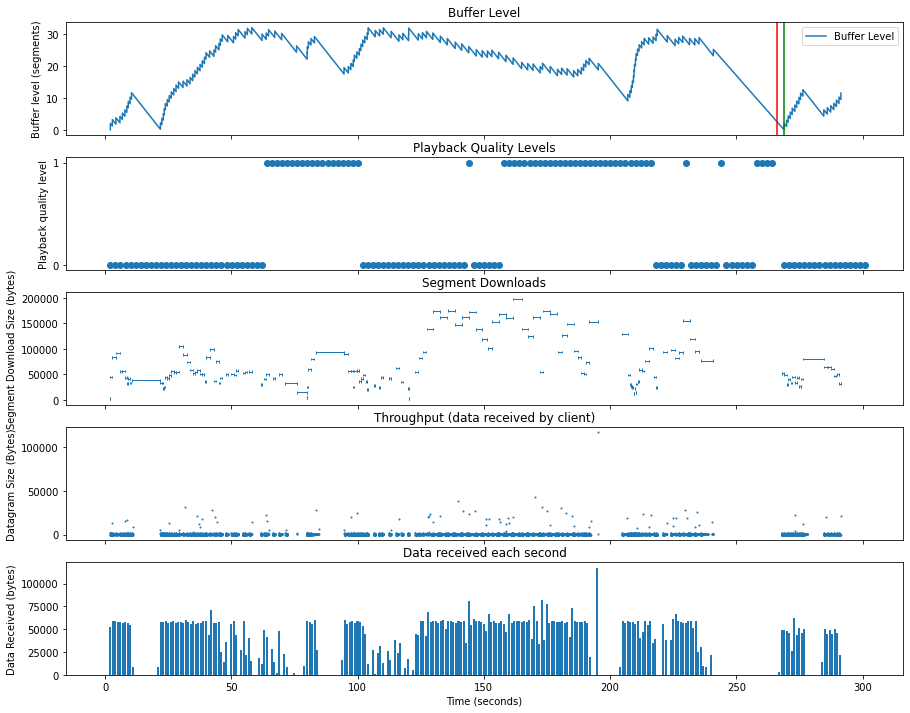



festive over QUIC @ 500Kbps with 2.0% loss


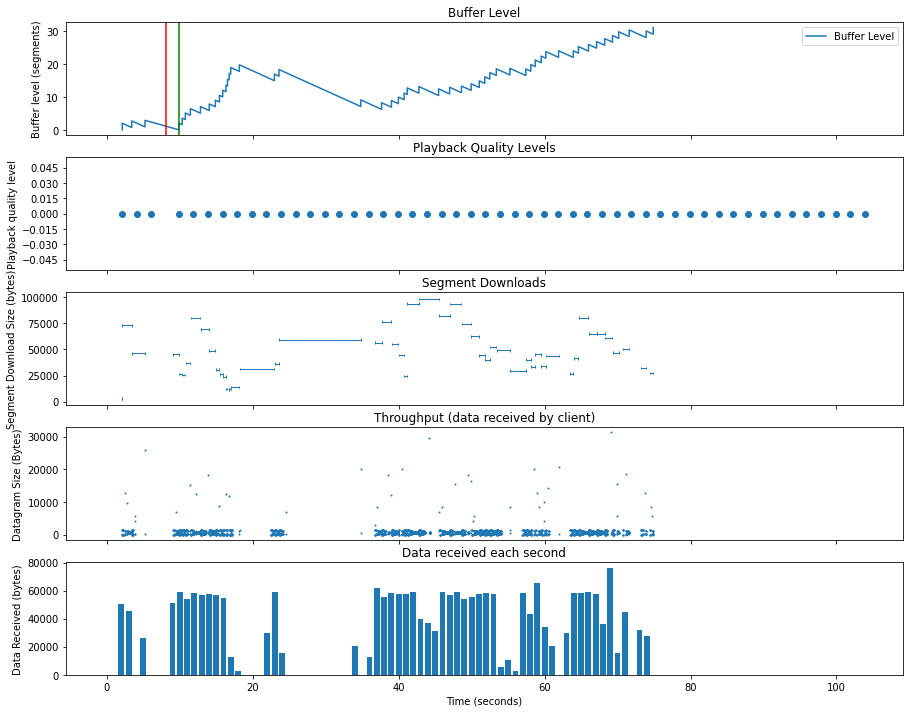



festive over QUIC @ 1Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 324.066


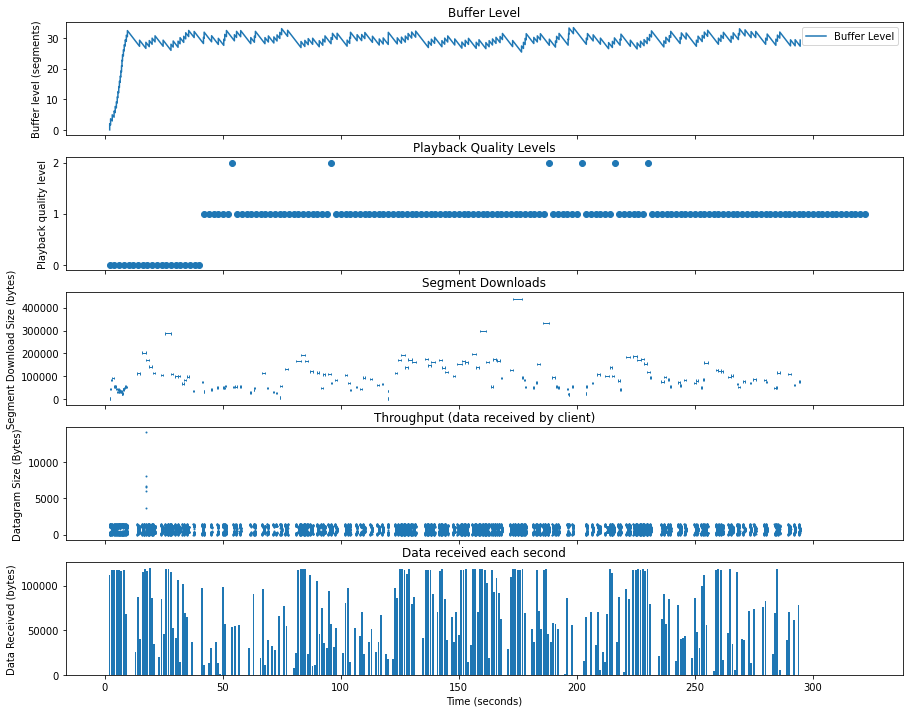



festive over QUIC @ 1Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 256.71


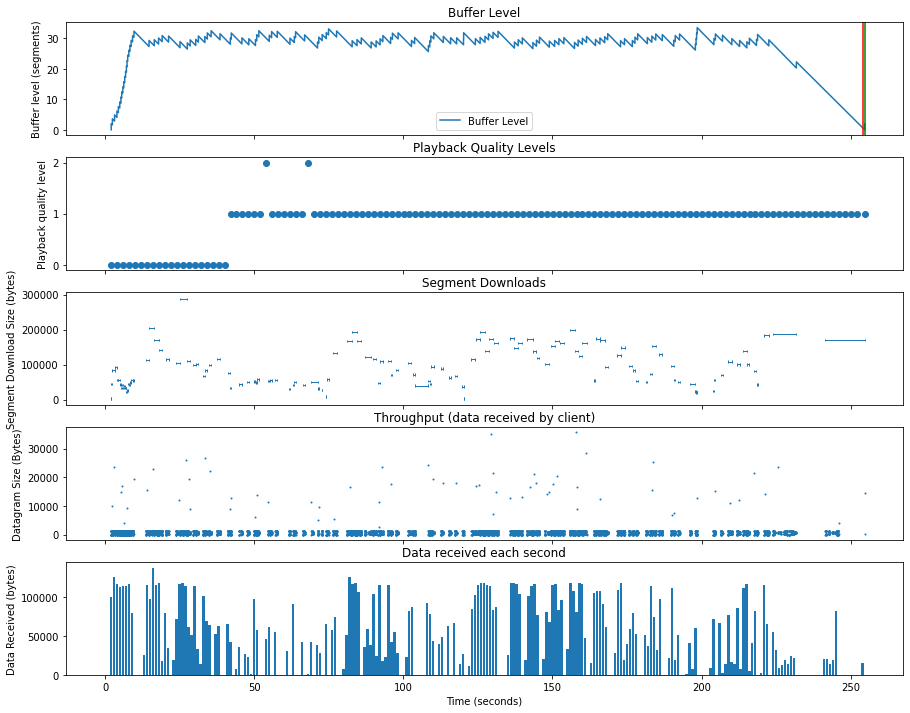



festive over QUIC @ 1Mbps with 2.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 124.066


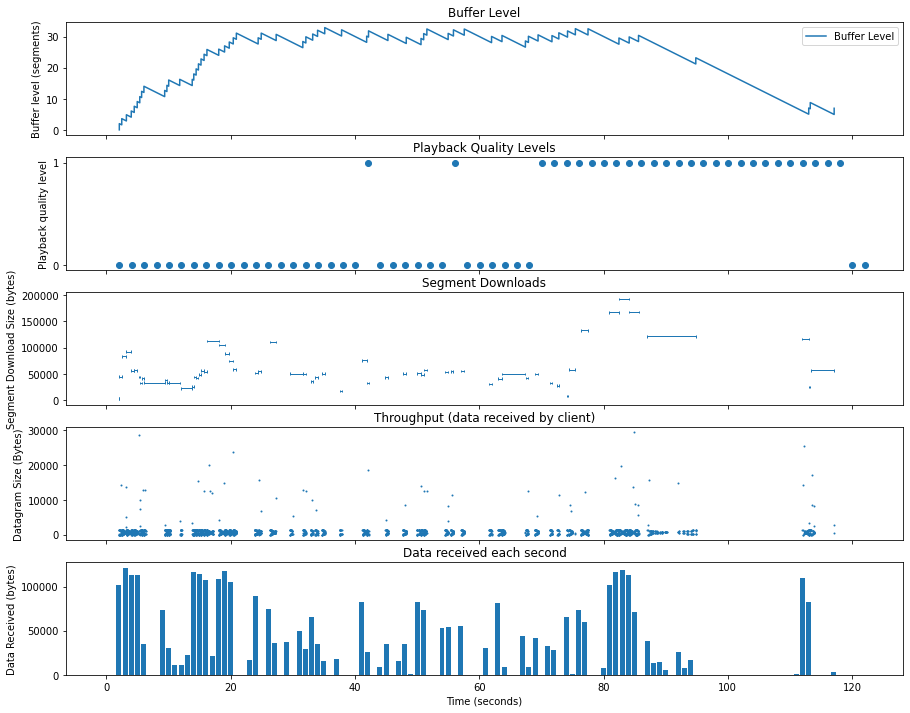



festive over QUIC @ 1Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 112.883


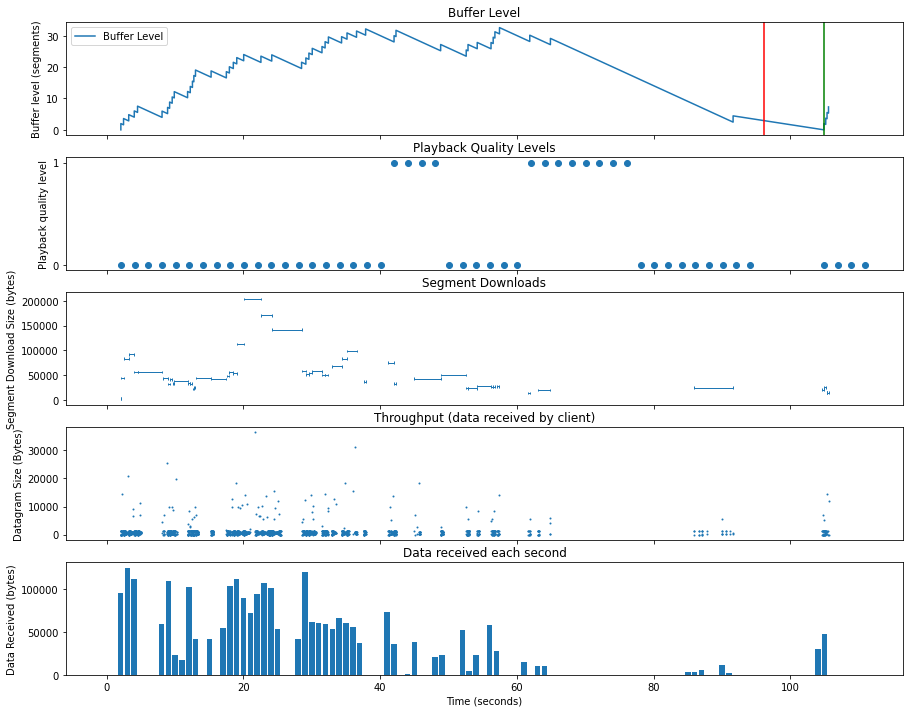



festive over QUIC @ 2Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 184.045


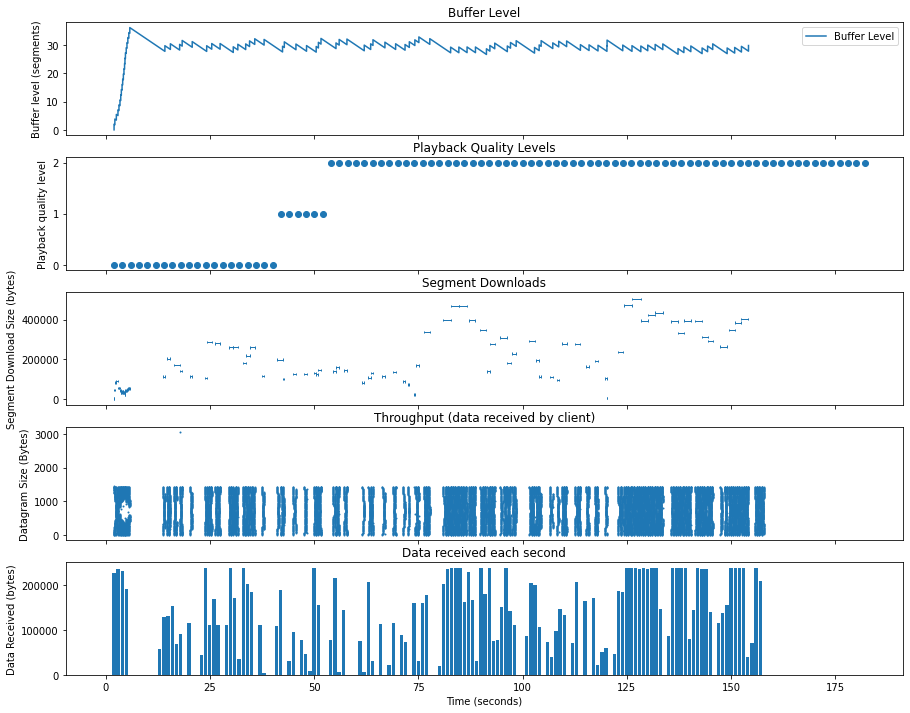



festive over QUIC @ 2Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 170.045


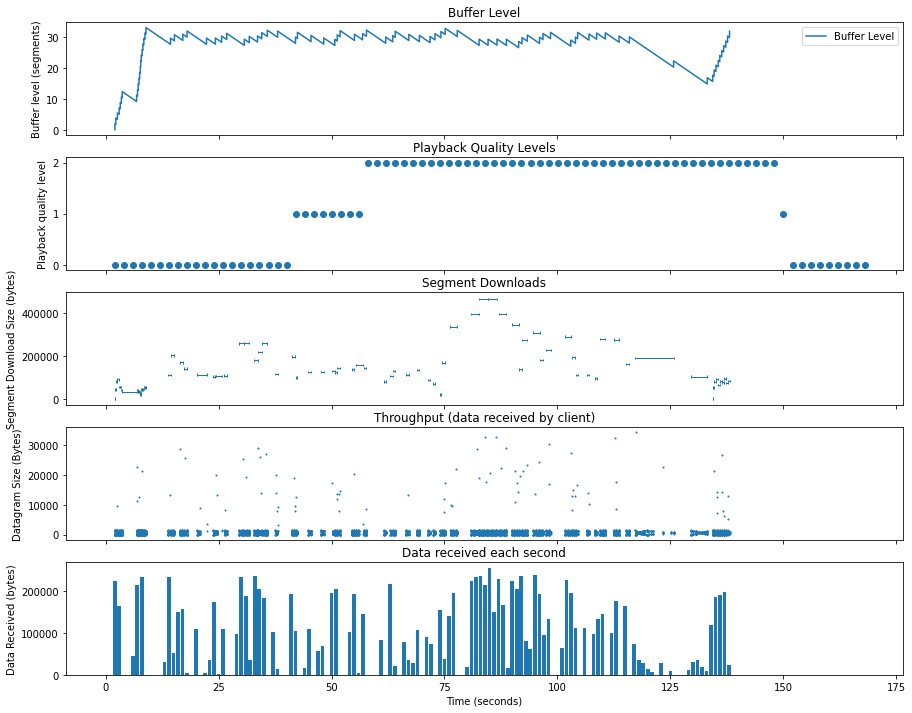



festive over QUIC @ 2Mbps with 2.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 146.045


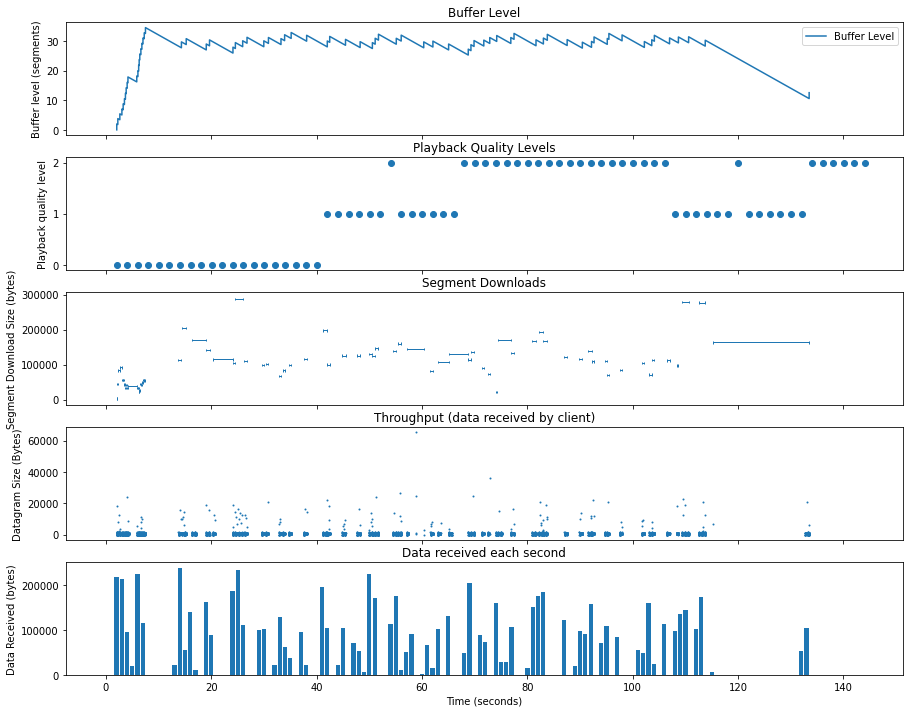



festive over QUIC @ 2Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 326.045


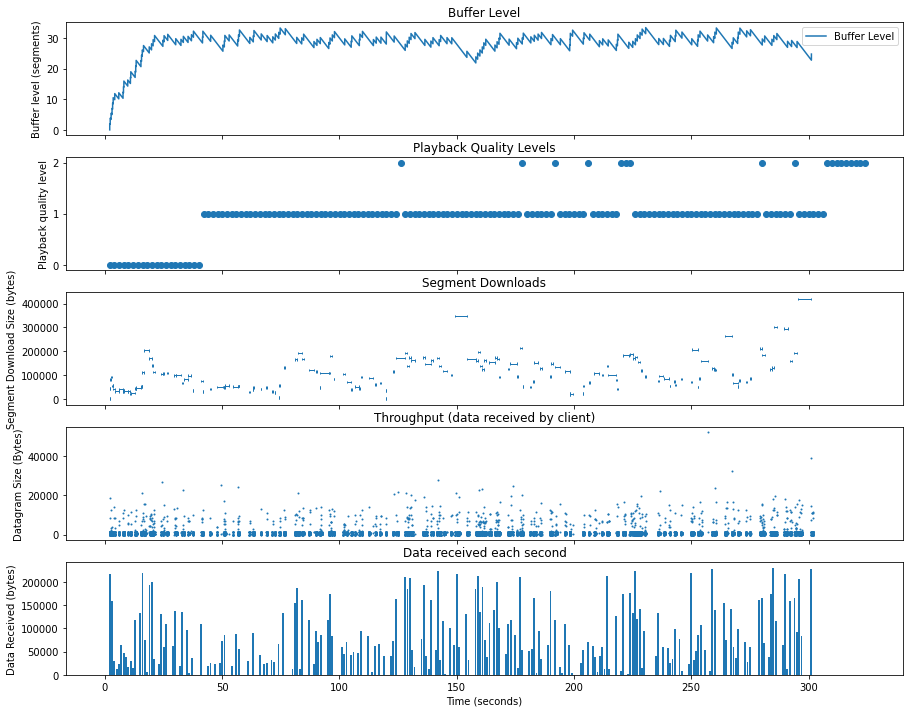



festive over QUIC @ 3Mbps with 0.0% loss


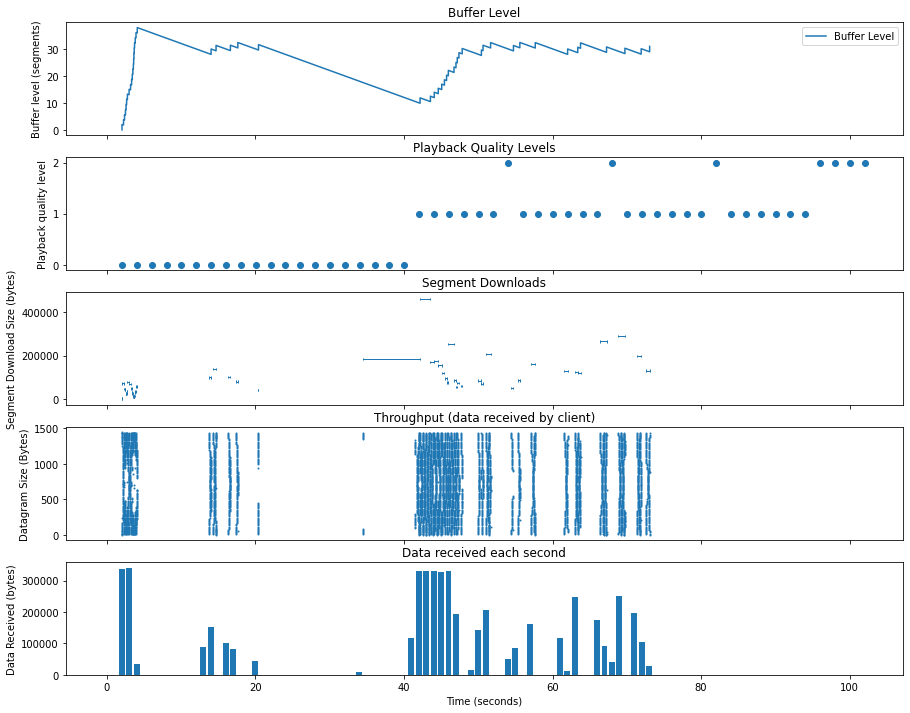



festive over QUIC @ 3Mbps with 1.0% loss


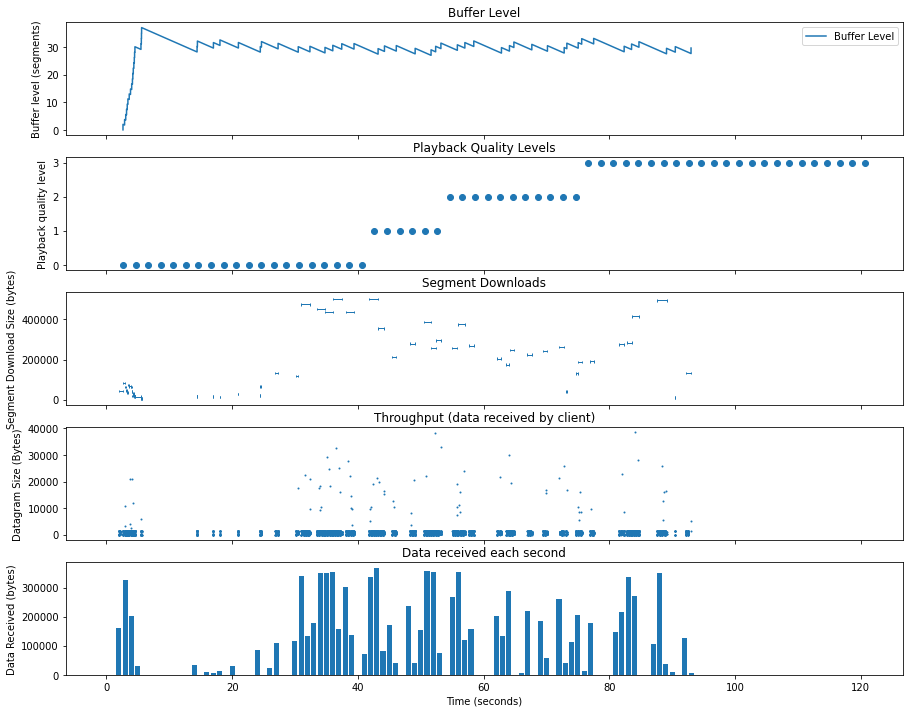



festive over QUIC @ 3Mbps with 2.0% loss


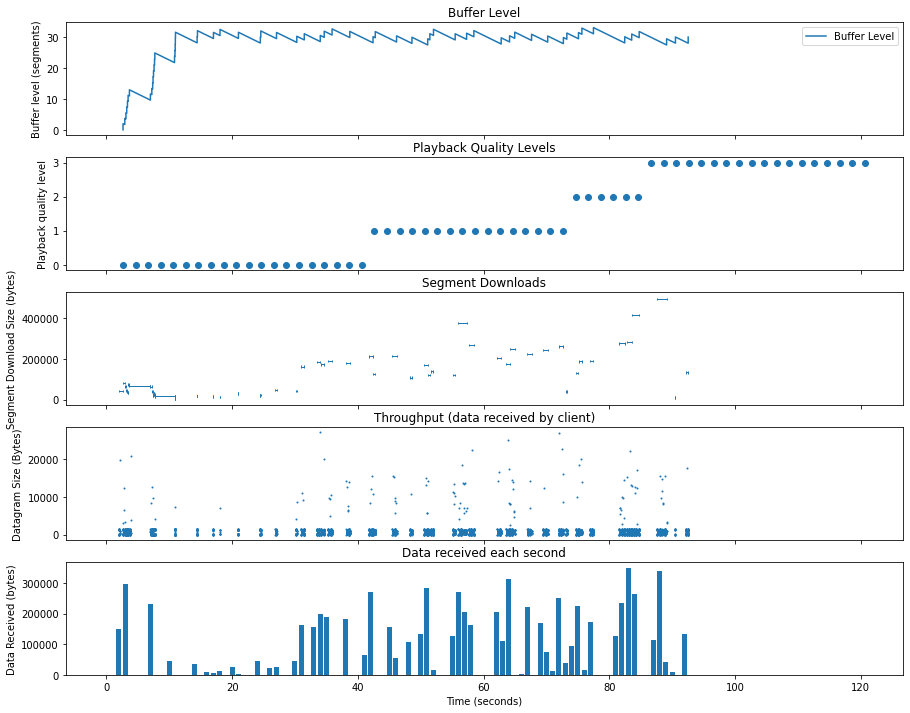



festive over QUIC @ 3Mbps with 5.0% loss


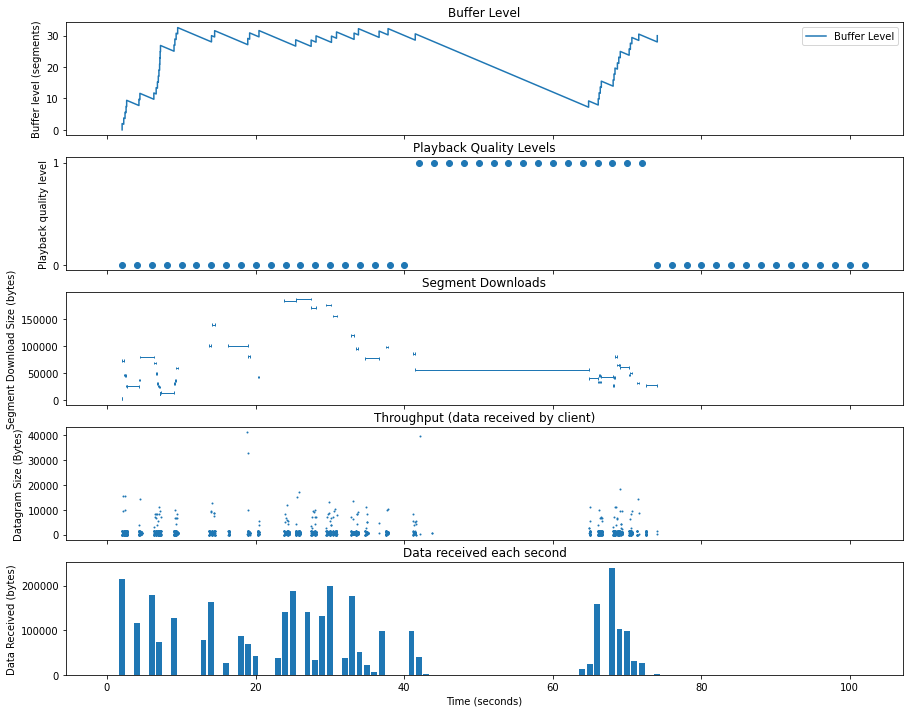



festive over QUIC @ 5Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 110.95


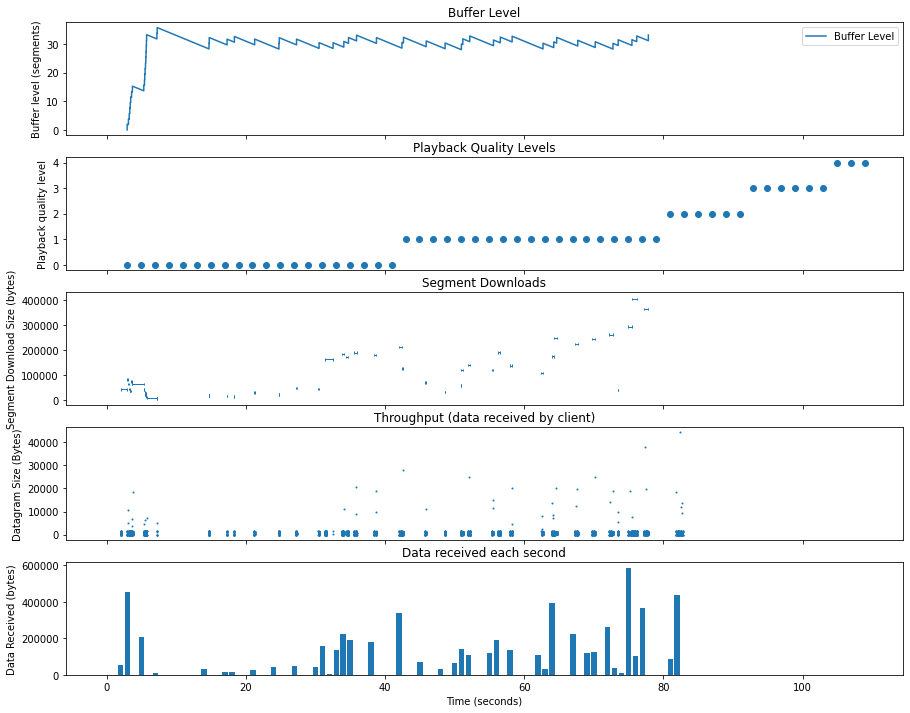



festive over QUIC @ 5Mbps with 2.0% loss


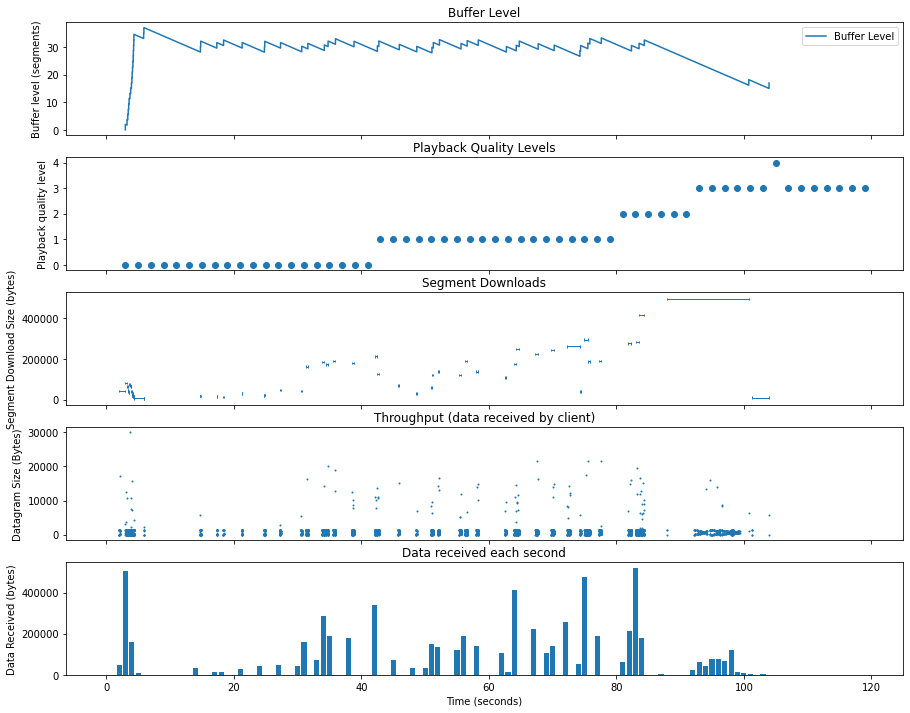



festive over QUIC @ 5Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 112.036


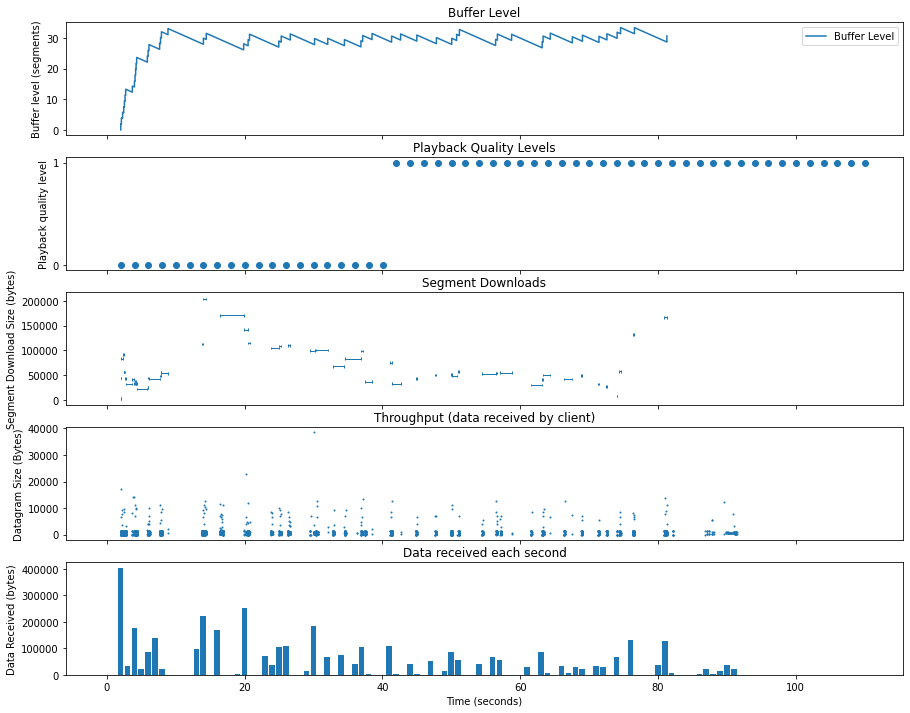

In [127]:
# Timelines for FESTIVE QUIC sims only
def isFestive(sim):
    return sim.algo.lower() == 'festive'

for quicSim in [sim for sim in allQuicSims if isFestive(sim)]:
    quicTitle = getDescription(quicSim)
    print (quicTitle)
    graphFullTimeline(quicSim)
    print ("\n")

tobasco over QUIC @ 500Kbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 306.097


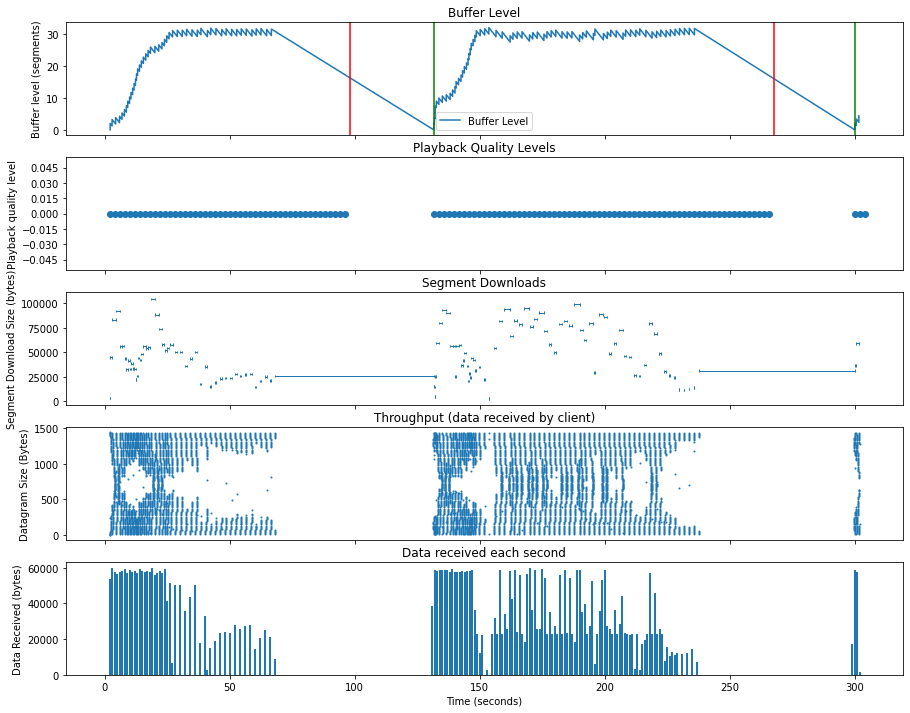



tobasco over QUIC @ 500Kbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 330.123


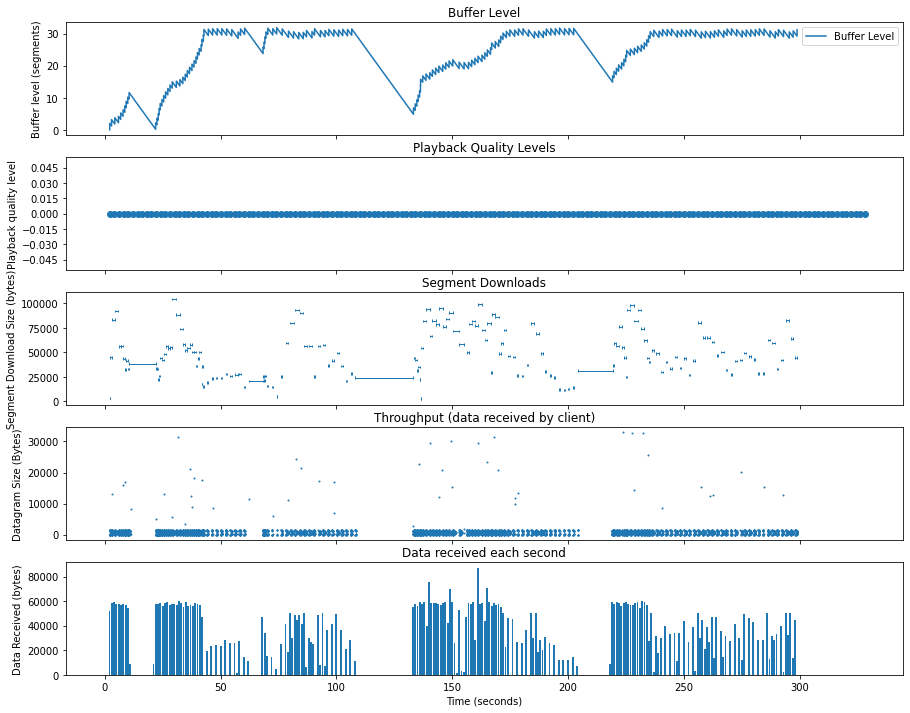



tobasco over QUIC @ 500Kbps with 2.0% loss


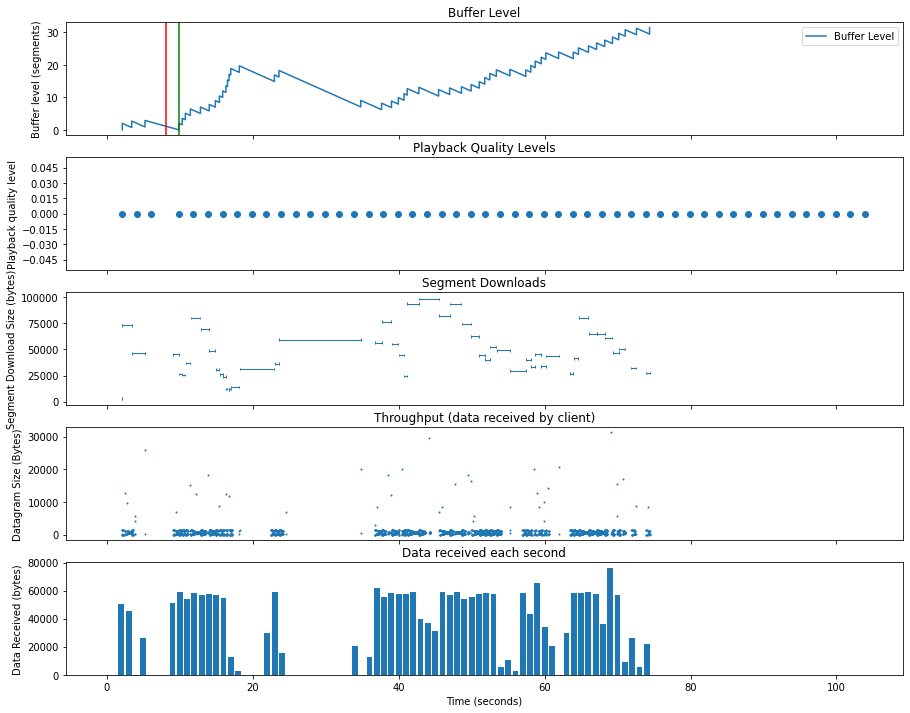



tobasco over QUIC @ 1Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 120.415


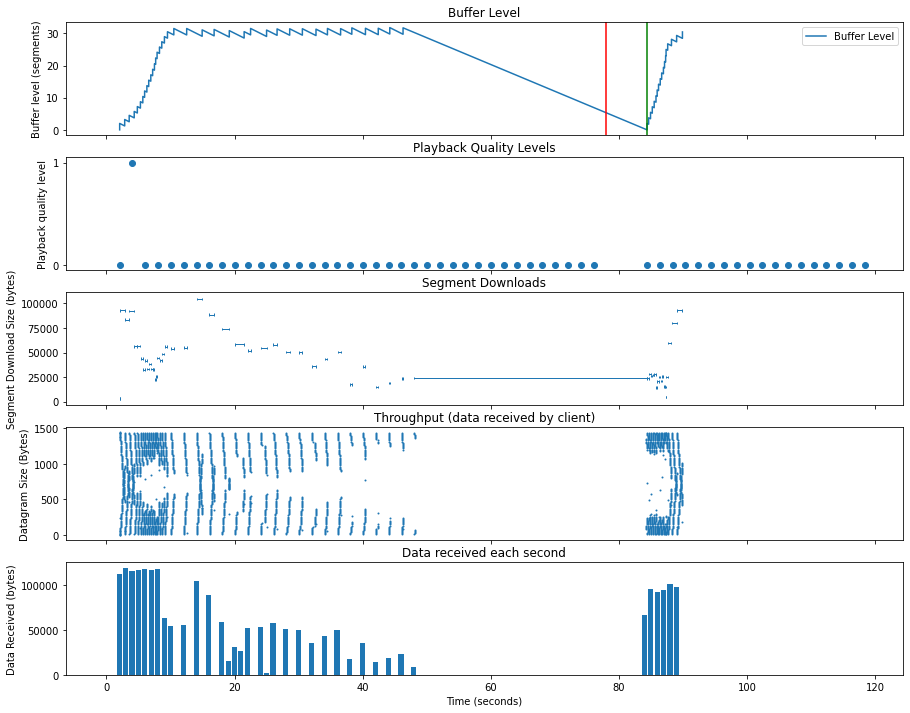



tobasco over QUIC @ 1Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 117.58


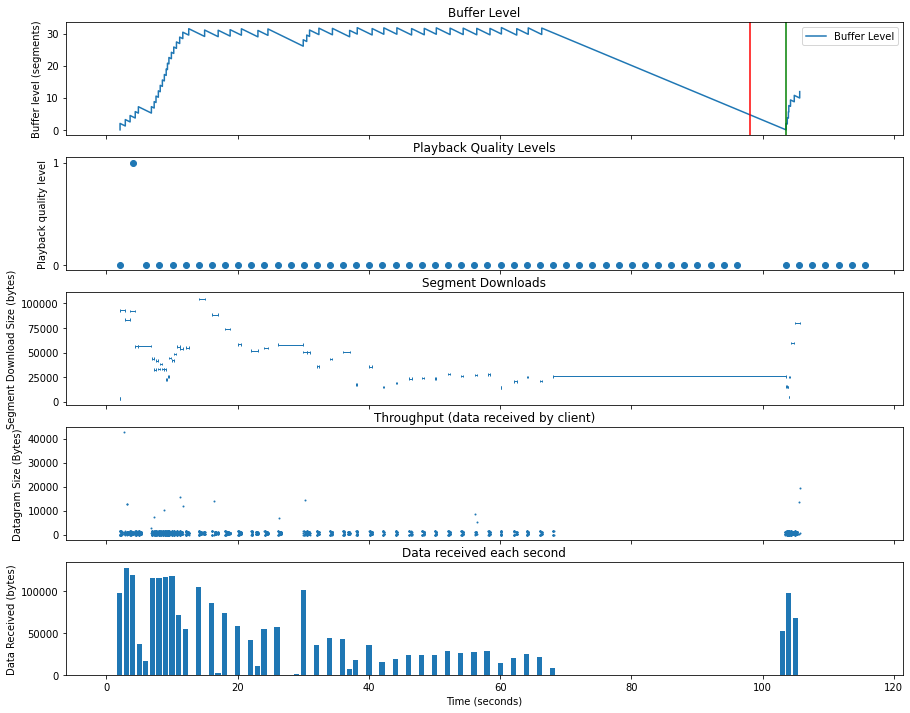



tobasco over QUIC @ 1Mbps with 2.0% loss


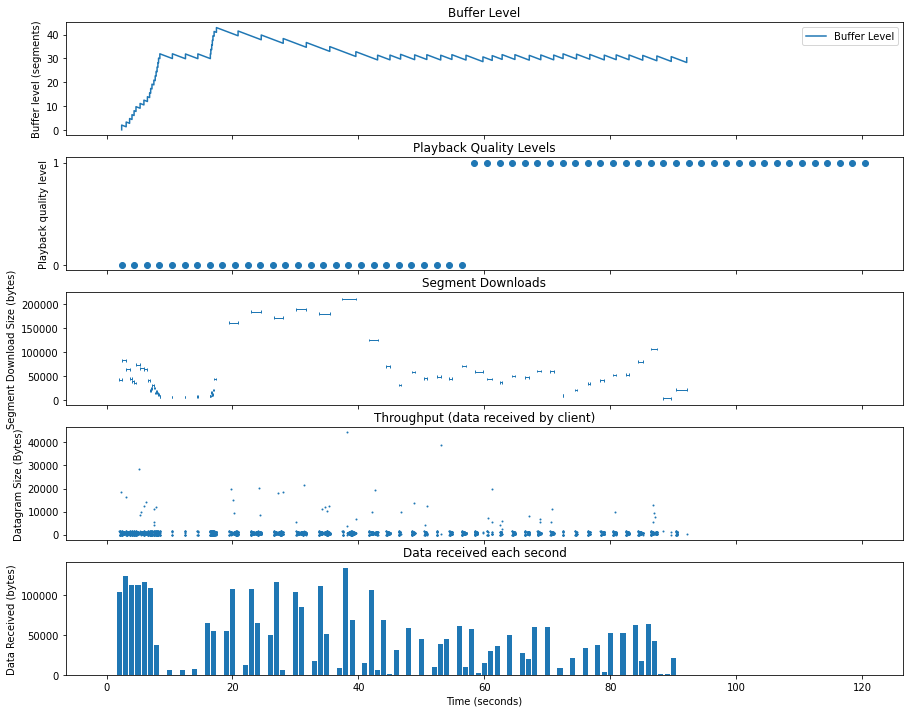



tobasco over QUIC @ 1Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 150.991


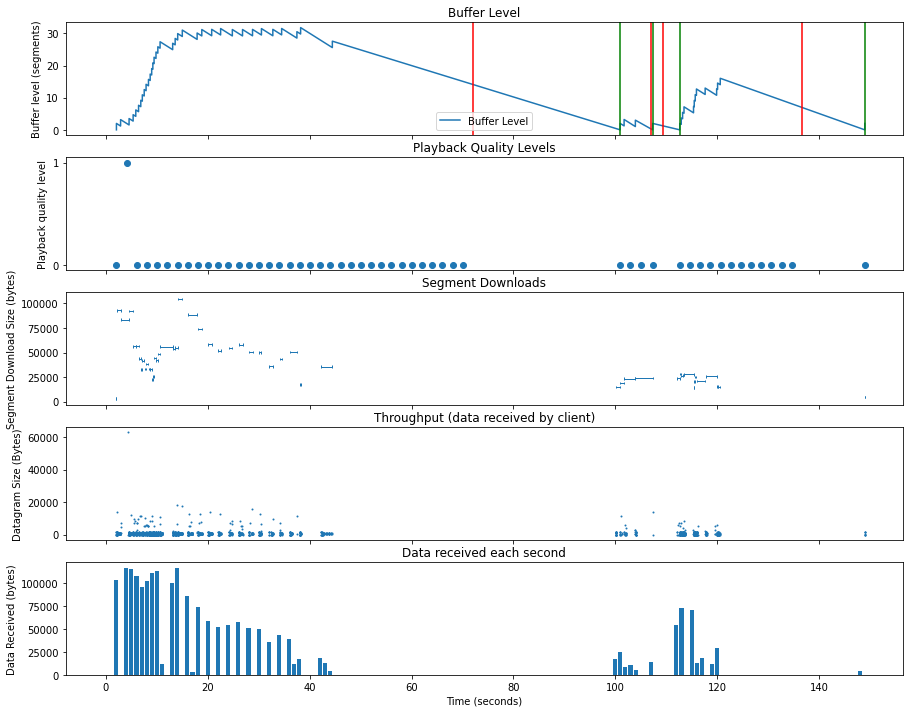



tobasco over QUIC @ 2Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 286.045


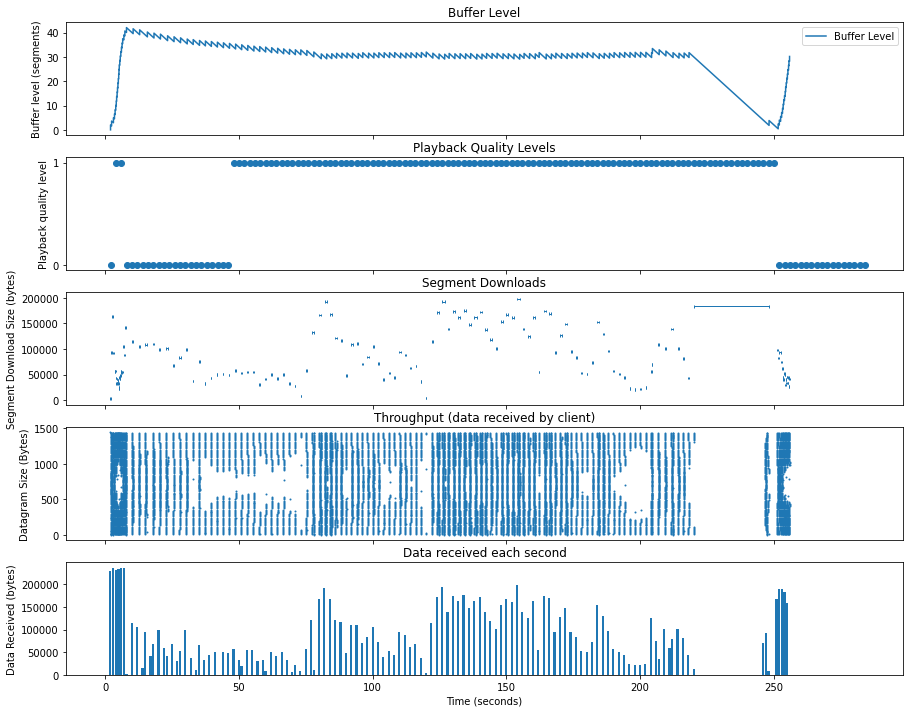



tobasco over QUIC @ 2Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 196.045


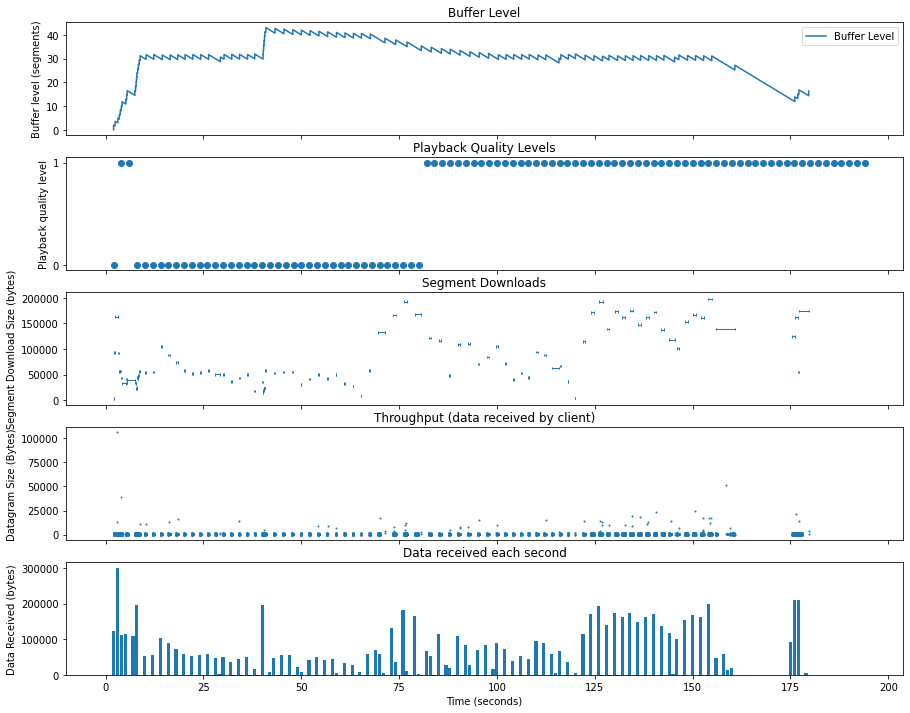



tobasco over QUIC @ 2Mbps with 2.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 332.045


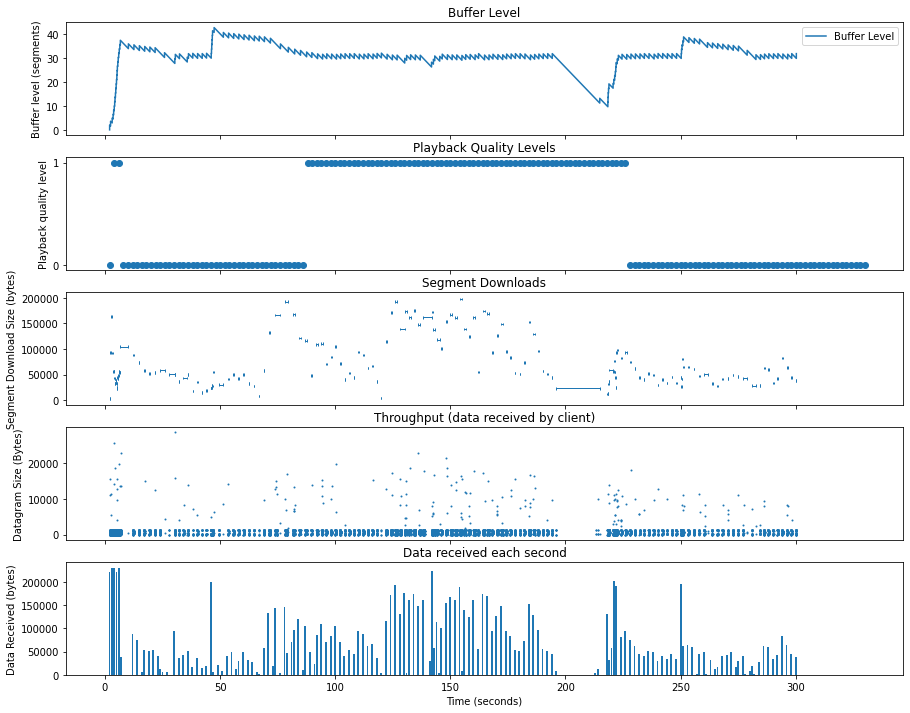



tobasco over QUIC @ 2Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 142.045


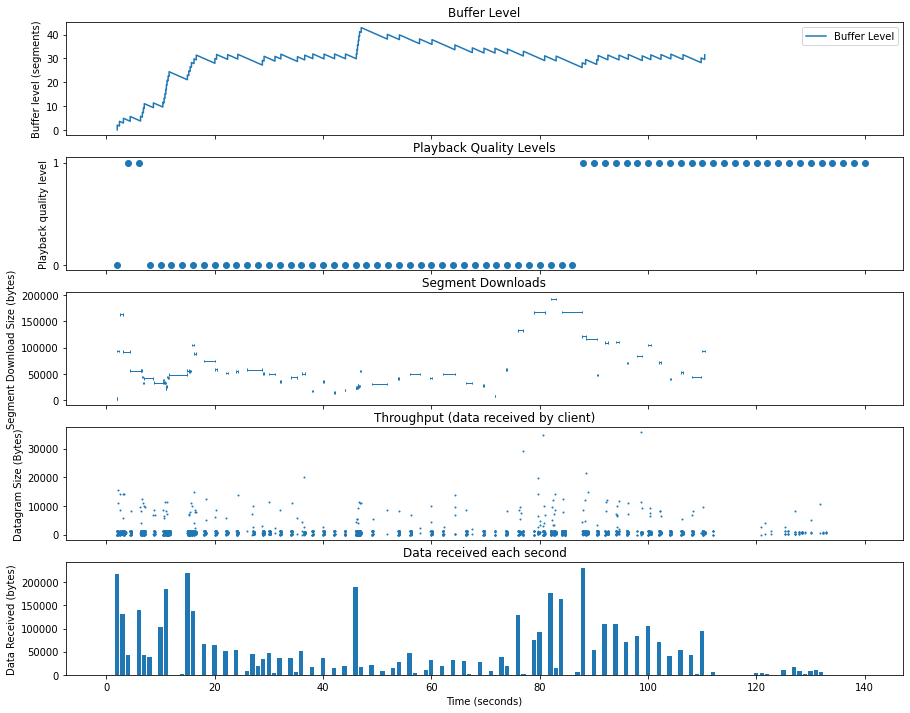



tobasco over QUIC @ 3Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 184.041


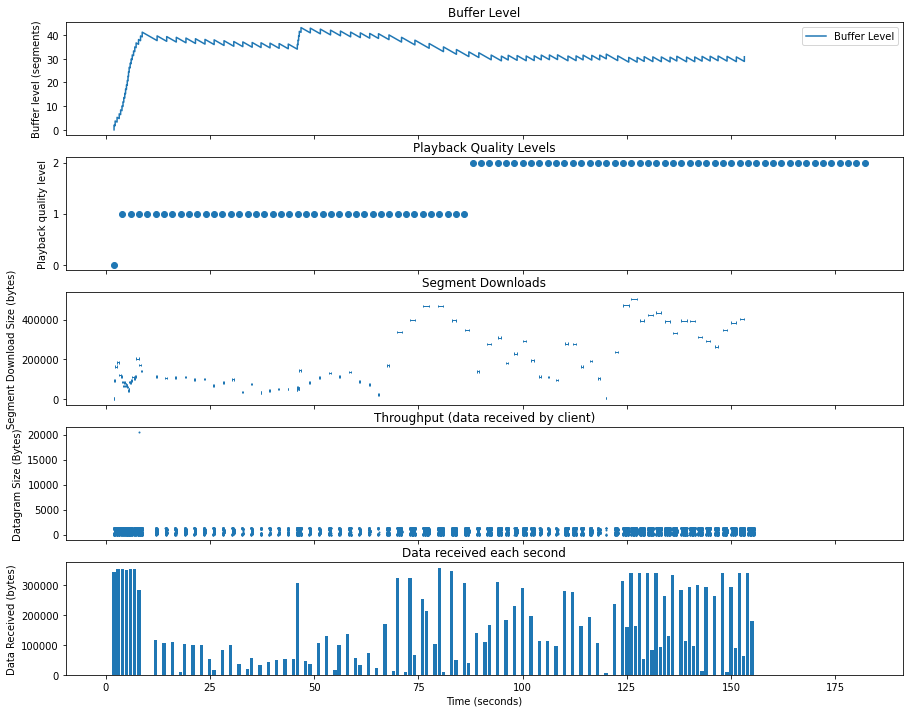



tobasco over QUIC @ 3Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 172.041


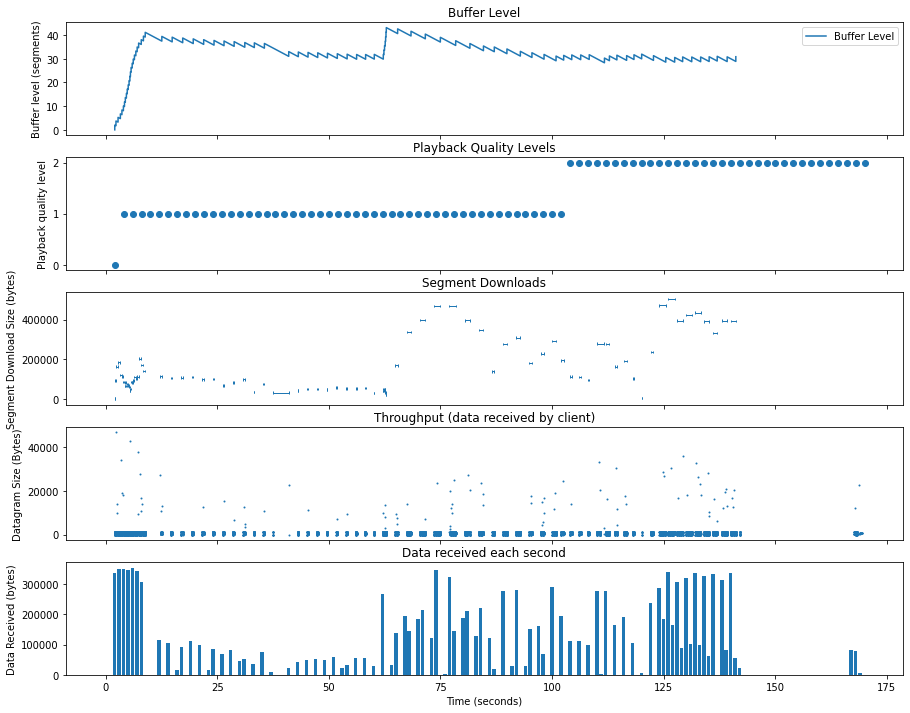



tobasco over QUIC @ 3Mbps with 2.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 152.041


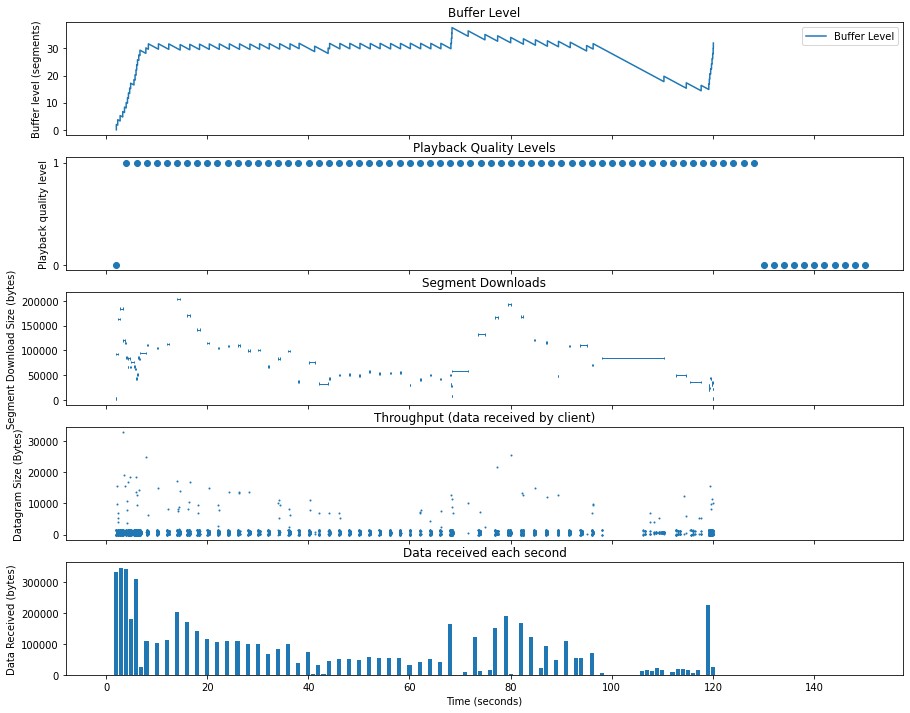



tobasco over QUIC @ 3Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 332.041


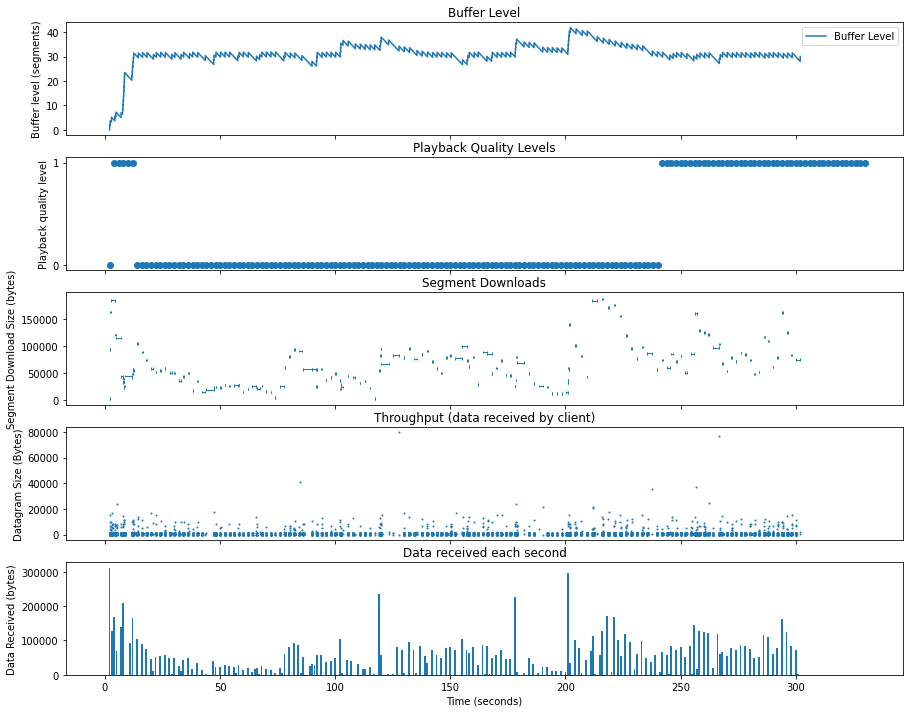



tobasco over QUIC @ 5Mbps with 0.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 108.036


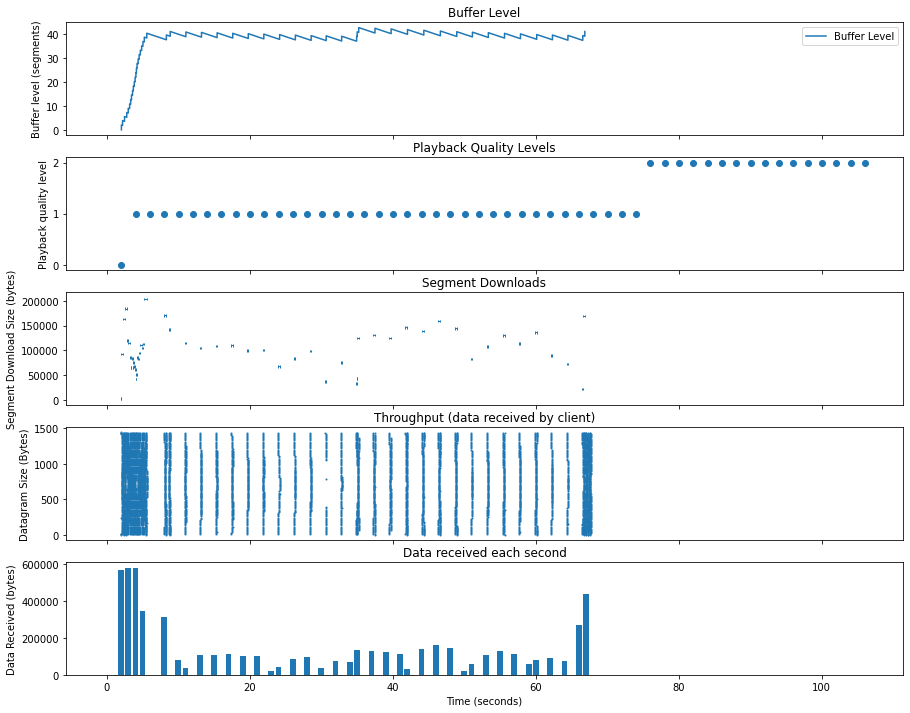



tobasco over QUIC @ 5Mbps with 1.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 108.035


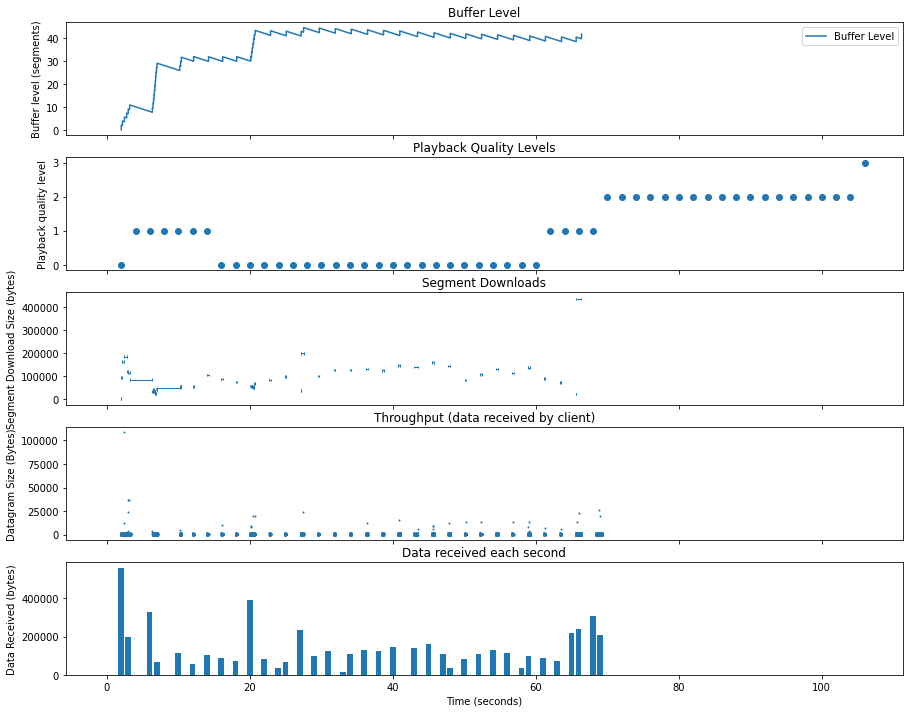



tobasco over QUIC @ 5Mbps with 2.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 108.036


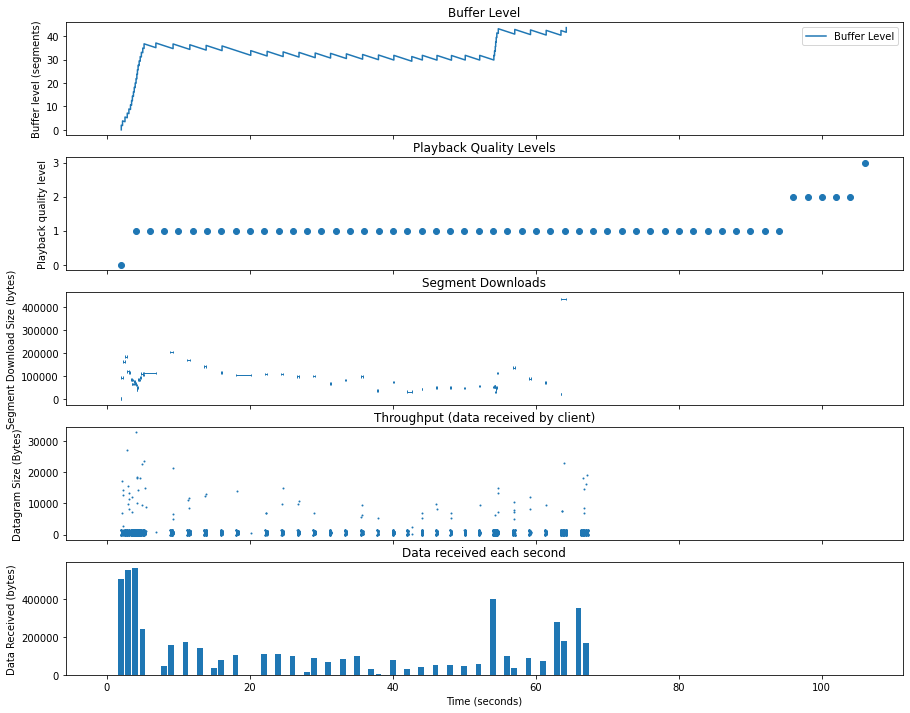



tobasco over QUIC @ 5Mbps with 5.0% loss
Malformed buffer underflow log. Likely that QUIC failed near time 184.036


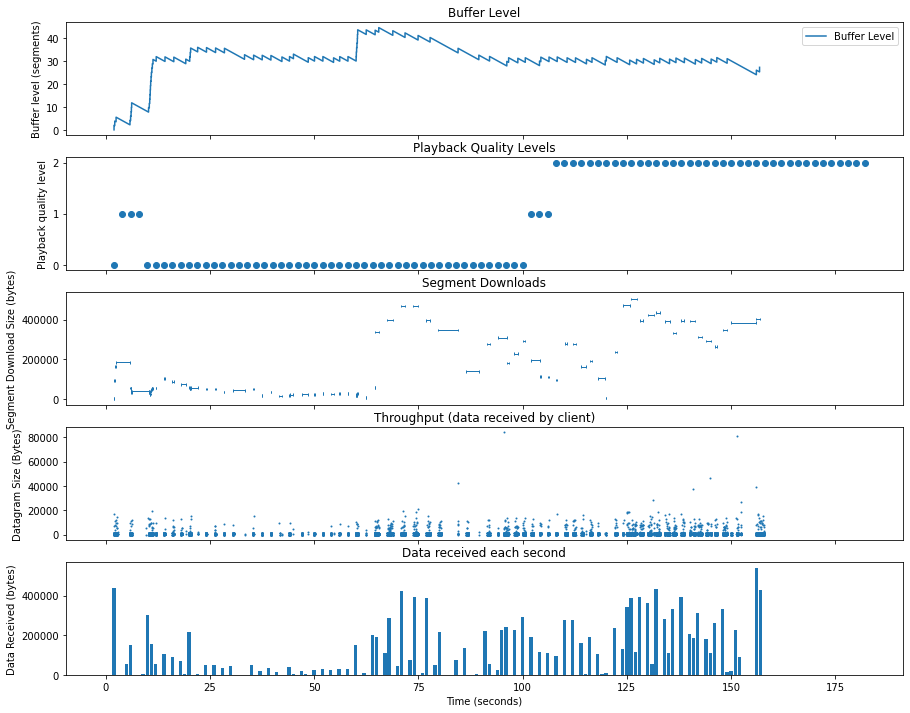

In [128]:
# Timelines for TOBASCO2 QUIC sims only
def isTobasco(sim):
    return sim.algo.lower() == 'tobasco'

for quicSim in [sim for sim in allQuicSims if isTobasco(sim)]:
    quicTitle = getDescription(quicSim)
    print (quicTitle)
    graphFullTimeline(quicSim)
    print ("\n")

## Festive Efficiency Graphs

festive over QUIC @ 500Kbps with 0.0% loss  vs. TCP analog


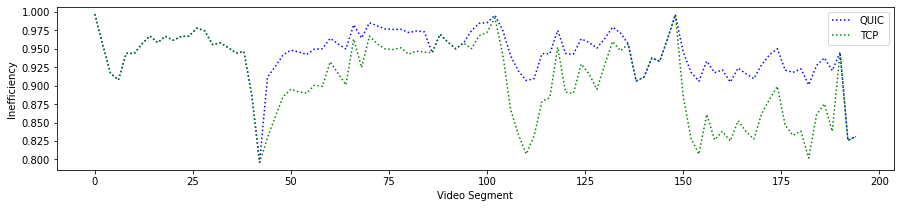

festive over QUIC @ 500Kbps with 1.0% loss  vs. TCP analog


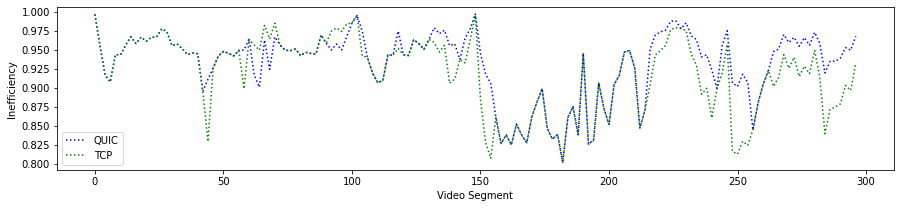

festive over QUIC @ 500Kbps with 2.0% loss  vs. TCP analog


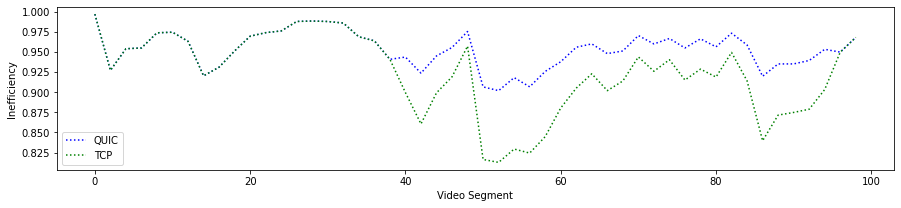

festive over QUIC @ 1Mbps with 0.0% loss  vs. TCP analog


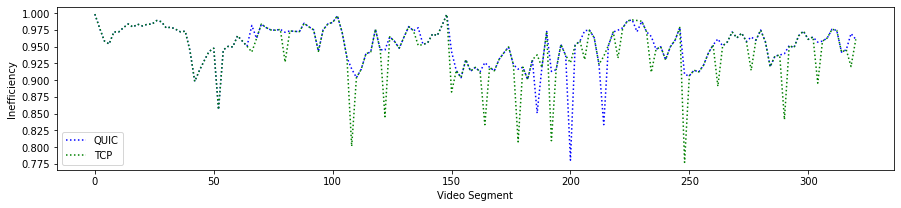

festive over QUIC @ 1Mbps with 1.0% loss  vs. TCP analog


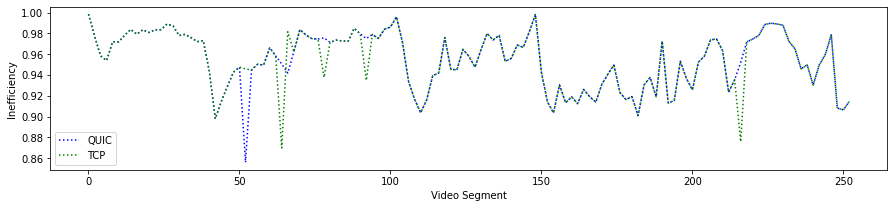

festive over QUIC @ 1Mbps with 2.0% loss  vs. TCP analog


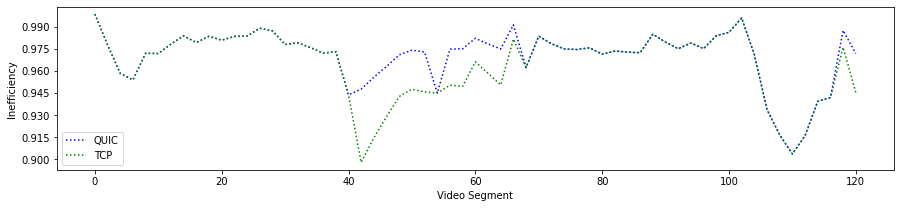

festive over QUIC @ 1Mbps with 5.0% loss  vs. TCP analog


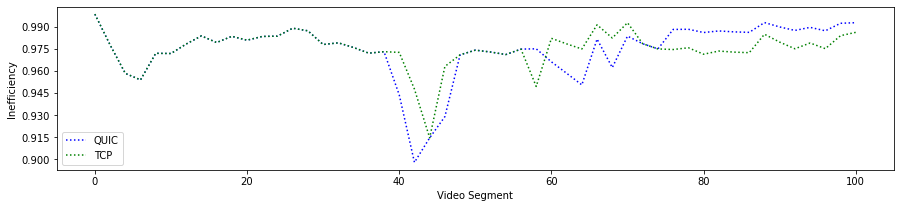

festive over QUIC @ 2Mbps with 0.0% loss  vs. TCP analog


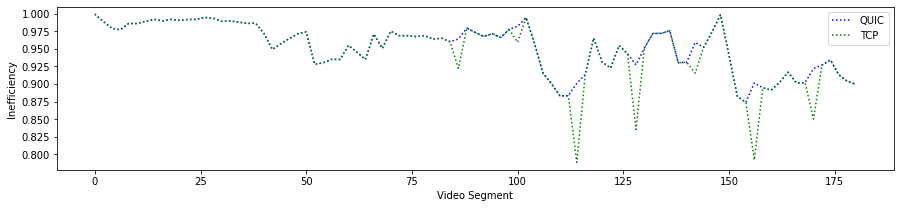

festive over QUIC @ 2Mbps with 1.0% loss  vs. TCP analog


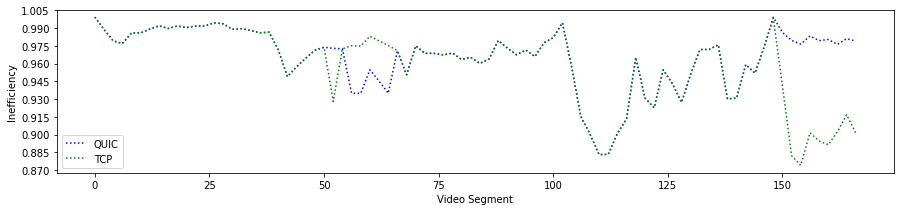

festive over QUIC @ 2Mbps with 2.0% loss  vs. TCP analog


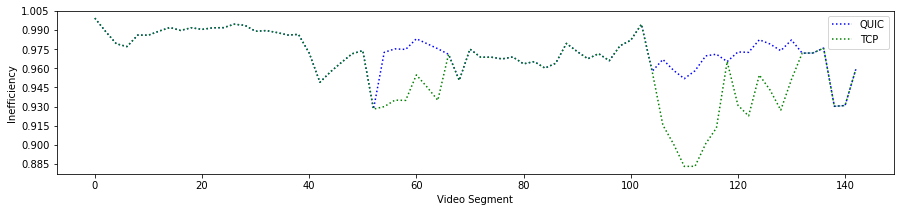

festive over QUIC @ 2Mbps with 5.0% loss  vs. TCP analog


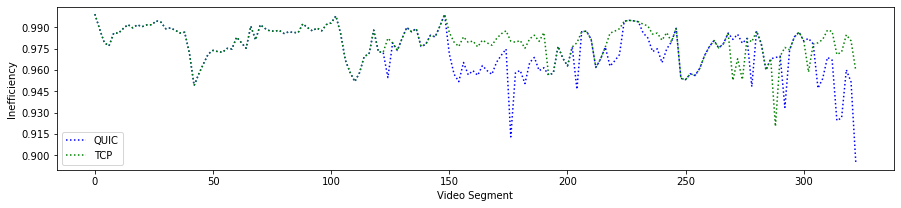

festive over QUIC @ 3Mbps with 0.0% loss  vs. TCP analog


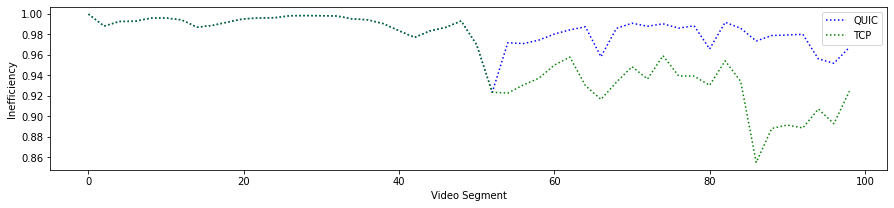

festive over QUIC @ 3Mbps with 1.0% loss  vs. TCP analog


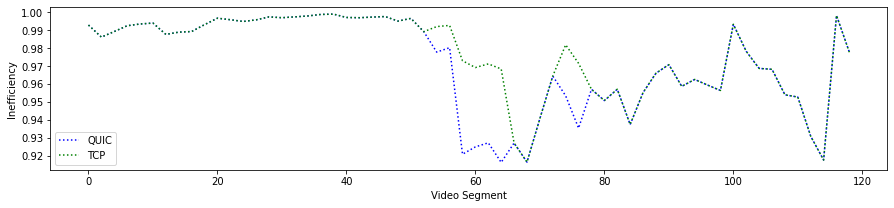

festive over QUIC @ 3Mbps with 2.0% loss  vs. TCP analog


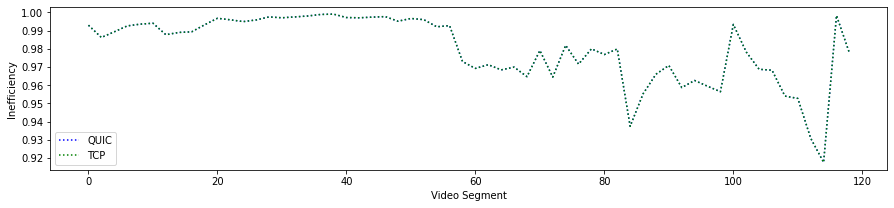

festive over QUIC @ 3Mbps with 5.0% loss  vs. TCP analog


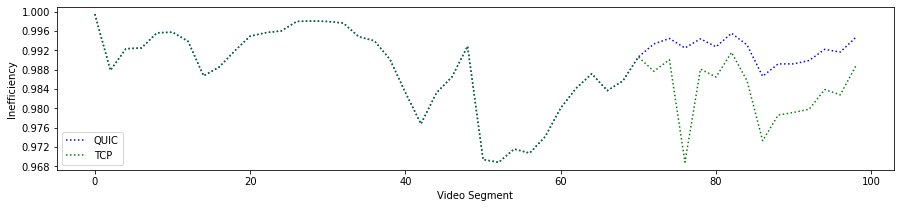

festive over QUIC @ 5Mbps with 1.0% loss  vs. TCP analog


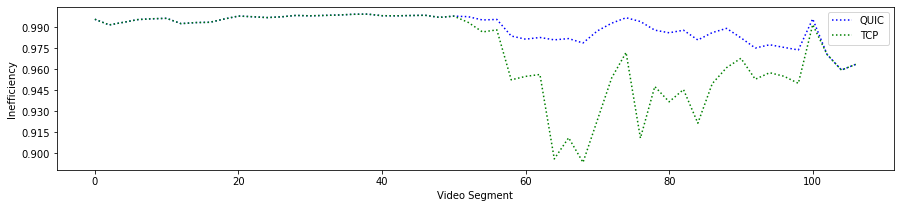

festive over QUIC @ 5Mbps with 2.0% loss  vs. TCP analog


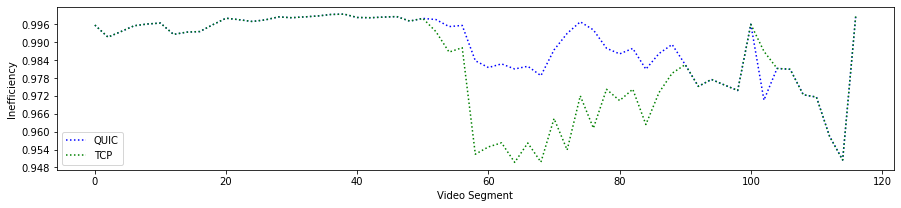

festive over QUIC @ 5Mbps with 5.0% loss  vs. TCP analog


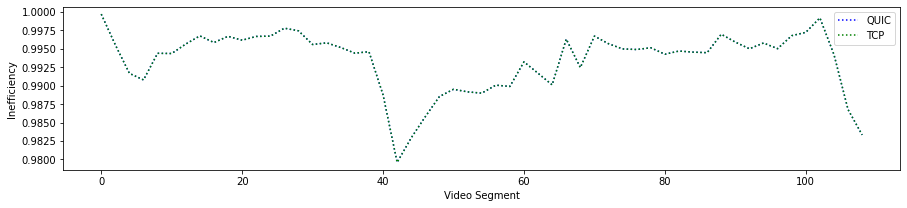

tobasco over QUIC @ 500Kbps with 0.0% loss  vs. TCP analog


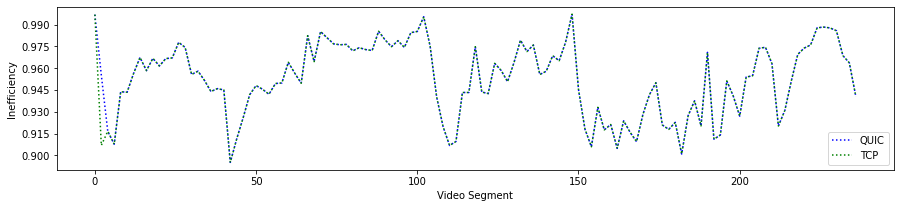

tobasco over QUIC @ 500Kbps with 1.0% loss  vs. TCP analog


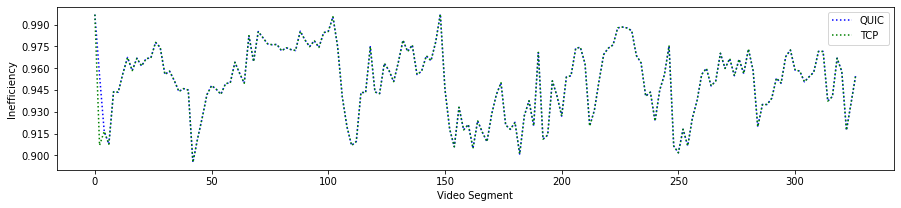

tobasco over QUIC @ 500Kbps with 2.0% loss  vs. TCP analog


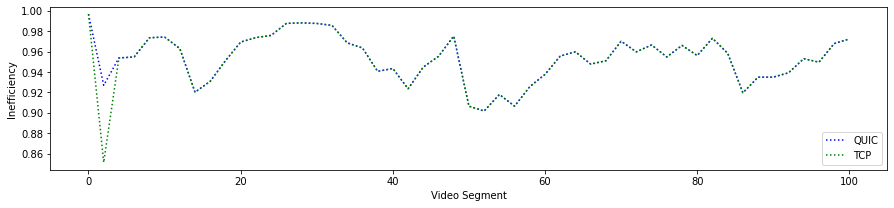

tobasco over QUIC @ 1Mbps with 0.0% loss  vs. TCP analog


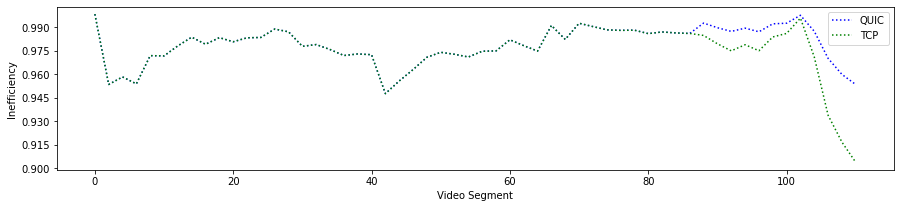

tobasco over QUIC @ 1Mbps with 1.0% loss  vs. TCP analog


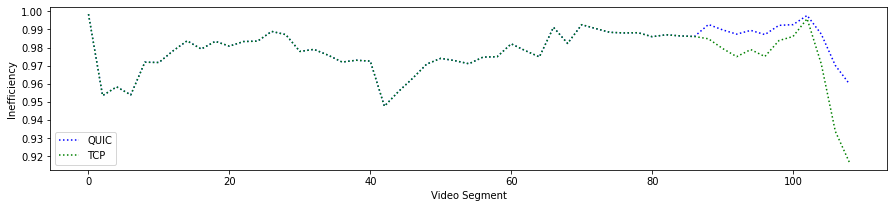

tobasco over QUIC @ 1Mbps with 2.0% loss  vs. TCP analog


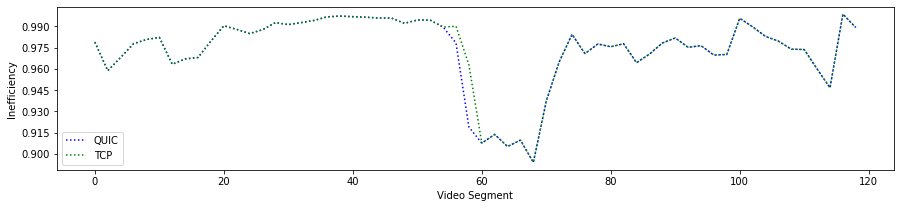

tobasco over QUIC @ 1Mbps with 5.0% loss  vs. TCP analog


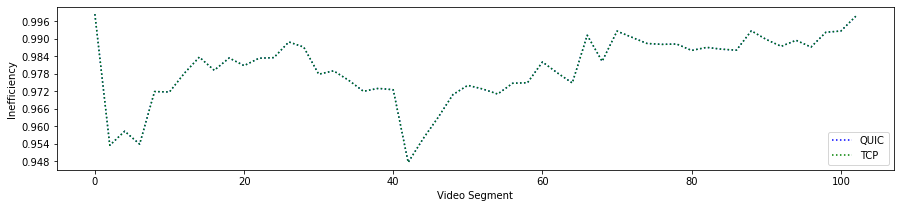

tobasco over QUIC @ 2Mbps with 0.0% loss  vs. TCP analog


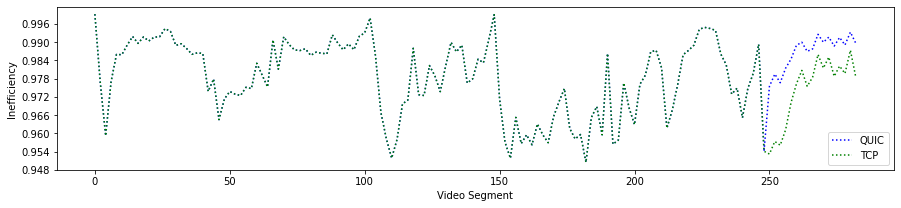

tobasco over QUIC @ 2Mbps with 1.0% loss  vs. TCP analog


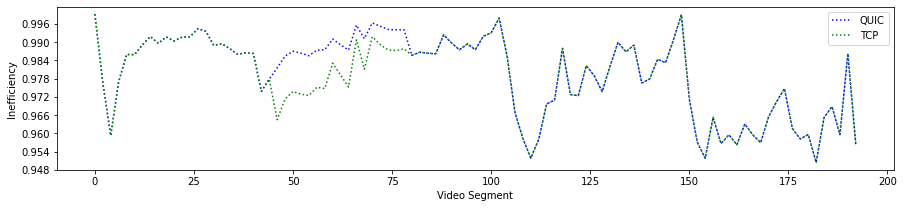

tobasco over QUIC @ 2Mbps with 2.0% loss  vs. TCP analog


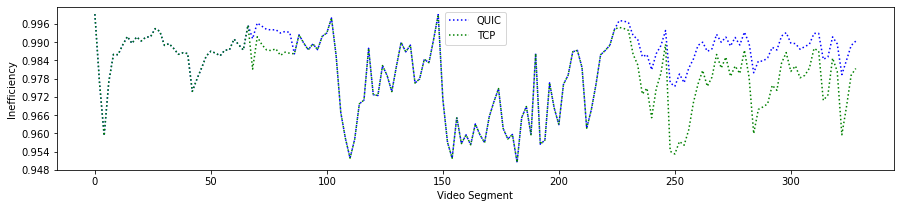

tobasco over QUIC @ 2Mbps with 5.0% loss  vs. TCP analog


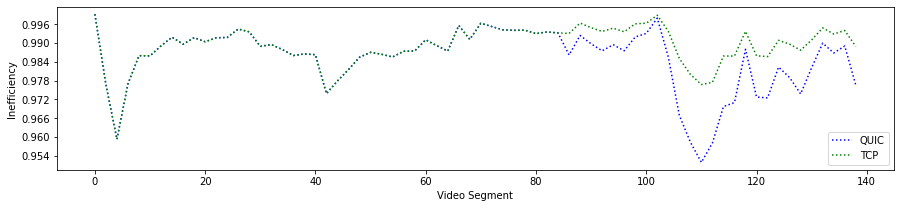

tobasco over QUIC @ 3Mbps with 0.0% loss  vs. TCP analog


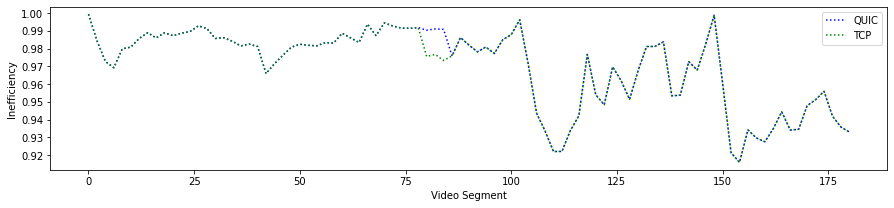

tobasco over QUIC @ 3Mbps with 1.0% loss  vs. TCP analog


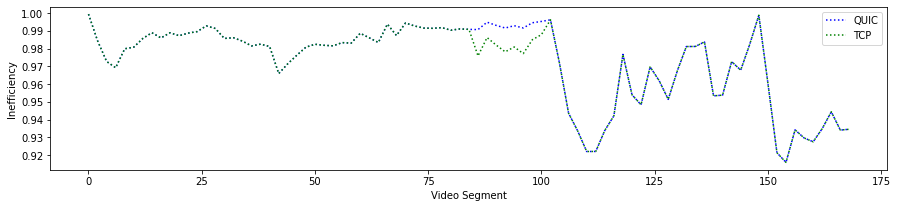

tobasco over QUIC @ 3Mbps with 2.0% loss  vs. TCP analog


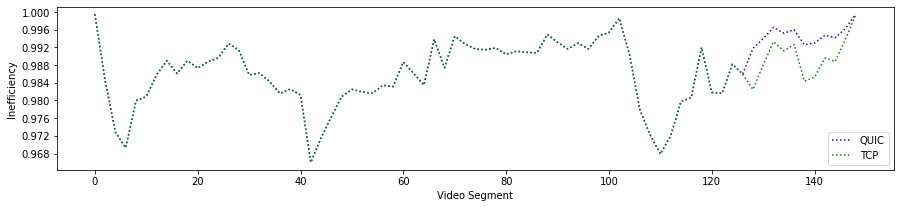

tobasco over QUIC @ 3Mbps with 5.0% loss  vs. TCP analog


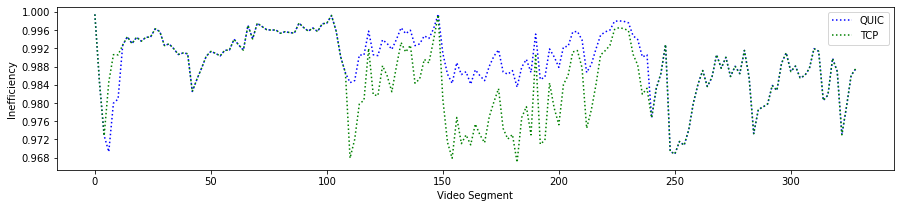

tobasco over QUIC @ 5Mbps with 0.0% loss  vs. TCP analog


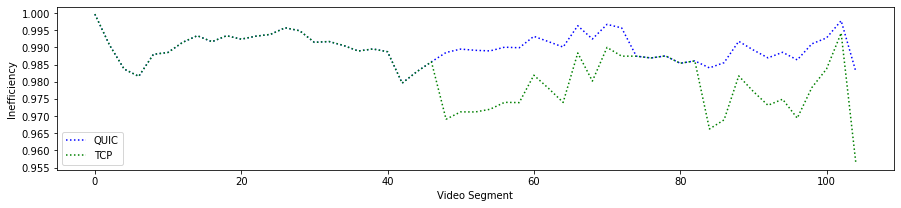

tobasco over QUIC @ 5Mbps with 1.0% loss  vs. TCP analog


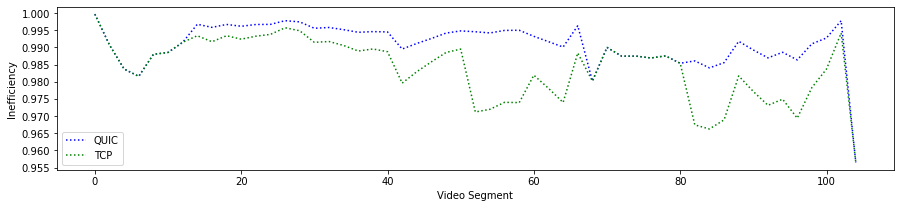

tobasco over QUIC @ 5Mbps with 2.0% loss  vs. TCP analog


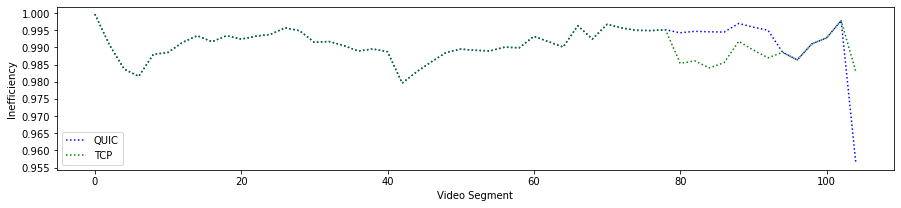

tobasco over QUIC @ 5Mbps with 5.0% loss  vs. TCP analog


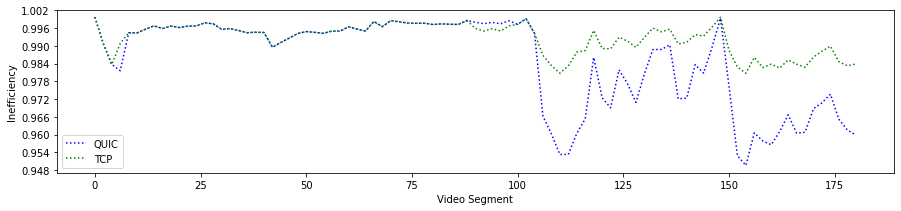

In [114]:
for (quicSim, tcpSim) in allSimPairs:
    print (getDescription(quicSim), " vs. TCP analog")
    compareEfficiencyOverlay(quicSim, tcpSim, 'QUIC', 'TCP')

## Festive Stability Graphs

festive over QUIC @ 500Kbps with 0.0% loss  vs. TCP analog


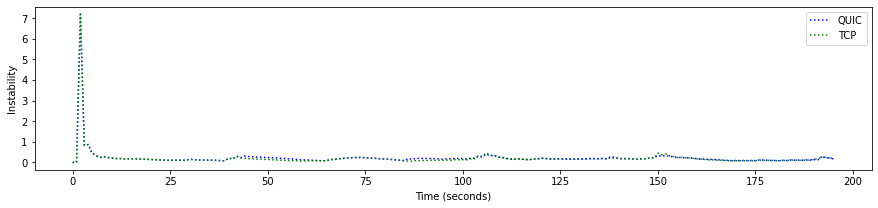

festive over QUIC @ 500Kbps with 1.0% loss  vs. TCP analog


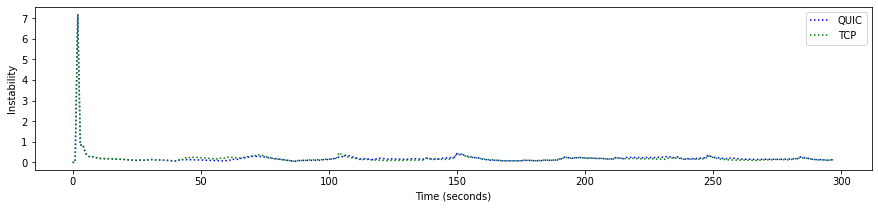

festive over QUIC @ 500Kbps with 2.0% loss  vs. TCP analog


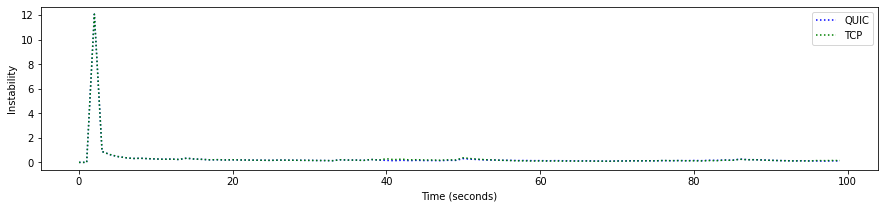

festive over QUIC @ 1Mbps with 0.0% loss  vs. TCP analog


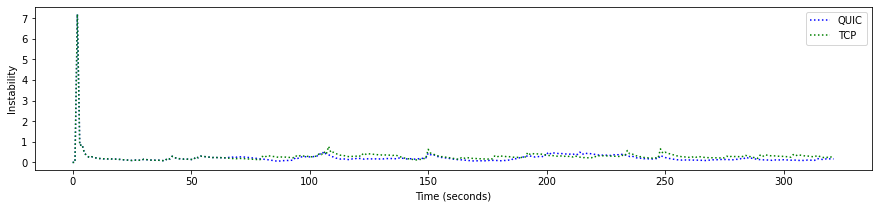

festive over QUIC @ 1Mbps with 1.0% loss  vs. TCP analog


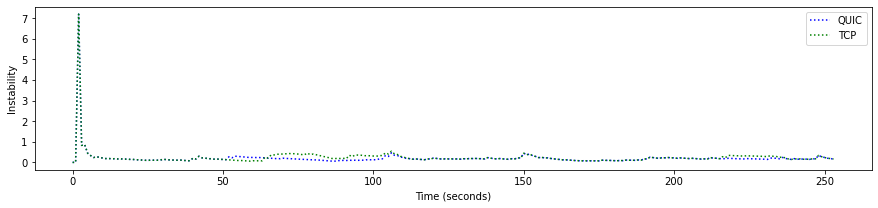

festive over QUIC @ 1Mbps with 2.0% loss  vs. TCP analog


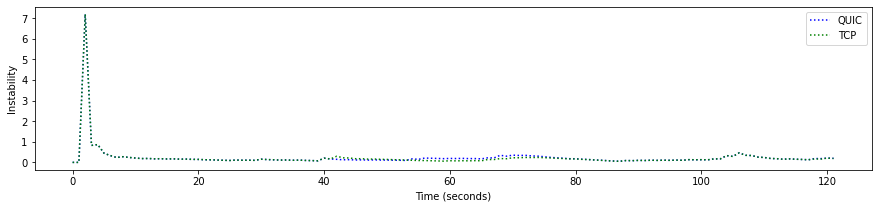

festive over QUIC @ 1Mbps with 5.0% loss  vs. TCP analog


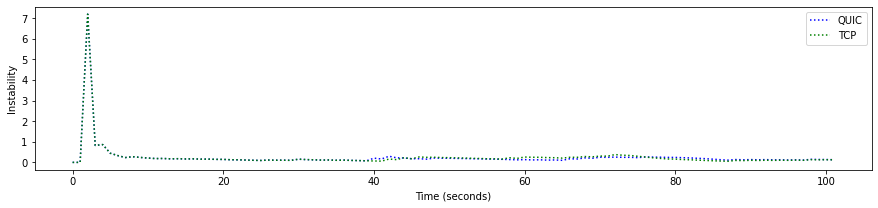

festive over QUIC @ 2Mbps with 0.0% loss  vs. TCP analog


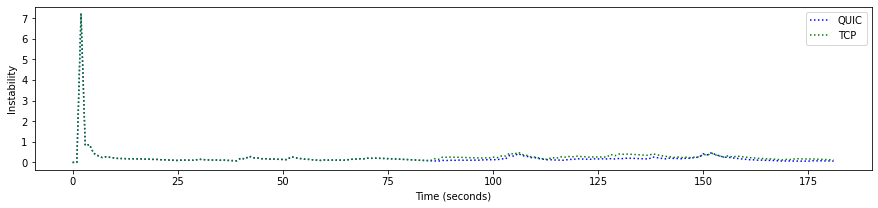

festive over QUIC @ 2Mbps with 1.0% loss  vs. TCP analog


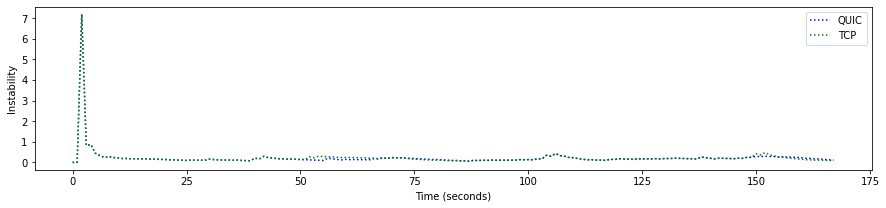

festive over QUIC @ 2Mbps with 2.0% loss  vs. TCP analog


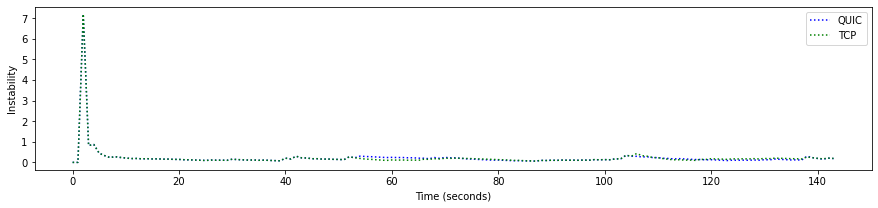

festive over QUIC @ 2Mbps with 5.0% loss  vs. TCP analog


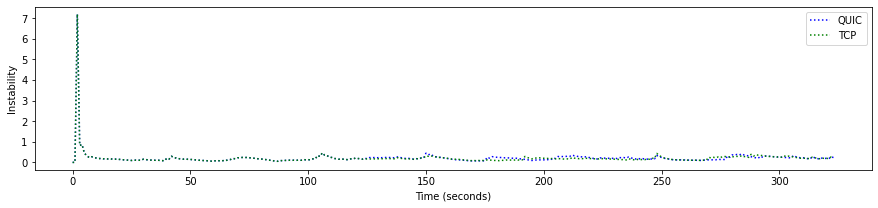

festive over QUIC @ 3Mbps with 0.0% loss  vs. TCP analog


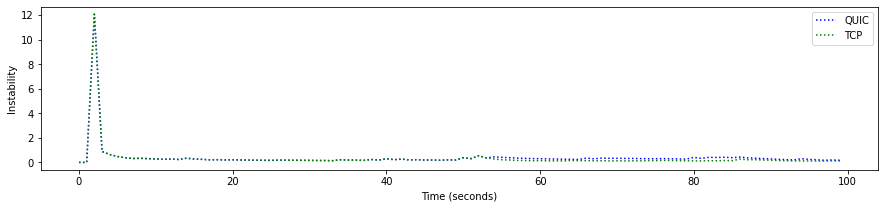

festive over QUIC @ 3Mbps with 1.0% loss  vs. TCP analog


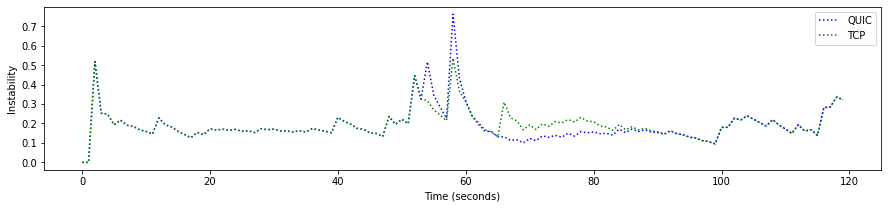

festive over QUIC @ 3Mbps with 2.0% loss  vs. TCP analog


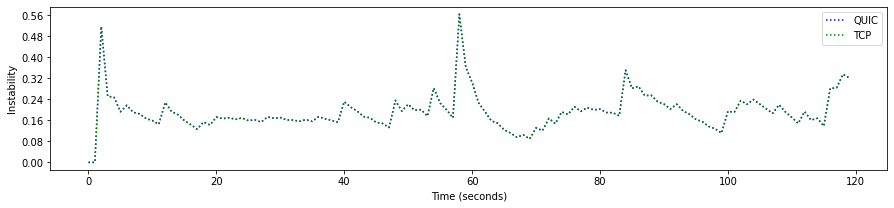

festive over QUIC @ 3Mbps with 5.0% loss  vs. TCP analog


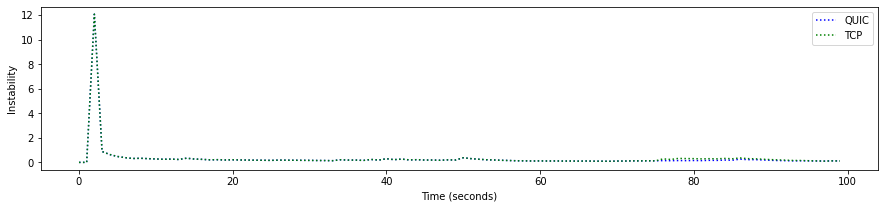

festive over QUIC @ 5Mbps with 1.0% loss  vs. TCP analog


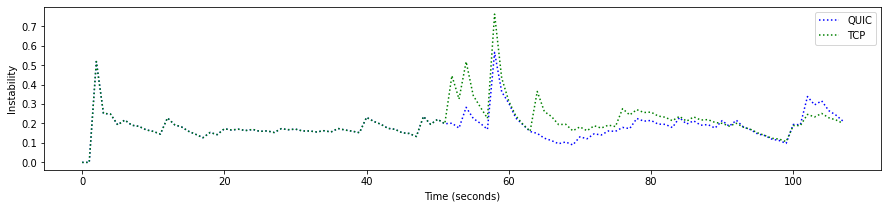

festive over QUIC @ 5Mbps with 2.0% loss  vs. TCP analog


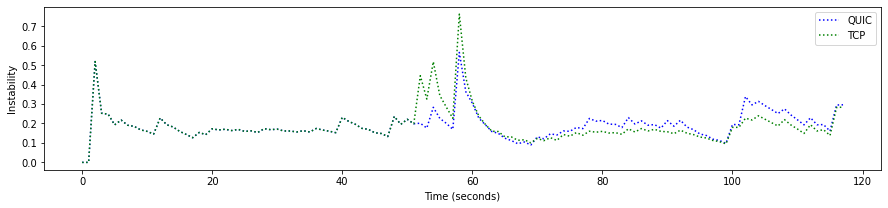

festive over QUIC @ 5Mbps with 5.0% loss  vs. TCP analog


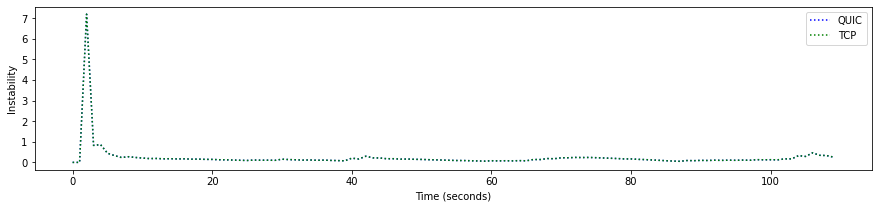

tobasco over QUIC @ 500Kbps with 0.0% loss  vs. TCP analog


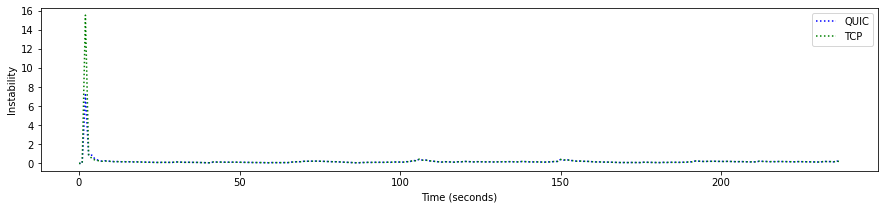

tobasco over QUIC @ 500Kbps with 1.0% loss  vs. TCP analog


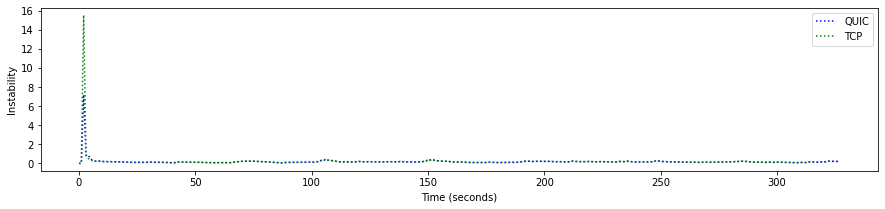

tobasco over QUIC @ 500Kbps with 2.0% loss  vs. TCP analog


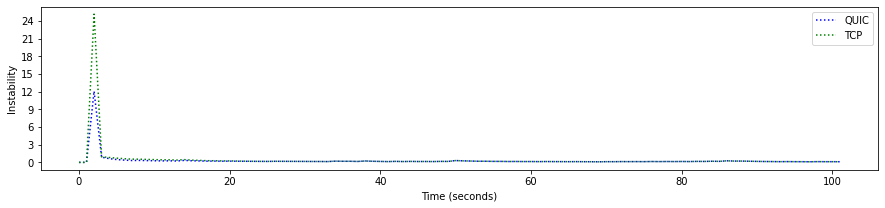

tobasco over QUIC @ 1Mbps with 0.0% loss  vs. TCP analog


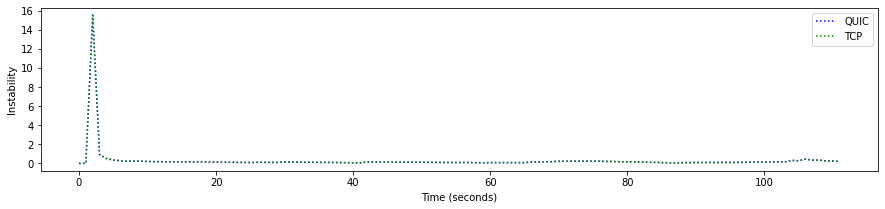

tobasco over QUIC @ 1Mbps with 1.0% loss  vs. TCP analog


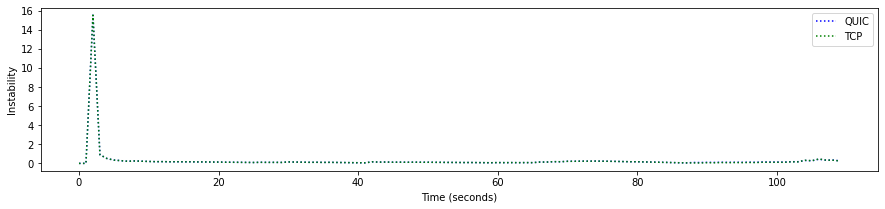

tobasco over QUIC @ 1Mbps with 2.0% loss  vs. TCP analog


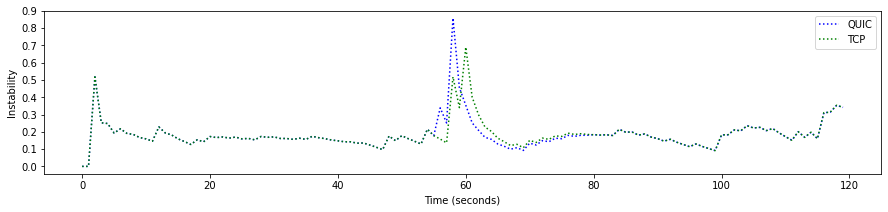

tobasco over QUIC @ 1Mbps with 5.0% loss  vs. TCP analog


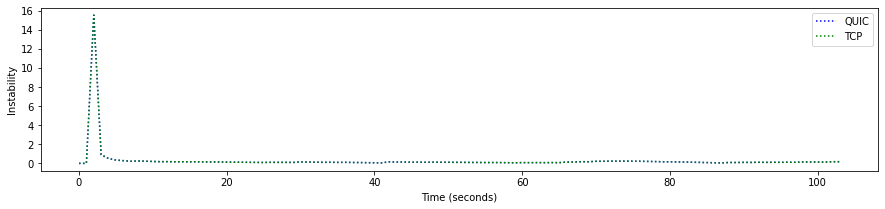

tobasco over QUIC @ 2Mbps with 0.0% loss  vs. TCP analog


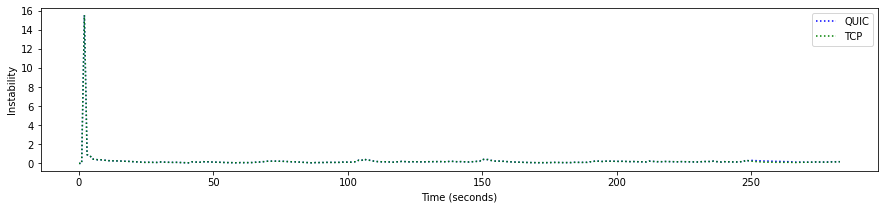

tobasco over QUIC @ 2Mbps with 1.0% loss  vs. TCP analog


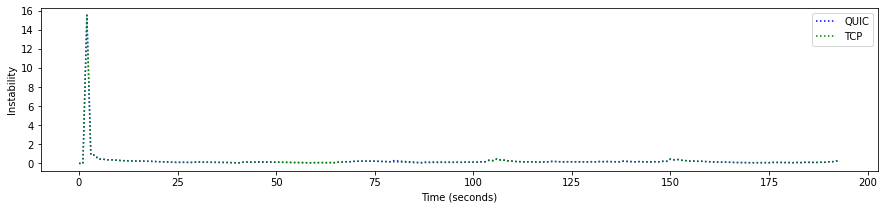

tobasco over QUIC @ 2Mbps with 2.0% loss  vs. TCP analog


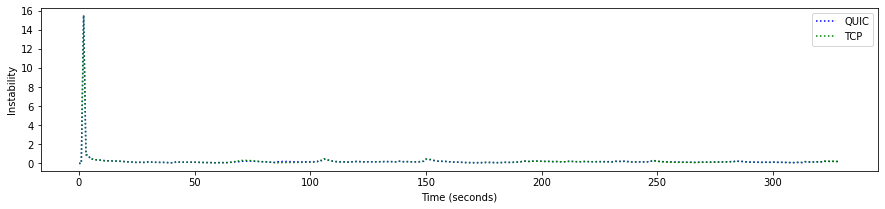

tobasco over QUIC @ 2Mbps with 5.0% loss  vs. TCP analog


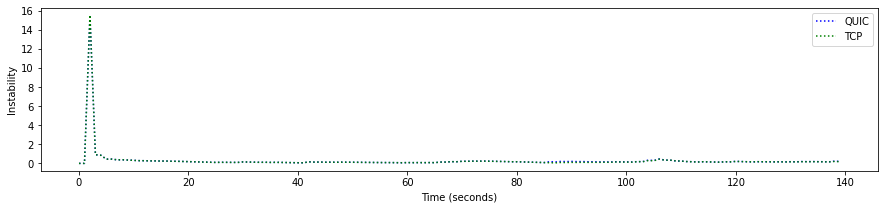

tobasco over QUIC @ 3Mbps with 0.0% loss  vs. TCP analog


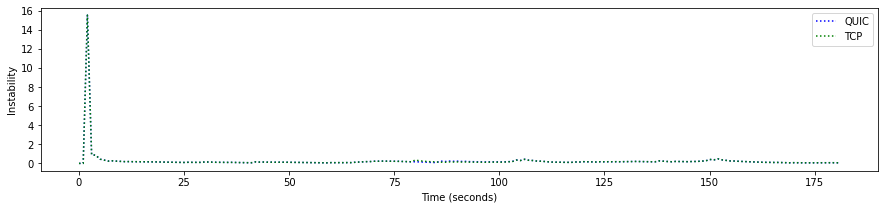

tobasco over QUIC @ 3Mbps with 1.0% loss  vs. TCP analog


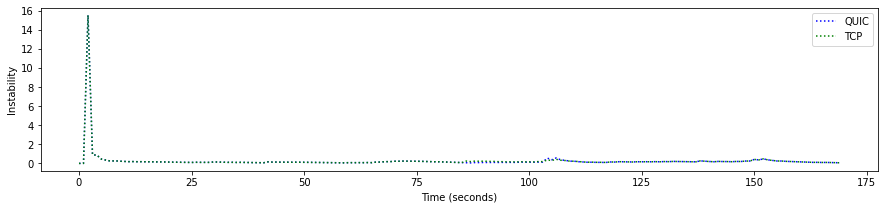

tobasco over QUIC @ 3Mbps with 2.0% loss  vs. TCP analog


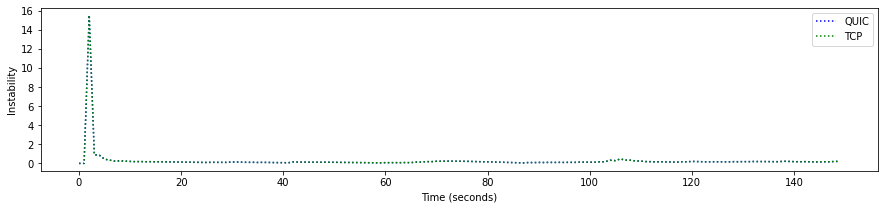

tobasco over QUIC @ 3Mbps with 5.0% loss  vs. TCP analog


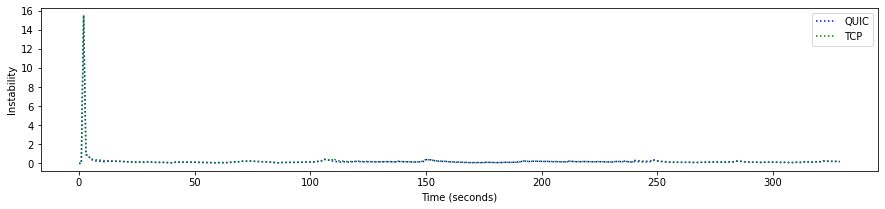

tobasco over QUIC @ 5Mbps with 0.0% loss  vs. TCP analog


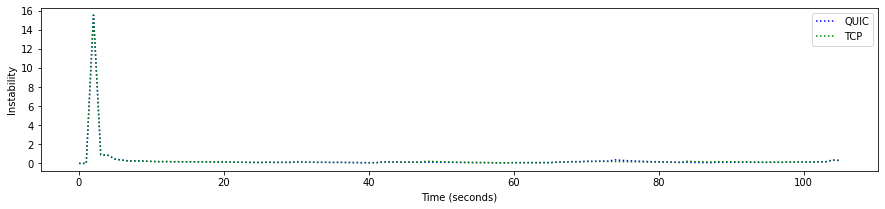

tobasco over QUIC @ 5Mbps with 1.0% loss  vs. TCP analog


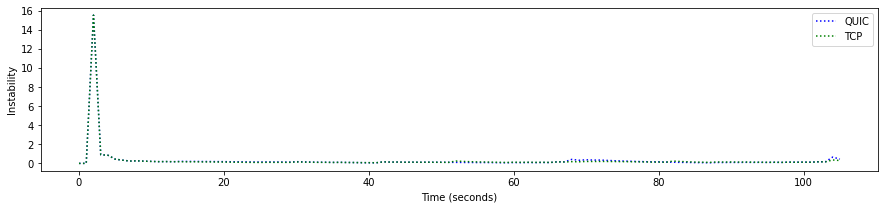

tobasco over QUIC @ 5Mbps with 2.0% loss  vs. TCP analog


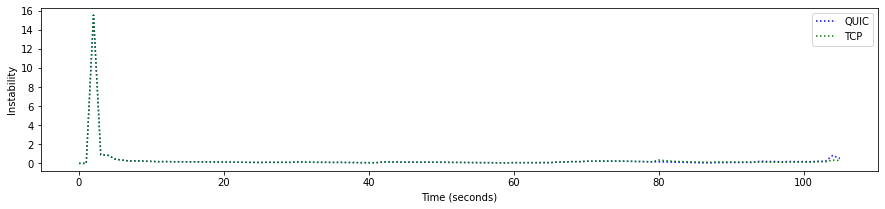

tobasco over QUIC @ 5Mbps with 5.0% loss  vs. TCP analog


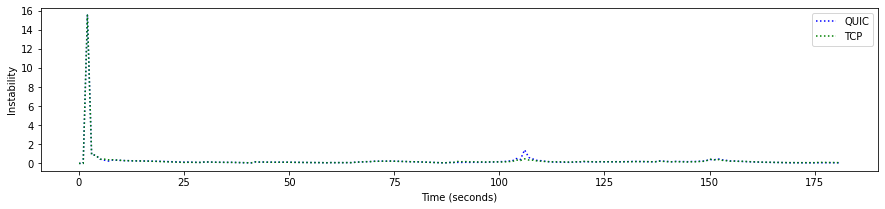

In [115]:
for (quicSim, tcpSim) in allSimPairs:
    print (getDescription(quicSim), " vs. TCP analog")
    compareStabilityOverlay(quicSim, tcpSim, 'QUIC', 'TCP')

## Compute Averages for different categories of data

In [116]:
# We want to compute averages for stability, efficiency, quality level, quality switches, and rebuffering events over
# 1. Festive vs Tobasco
# 2. Each loss rate
# 3. Each bit rate

def isNonZeroLoss(sim):
    return sim.errRate > 0

def isLossRate(sim, lossRate): # TODO comparing floats is scary.. Check that this is working properly
    return sim.errRate == lossRate

def isDataRate(sim, rate):
    return sim.rateVal == rate

In [117]:
# Number of quality changes in first 50 segments of each simulation
def countQualityChangesInGroupsFirst50(sims):
    return np.array([qualityChangeCount(sim, 50) for sim in sims])

# Graph boxplots of quality change counts for each group
def graphQualityChanges(simGroups, labels, subtitle):
    title = 'Quality Changes (' + subtitle + ')'
    
    # Get quality change counts for each simulation
    changes = [countQualityChangesInGroupsFirst50(group) for group in simGroups]
    
    fig, ax = plt.subplots(figsize=(3*len(simGroups),3))
    ax.set_title(title)
    ax.set_ylabel('Video Quality Changes')
    setIntegerYTickInterval(ax)
    _ = ax.boxplot(changes, labels=labels)

In [118]:
def meanQualityLevelInFirst50(sim):
    return meanQualityLevel(sim, 50)

def meanQualityLevelsInFirst50(sims):
    return np.array([meanQualityLevelInFirst50(sim) for sim in sims])

# Average Quality Level over first 50 segments of each simulation
def graphMeanQualityLevels(simGroups, labels, subtitle):
    title = 'Mean Selected Quality Level (' + subtitle + ')'
    
    qualities = [meanQualityLevelsInFirst50(group) for group in simGroups]
    
    fig, ax = plt.subplots(figsize=(3*len(simGroups),3))
    ax.set_title(title)
    ax.set_ylabel('Average Quality Level Selected')
    setIntegerYTickInterval(ax)
    _ = ax.boxplot(qualities, labels=labels)

In [119]:
def meanInefficiencyOverFirst50(sims):
    return np.array([meanInefficiency(sim, 50) for sim in sims])

# Average Inefficiency Score over first 50 segments of each simulation
def graphMeanInefficiency(simGroups, labels, subtitle):
    title = 'Mean Inefficiency Score (' + subtitle + ')'
    
    scores = [meanInefficiencyOverFirst50(group) for group in simGroups]
    
    fig, ax = plt.subplots(figsize=(3*len(simGroups),3))
    ax.set_title(title)
    ax.set_ylabel('Mean Inefficiency Score')
    setIntegerYTickInterval(ax)
    _ = ax.boxplot(scores, labels=labels)

In [120]:
def meanInstabilityOverFirst50(sims):
    # 100 seconds = 50 segments
    return [np.array(instabilityEachSecond(sim)[:100]).mean() for sim in sims]

def graphMeanInstability(simGroups, labels, subtitle):
    title = 'Mean Instability Score (' + subtitle + ')'
    
    scores = [meanInstabilityOverFirst50(group) for group in simGroups]
    
    fig, ax = plt.subplots(figsize=(3*len(simGroups),3))
    ax.set_title(title)
    ax.set_ylabel('Mean Instability Score')
    setIntegerYTickInterval(ax)
    _ = ax.boxplot(scores, labels=labels)

In [121]:
def rebufferEventsOverFirst50(sims):
    return [underflowCount(sim, 50) for sim in sims]

def graphRebufferingEvents(simGroups, labels, subtitle):
    title = 'Rebuffering Events (' + subtitle + ')'
    
    counts = [rebufferEventsOverFirst50(group) for group in simGroups]
    
    fig, ax = plt.subplots(figsize=(3*len(simGroups),3))
    ax.set_title(title)
    ax.set_ylabel('Rebuffering Events')
    setIntegerYTickInterval(ax)
    _ = ax.boxplot(counts, labels=labels)

In [122]:
# Split simulations by algorithm
festiveQuicSims = [sim for sim in allQuicSims if isFestive(sim)]
festiveTcpSims = [sim for sim in allTcpSims if isFestive(sim)]
tobascoQuicSims = [sim for sim in allQuicSims if isTobasco(sim)]
tobascoTcpSims = [sim for sim in allTcpSims if isTobasco(sim)]

algoStrings = np.array(['FESTIVE', 'TOBASCO2'])
quicAlgoGroups = [festiveQuicSims, tobascoQuicSims]
tcpAlgoGroups = [festiveTcpSims, tobascoTcpSims]

In [123]:
# Split simulations by bit rate
# bitrateStrings = ['100Kbps', '500Kbps', '1Mbps', '2Mbps', '3Mbps', '4Mbps', '5Mbps']
bitrateStrings = ['500Kbps', '1Mbps', '2Mbps', '3Mbps', '5Mbps'] # THe latest simulation run used only these rates
bitrates = [bpsRateFromString(s) for s in bitrateStrings]
quicRateGroups = [[] for _ in bitrates]
tcpRateGroups = [[] for _ in bitrates]

for (quicSim, tcpSim) in allSimPairs:
    bitrate = quicSim.rateVal
    
    if bitrate not in bitrates:
        print ('Unsupported rate: ' + quicSim.rateStr)
        continue    
    
    index = bitrates.index(bitrate)    
    quicRateGroups[index].append(quicSim)
    tcpRateGroups[index].append(tcpSim)

In [124]:
# Split simulations by loss rate
lossRates = [0, .01, .02, .05, .1]
lossRateStrings = ["{}% loss".format(l * 100) for l in lossRates]
quicLossGroups = [[] for _ in lossRates]
tcpLossGroups = [[] for _ in lossRates]

for (quicSim, tcpSim) in allSimPairs:
    loss = quicSim.errRate
    index = lossRates.index(loss)
    
    quicLossGroups[index].append(quicSim)
    tcpLossGroups[index].append(tcpSim)

In [125]:
# Helper function to apply a graphing function over a set of simulation groups
def graphSplit(graphingFunc, descriptions, quicGroups, tcpGroups):

    for i in range(len(descriptions)):
        quicGroup = quicGroups[i]
        tcpGroup = tcpGroups[i]

        n = len(quicGroup)
        subtitle = '{}, n={}'.format(descriptions[i], n)

        graphingFunc([quicGroup, tcpGroup], ['QUIC', 'TCP'], subtitle)


    # Graph all the different groups for QUIC and TCP side-by-side
    graphingFunc(quicGroups, descriptions, 'QUIC')
    graphingFunc(tcpGroups, descriptions, 'TCP')

In [126]:
# Applies the aggregation function to every simulation and returns 
# the result as a pair of lists
def mapGroupPair(aggregate, quicGroup, tcpGroup):
    m1 = map(aggregate, quicGroup)
    m2 = map(aggregate, tcpGroup)
    return [list(m1), list(m2)]

def getPairedData(aggregate, quicSimGroups, tcpSimGroups):
    result = []
    for (quicGroup, tcpGroup) in zip(quicSimGroups, tcpSimGroups):
        quicData, tcpData = mapGroupPair(aggregate, quicGroup, tcpGroup)
        result.append((quicData, tcpData))

    return result

### Quality Change Graphs for each split

In [53]:
def countQualityChangesInFirst50(sim):
    return qualityChangeCount(sim, 50)

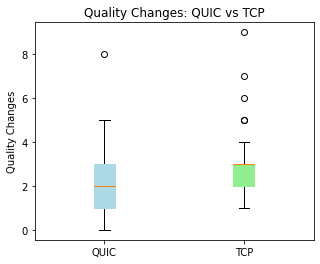

In [54]:
# QUIC/TCP
quicChangeCounts, tcpChangeCounts = mapGroupPair(countQualityChangesInFirst50, allQuicSims, allTcpSims)
graphPair(quicChangeCounts, tcpChangeCounts, 'Quality Changes', 'Quality Changes: QUIC vs TCP')

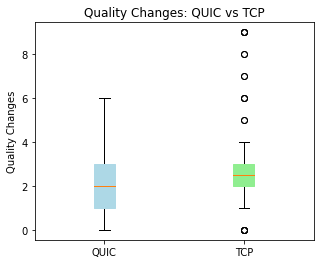

In [29]:
# QUIC/TCP (OLD)
# quicChangeCounts, tcpChangeCounts = mapGroupPair(countQualityChangesInFirst50, allQuicSims, allTcpSims)
# graphPair(quicChangeCounts, tcpChangeCounts, 'Quality Changes', 'Quality Changes: QUIC vs TCP')

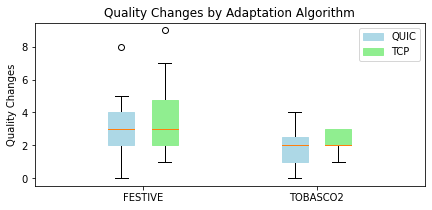

In [55]:
pairedAlgoChangeCounts = getPairedData(countQualityChangesInFirst50, quicAlgoGroups, tcpAlgoGroups)
title = 'Quality Changes by Adaptation Algorithm'
graphPairs(pairedAlgoChangeCounts, algoStrings, 'Quality Changes', title)

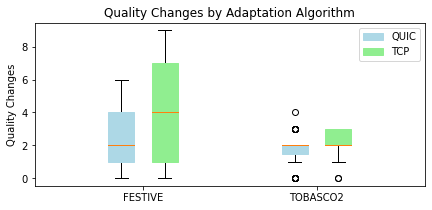

In [30]:
# ((OLD))
# pairedAlgoChangeCounts = getPairedData(countQualityChangesInFirst50, quicAlgoGroups, tcpAlgoGroups)
# title = 'Quality Changes by Adaptation Algorithm'
# graphPairs(pairedAlgoChangeCounts, algoStrings, 'Quality Changes', title)

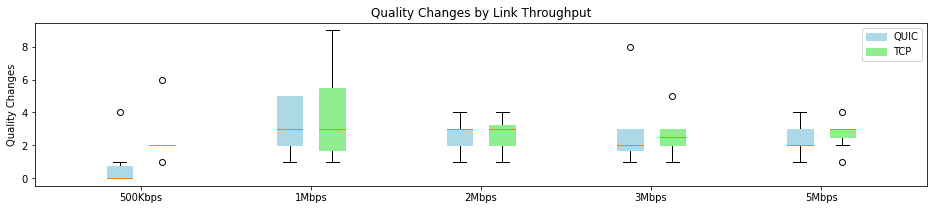

In [56]:
# Bitrate split
pairedRateChangeCounts = getPairedData(countQualityChangesInFirst50, quicRateGroups, tcpRateGroups)
title = 'Quality Changes by Link Throughput'
graphPairs(pairedRateChangeCounts, bitrateStrings, 'Quality Changes', title)

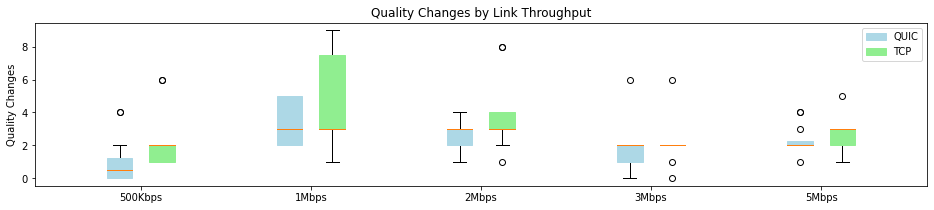

In [31]:
# ((OLD))
# # Bitrate split
# pairedRateChangeCounts = getPairedData(countQualityChangesInFirst50, quicRateGroups, tcpRateGroups)
# title = 'Quality Changes by Link Throughput'
# graphPairs(pairedRateChangeCounts, bitrateStrings, 'Quality Changes', title)

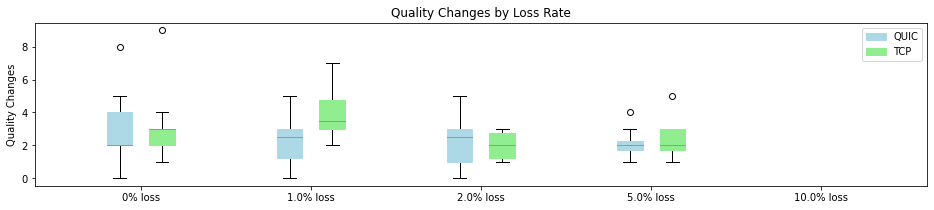

In [57]:
# Loss Rate Split
pairedLossChangeCounts = getPairedData(countQualityChangesInFirst50, quicLossGroups, tcpLossGroups)
title = 'Quality Changes by Loss Rate'
graphPairs(pairedLossChangeCounts, lossRateStrings, 'Quality Changes', title)

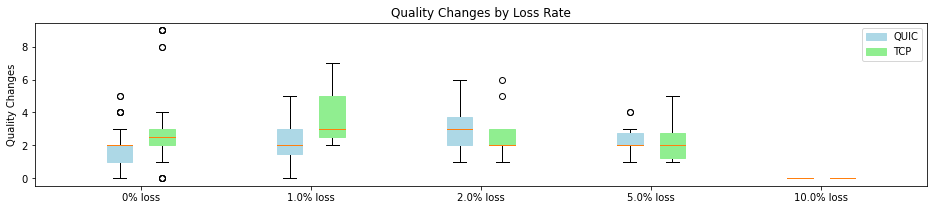

In [32]:
# ((OLD))
# # Loss Rate Split
# pairedLossChangeCounts = getPairedData(countQualityChangesInFirst50, quicLossGroups, tcpLossGroups)
# title = 'Quality Changes by Loss Rate'
# graphPairs(pairedLossChangeCounts, lossRateStrings, 'Quality Changes', title)

### Quality Level Graphs for each split

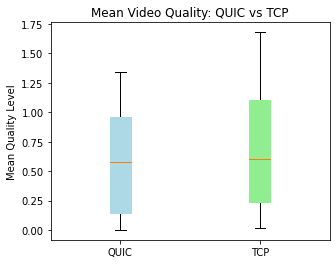

In [58]:
# QUIC/TCP
quicQualities, tcpQualities = mapGroupPair(meanQualityLevelInFirst50, allQuicSims, allTcpSims)
graphPair(quicQualities, tcpQualities, 'Mean Quality Level', 'Mean Video Quality: QUIC vs TCP')

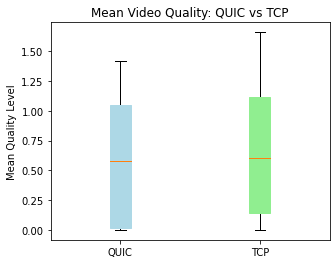

In [33]:
# ((OLD))
# # QUIC/TCP
# quicQualities, tcpQualities = mapGroupPair(meanQualityLevelInFirst50, allQuicSims, allTcpSims)
# graphPair(quicQualities, tcpQualities, 'Mean Quality Level', 'Mean Video Quality: QUIC vs TCP')

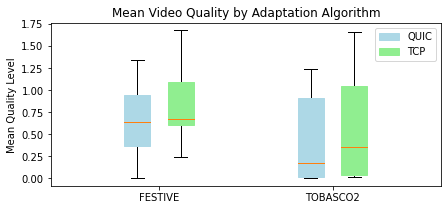

In [59]:
# Algorithm Split
pairedAlgoQualities = getPairedData(meanQualityLevelInFirst50, quicAlgoGroups, tcpAlgoGroups)
title = 'Mean Video Quality by Adaptation Algorithm'
graphPairs(pairedAlgoQualities, algoStrings, 'Mean Quality Level', title)

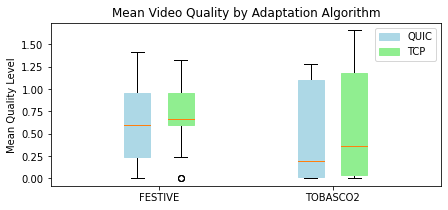

In [35]:
# ((OLD))
# # Algorithm Split
# pairedAlgoQualities = getPairedData(meanQualityLevelInFirst50, quicAlgoGroups, tcpAlgoGroups)
# title = 'Mean Video Quality by Adaptation Algorithm'
# graphPairs(pairedAlgoQualities, algoStrings, 'Mean Quality Level', title)

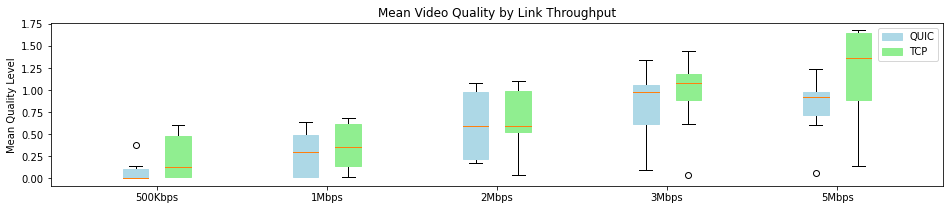

In [60]:
# Bitrate Split
pairedRateQualities = getPairedData(meanQualityLevelInFirst50, quicRateGroups, tcpRateGroups)
title = 'Mean Video Quality by Link Throughput'
graphPairs(pairedRateQualities, bitrateStrings, 'Mean Quality Level', title)

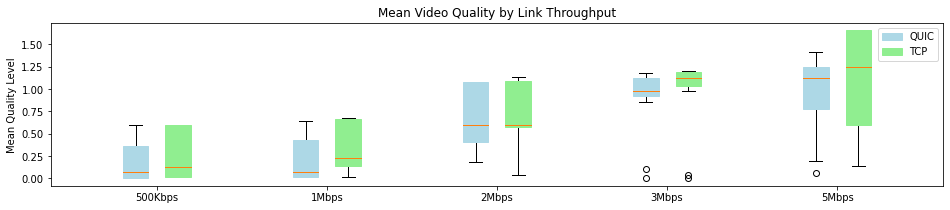

In [37]:
# ((OLD))
# # Bitrate Split
# pairedRateQualities = getPairedData(meanQualityLevelInFirst50, quicRateGroups, tcpRateGroups)
# title = 'Mean Video Quality by Link Throughput'
# graphPairs(pairedRateQualities, bitrateStrings, 'Mean Quality Level', title)

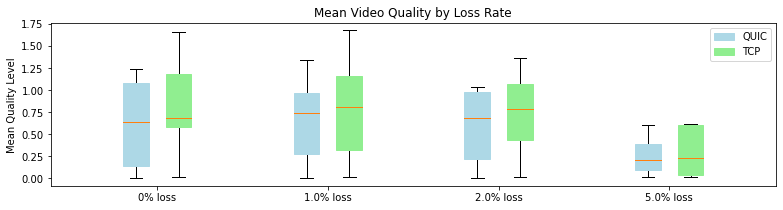

In [61]:
# Bitrate Split
pairedLossQualities = getPairedData(meanQualityLevelInFirst50, quicLossGroups, tcpLossGroups)
title = 'Mean Video Quality by Loss Rate'

# Ignore the 10% loss because we didn't do enough simulations with it.
graphPairs(pairedLossQualities[:-1], lossRateStrings[:-1], 'Mean Quality Level', title) 

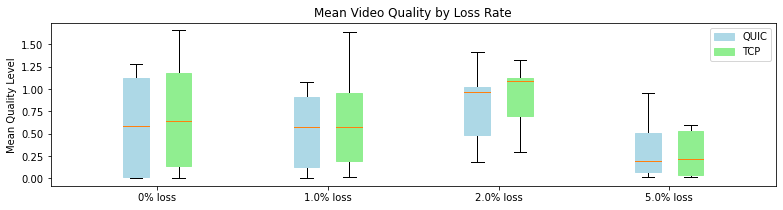

In [39]:
# ((OLD))
# # Bitrate Split
# pairedLossQualities = getPairedData(meanQualityLevelInFirst50, quicLossGroups, tcpLossGroups)
# title = 'Mean Video Quality by Loss Rate'

# # Ignore the 10% loss because we didn't do enough simulations with it.
# graphPairs(pairedLossQualities[:-1], lossRateStrings[:-1], 'Mean Quality Level', title) 

### Rebuffer rate graphs for each split

Malformed buffer underflow log. Likely that QUIC failed near time 316.032
Malformed buffer underflow log. Likely that QUIC failed near time 302.949
Malformed buffer underflow log. Likely that QUIC failed near time 324.066
Malformed buffer underflow log. Likely that QUIC failed near time 256.71
Malformed buffer underflow log. Likely that QUIC failed near time 124.066
Malformed buffer underflow log. Likely that QUIC failed near time 112.883
Malformed buffer underflow log. Likely that QUIC failed near time 184.045
Malformed buffer underflow log. Likely that QUIC failed near time 170.045
Malformed buffer underflow log. Likely that QUIC failed near time 146.045
Malformed buffer underflow log. Likely that QUIC failed near time 326.045
Malformed buffer underflow log. Likely that QUIC failed near time 110.95
Malformed buffer underflow log. Likely that QUIC failed near time 112.036
Malformed buffer underflow log. Likely that QUIC failed near time 306.097
Malformed buffer underflow log. Likely t

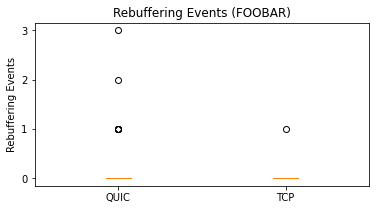

In [68]:
graphRebufferingEvents([allQuicSims, allTcpSims], ['QUIC', 'TCP'], 'FOOBAR')

Malformed buffer underflow log. Likely that QUIC failed near time 316.032
Malformed buffer underflow log. Likely that QUIC failed near time 302.949
Malformed buffer underflow log. Likely that QUIC failed near time 324.066
Malformed buffer underflow log. Likely that QUIC failed near time 256.71
Malformed buffer underflow log. Likely that QUIC failed near time 124.066
Malformed buffer underflow log. Likely that QUIC failed near time 112.883
Malformed buffer underflow log. Likely that QUIC failed near time 184.045
Malformed buffer underflow log. Likely that QUIC failed near time 170.045
Malformed buffer underflow log. Likely that QUIC failed near time 146.045
Malformed buffer underflow log. Likely that QUIC failed near time 326.045
Malformed buffer underflow log. Likely that QUIC failed near time 110.95
Malformed buffer underflow log. Likely that QUIC failed near time 112.036
Malformed buffer underflow log. Likely that QUIC failed near time 306.097
Malformed buffer underflow log. Likely t

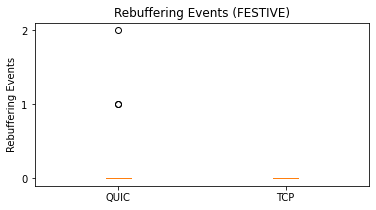

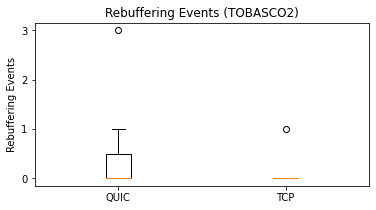

In [65]:
# QUIC/TCP Split
graphRebufferingEvents([festiveQuicSims, festiveTcpSims], ['QUIC', 'TCP'], 'FESTIVE')
graphRebufferingEvents([tobascoQuicSims, tobascoTcpSims], ['QUIC', 'TCP'], 'TOBASCO2')

Malformed buffer underflow log. Likely that QUIC failed near time 299.192
Malformed buffer underflow log. Likely that QUIC failed near time 299.418
Malformed buffer underflow log. Likely that QUIC failed near time 316.032
Malformed buffer underflow log. Likely that QUIC failed near time 330.524
Malformed buffer underflow log. Likely that QUIC failed near time 324.066
Malformed buffer underflow log. Likely that QUIC failed near time 330.898
Malformed buffer underflow log. Likely that QUIC failed near time 184.045
Malformed buffer underflow log. Likely that QUIC failed near time 184.045
Malformed buffer underflow log. Likely that QUIC failed near time 316.032
Malformed buffer underflow log. Likely that QUIC failed near time 330.524
Malformed buffer underflow log. Likely that QUIC failed near time 302.949
Malformed buffer underflow log. Likely that QUIC failed near time 305.695
Malformed buffer underflow log. Likely that QUIC failed near time 324.066
Malformed buffer underflow log. Likely

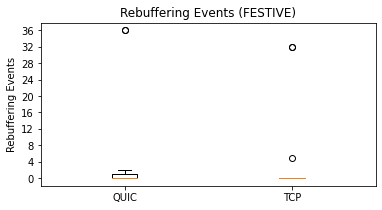

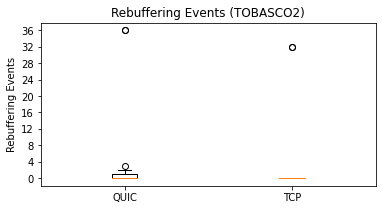

In [46]:
# ((OLD))
# # QUIC/TCP Split
# graphRebufferingEvents([festiveQuicSims, festiveTcpSims], ['QUIC', 'TCP'], 'FESTIVE')
# graphRebufferingEvents([tobascoQuicSims, tobascoTcpSims], ['QUIC', 'TCP'], 'TOBASCO2')

Malformed buffer underflow log. Likely that QUIC failed near time 316.032
Malformed buffer underflow log. Likely that QUIC failed near time 302.949
Malformed buffer underflow log. Likely that QUIC failed near time 306.097
Malformed buffer underflow log. Likely that QUIC failed near time 330.123
Malformed buffer underflow log. Likely that QUIC failed near time 324.066
Malformed buffer underflow log. Likely that QUIC failed near time 256.71
Malformed buffer underflow log. Likely that QUIC failed near time 124.066
Malformed buffer underflow log. Likely that QUIC failed near time 112.883
Malformed buffer underflow log. Likely that QUIC failed near time 120.415
Malformed buffer underflow log. Likely that QUIC failed near time 117.58
Malformed buffer underflow log. Likely that QUIC failed near time 150.991
Malformed buffer underflow log. Likely that QUIC failed near time 184.045
Malformed buffer underflow log. Likely that QUIC failed near time 170.045
Malformed buffer underflow log. Likely t

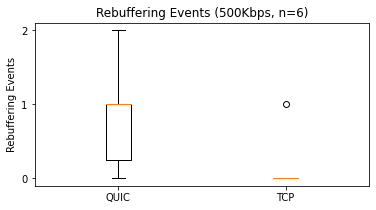

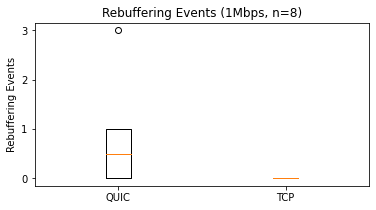

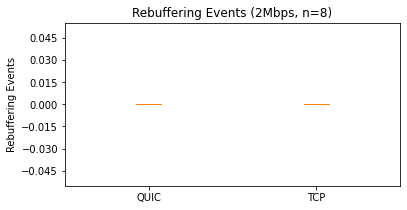

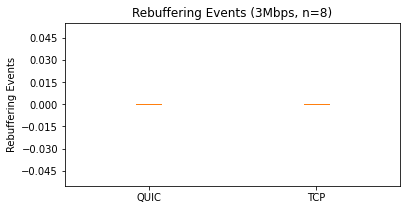

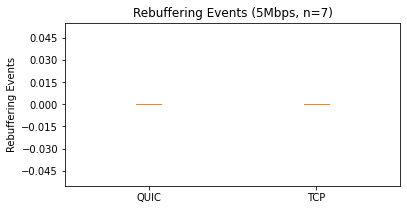

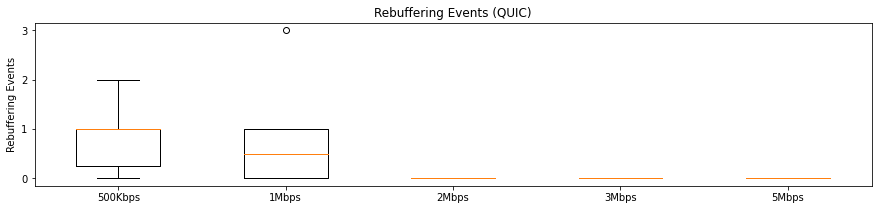

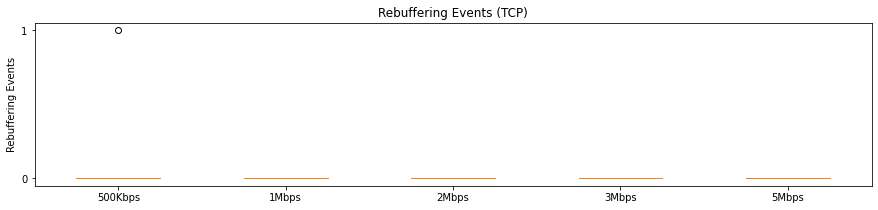

In [69]:
# Bitrate Split
graphSplit(graphRebufferingEvents, bitrateStrings, quicRateGroups, tcpRateGroups)

Malformed buffer underflow log. Likely that QUIC failed near time 316.032
Malformed buffer underflow log. Likely that QUIC failed near time 330.524
Malformed buffer underflow log. Likely that QUIC failed near time 306.097
Malformed buffer underflow log. Likely that QUIC failed near time 309.613
Malformed buffer underflow log. Likely that QUIC failed near time 316.032
Malformed buffer underflow log. Likely that QUIC failed near time 330.524
Malformed buffer underflow log. Likely that QUIC failed near time 302.949
Malformed buffer underflow log. Likely that QUIC failed near time 305.695
Malformed buffer underflow log. Likely that QUIC failed near time 306.097
Malformed buffer underflow log. Likely that QUIC failed near time 309.613
Malformed buffer underflow log. Likely that QUIC failed near time 330.123
Malformed buffer underflow log. Likely that QUIC failed near time 212.618
Malformed buffer underflow log. Likely that QUIC failed near time 324.066
Malformed buffer underflow log. Likely

Malformed buffer underflow log. Likely that QUIC failed near time 184.036
Malformed buffer underflow log. Likely that QUIC failed near time 332.035


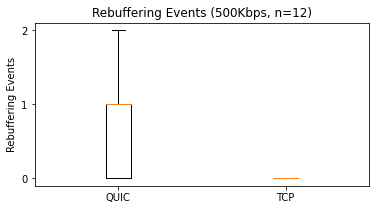

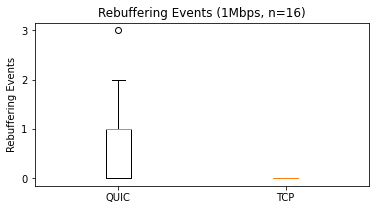

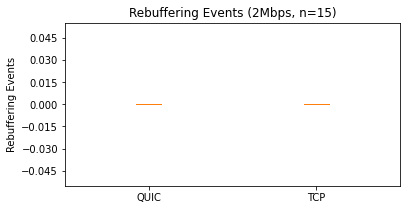

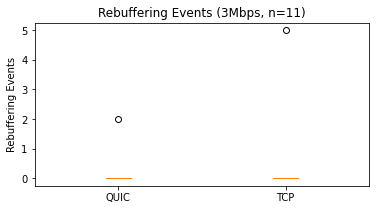

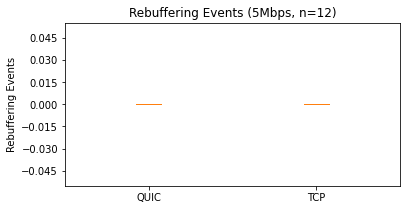

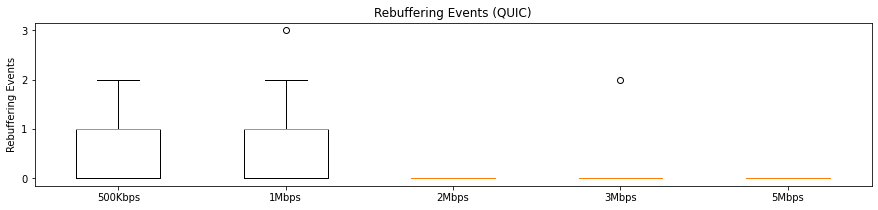

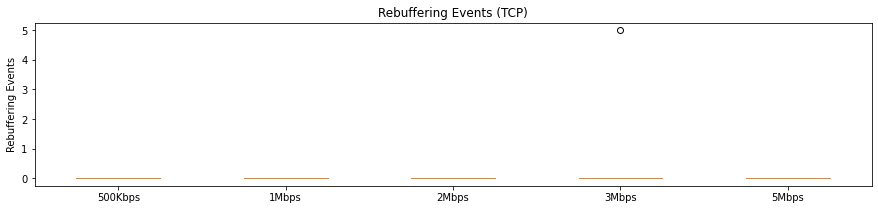

In [47]:
# Bitrate Split
graphSplit(graphRebufferingEvents, bitrateStrings, quicRateGroups, tcpRateGroups)

Malformed buffer underflow log. Likely that QUIC failed near time 299.192
Malformed buffer underflow log. Likely that QUIC failed near time 299.418
Malformed buffer underflow log. Likely that QUIC failed near time 316.032
Malformed buffer underflow log. Likely that QUIC failed near time 330.524
Malformed buffer underflow log. Likely that QUIC failed near time 324.066
Malformed buffer underflow log. Likely that QUIC failed near time 330.898
Malformed buffer underflow log. Likely that QUIC failed near time 184.045
Malformed buffer underflow log. Likely that QUIC failed near time 184.045
Malformed buffer underflow log. Likely that QUIC failed near time 299.192
Malformed buffer underflow log. Likely that QUIC failed near time 299.418
Malformed buffer underflow log. Likely that QUIC failed near time 306.097
Malformed buffer underflow log. Likely that QUIC failed near time 309.613
Malformed buffer underflow log. Likely that QUIC failed near time 120.415
Malformed buffer underflow log. Likely

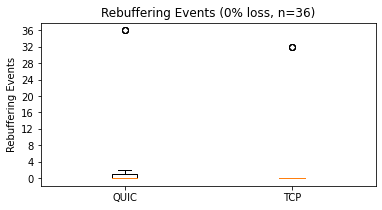

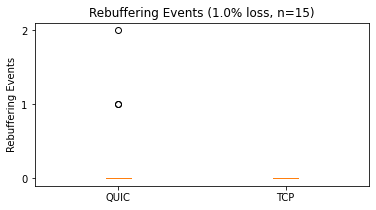

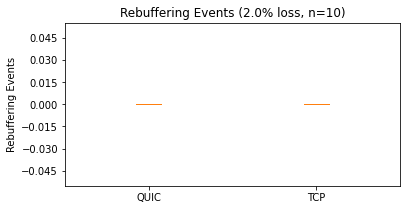

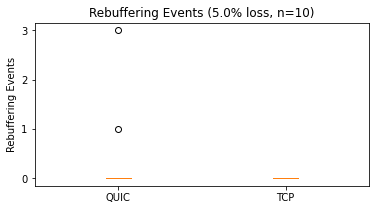

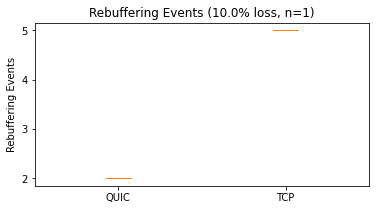

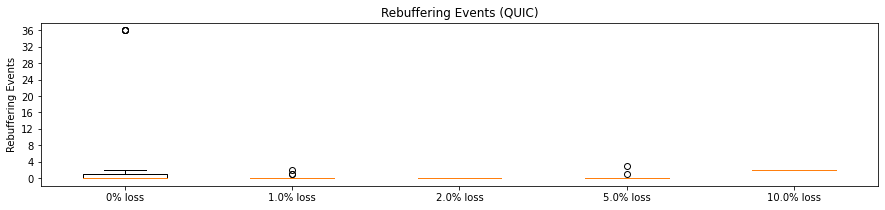

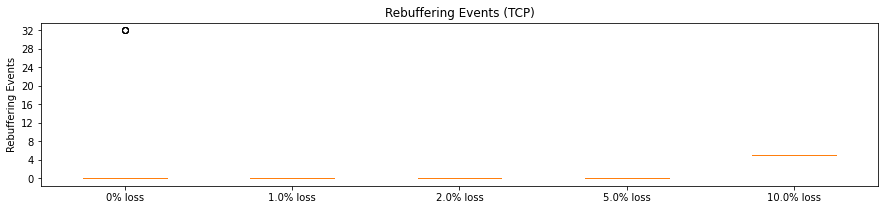

In [48]:
# Loss Split
graphSplit(graphRebufferingEvents, lossRateStrings, quicLossGroups, tcpLossGroups)

### Average Buffer level for each split

In [71]:
def meanBufferLevelInFirst50(sim):
    return meanBufferLevel(sim, 50)

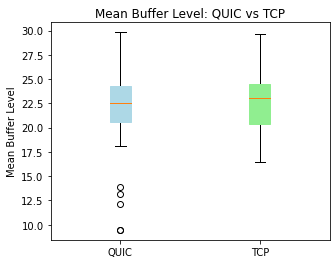

In [72]:
# QUIC/TCP
quicBufferLevels, tcpBufferLevels = mapGroupPair(meanBufferLevelInFirst50, allQuicSims, allTcpSims)
graphPair(quicBufferLevels, tcpBufferLevels, 'Mean Buffer Level', 'Mean Buffer Level: QUIC vs TCP')

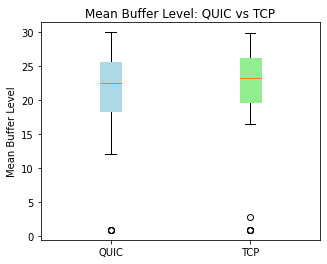

In [50]:
# ((OLD))
# # QUIC/TCP
# quicBufferLevels, tcpBufferLevels = mapGroupPair(meanBufferLevelInFirst50, allQuicSims, allTcpSims)
# graphPair(quicBufferLevels, tcpBufferLevels, 'Mean Buffer Level', 'Mean Buffer Level: QUIC vs TCP')

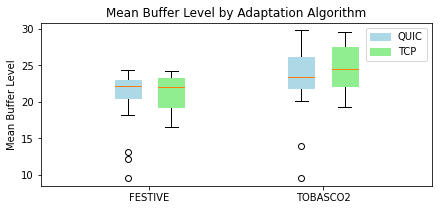

In [73]:
# Algorithm Split
pairedAlgoBufferLevels = getPairedData(meanBufferLevelInFirst50, quicAlgoGroups, tcpAlgoGroups)
title = 'Mean Buffer Level by Adaptation Algorithm'
graphPairs(pairedAlgoBufferLevels, algoStrings, 'Mean Buffer Level', title)

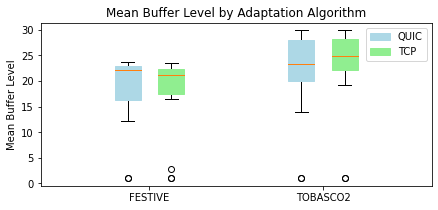

In [51]:
# ((OLD))
# # Algorithm Split
# pairedAlgoBufferLevels = getPairedData(meanBufferLevelInFirst50, quicAlgoGroups, tcpAlgoGroups)
# title = 'Mean Buffer Level by Adaptation Algorithm'
# graphPairs(pairedAlgoBufferLevels, algoStrings, 'Mean Buffer Level', title)

## Quality level comparison for every simulation

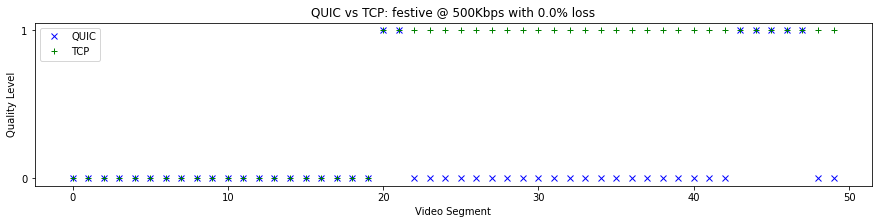

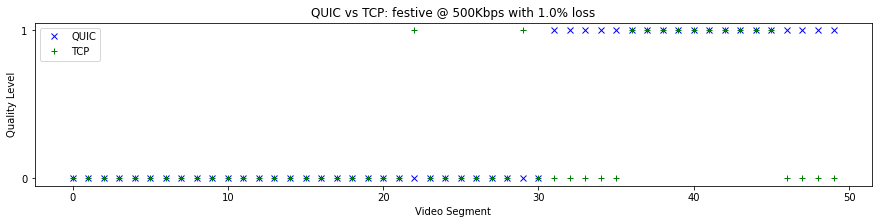

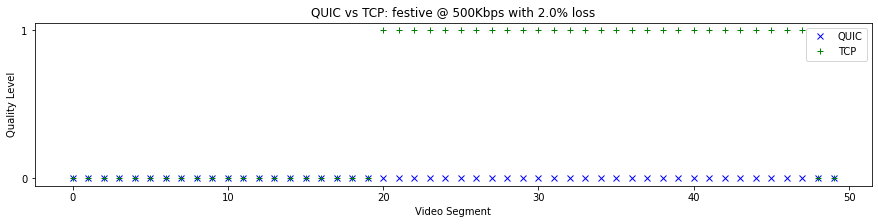

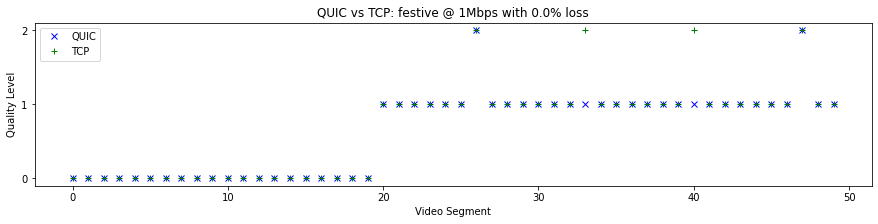

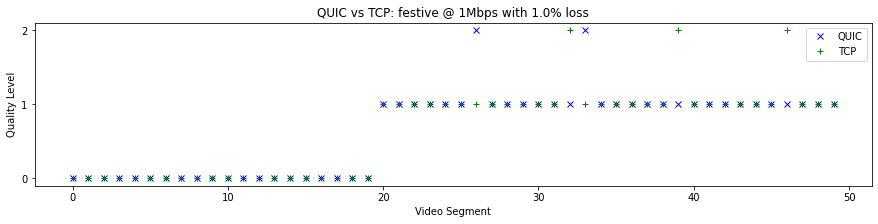

...

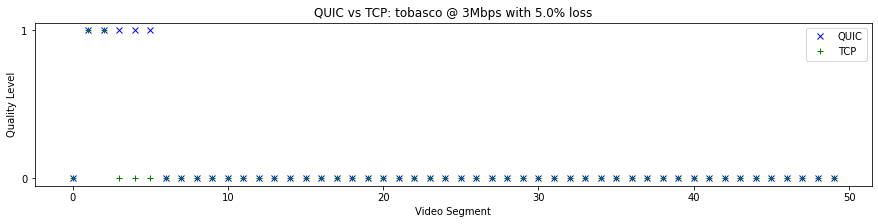

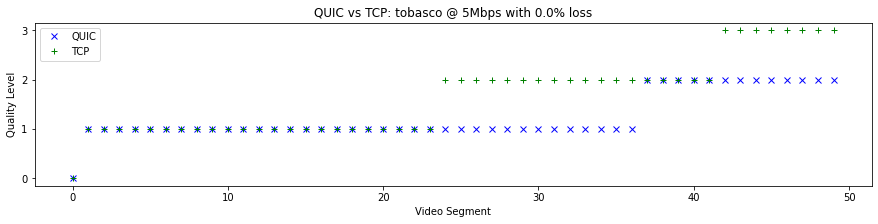

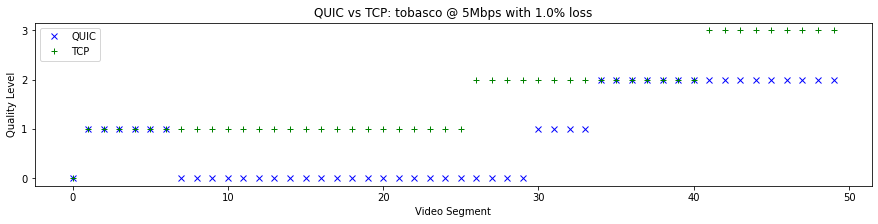

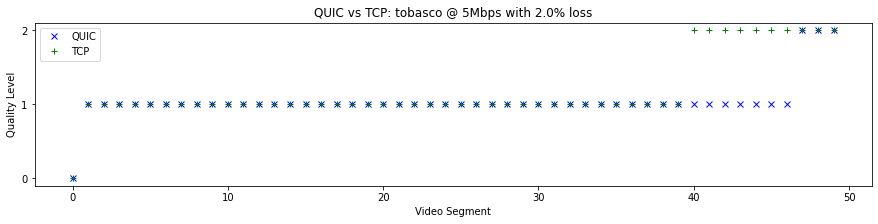

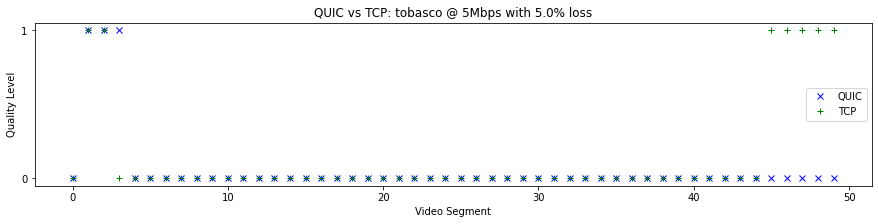

In [74]:
for (quicSim, tcpSim) in allSimPairs:
    compareAdaptationLevelsOverlay(quicSim, tcpSim, 'QUIC', 'TCP')

## Graphing based on two loss groups

In [76]:
def hasLowLoss(sim):
    return sim.errRate <= .01

def hasHighLoss(sim):
    return not hasLowLoss(sim)

In [78]:
quicLessLossSims = list(filter(hasLowLoss, allQuicSims))
quicMoreLossSims = list(filter(hasHighLoss, allQuicSims))
tcpLessLossSims = list(filter(hasLowLoss, allTcpSims))
tcpMoreLossSims = list(filter(hasHighLoss, allTcpSims))

quicNewLossGroups = [quicLessLossSims, quicMoreLossSims]
tcpNewLossGroups = [tcpLessLossSims, tcpMoreLossSims]

lossGroupStrings = ['<= 1% packet loss', '> 1% packet loss']

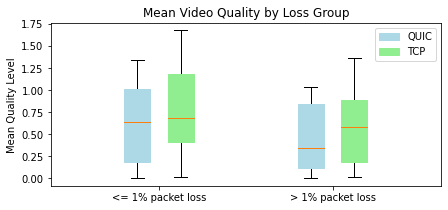

In [79]:
# Quality level
pairedNewLossQualities = getPairedData(meanQualityLevelInFirst50, quicNewLossGroups, tcpNewLossGroups)
title = 'Mean Video Quality by Loss Group'
graphPairs(pairedNewLossQualities, lossGroupStrings, 'Mean Quality Level', title)

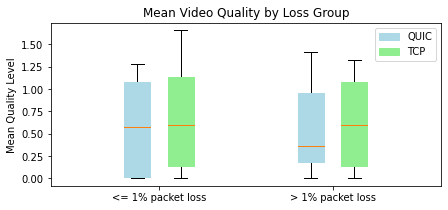

In [56]:
# ((OLD))
# # Quality level
# pairedNewLossQualities = getPairedData(meanQualityLevelInFirst50, quicNewLossGroups, tcpNewLossGroups)
# title = 'Mean Video Quality by Loss Group'
# graphPairs(pairedNewLossQualities, lossGroupStrings, 'Mean Quality Level', title)

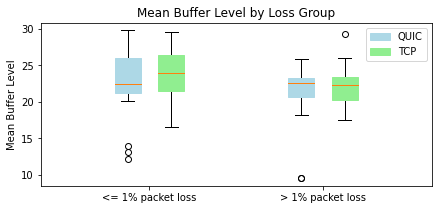

In [80]:
# Buffer level
pairedNewLossBufferLevels = getPairedData(meanBufferLevelInFirst50, quicNewLossGroups, tcpNewLossGroups)
title = 'Mean Buffer Level by Loss Group'
graphPairs(pairedNewLossBufferLevels, lossGroupStrings, 'Mean Buffer Level', title)

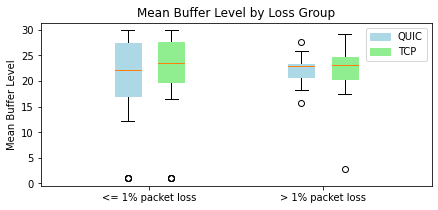

In [57]:
# ((OLD))
# # Buffer level
# pairedNewLossBufferLevels = getPairedData(meanBufferLevelInFirst50, quicNewLossGroups, tcpNewLossGroups)
# title = 'Mean Buffer Level by Loss Group'
# graphPairs(pairedNewLossBufferLevels, lossGroupStrings, 'Mean Buffer Level', title)

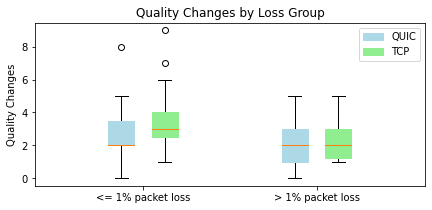

In [81]:
# Quality Changes
pairedNewLossChangeCounts = getPairedData(countQualityChangesInFirst50, quicNewLossGroups, tcpNewLossGroups)
title = 'Quality Changes by Loss Group'
graphPairs(pairedNewLossChangeCounts, lossGroupStrings, 'Quality Changes', title)

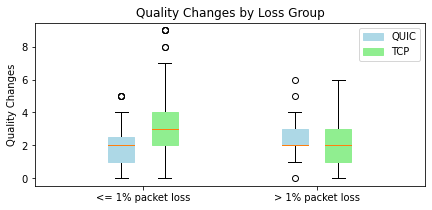

In [58]:
# ((OLD))
# # Quality Changes
# pairedNewLossChangeCounts = getPairedData(countQualityChangesInFirst50, quicNewLossGroups, tcpNewLossGroups)
# title = 'Quality Changes by Loss Group'
# graphPairs(pairedNewLossChangeCounts, lossGroupStrings, 'Quality Changes', title)

## FESTIVE vs TOBASCO

In [101]:
# Graph the quality level and stability of festive and tobasco with QUIC and TCP separated
algoNames = ['Tobasco', 'Festive']
algoColors = ['khaki', 'tan']

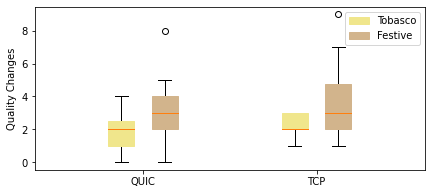

In [108]:
tobascoQuicChanges = [countQualityChangesInFirst50(sim) for sim in tobascoQuicSims]
tobascoTcpChanges = [countQualityChangesInFirst50(sim) for sim in tobascoTcpSims]

festiveQuicChanges = [countQualityChangesInFirst50(sim) for sim in festiveQuicSims]
festiveTcpChanges = [countQualityChangesInFirst50(sim) for sim in festiveTcpSims]

protoGroupedAlgoQualityChanges = [
    (tobascoQuicChanges, festiveQuicChanges),
    (tobascoTcpChanges, festiveTcpChanges),
]

title = 'Quality Changes by Adaptation Algorithm'
graphPairs(protoGroupedAlgoQualityChanges, ['QUIC', 'TCP'], 'Quality Changes', '', algoNames, algoColors)


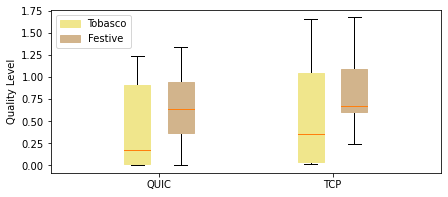

In [130]:
# Now the same thing to compare the relationships for quality levels
tobascoQuicQuality = [meanQualityLevelInFirst50(sim) for sim in tobascoQuicSims]
tobascoTcpQuality = [meanQualityLevelInFirst50(sim) for sim in tobascoTcpSims]

festiveQuicQuality = [meanQualityLevelInFirst50(sim) for sim in festiveQuicSims]
festiveTcpQuality = [meanQualityLevelInFirst50(sim) for sim in festiveTcpSims]

protoGroupedAlgoQualityLevels = [
    (tobascoQuicQuality, festiveQuicQuality),
    (tobascoTcpQuality, festiveTcpQuality),
]

title = 'Quality Levels by Adaptation Algorithm'
graphPairs(protoGroupedAlgoQualityLevels, ['QUIC', 'TCP'], 'Quality Level', '', algoNames, algoColors)
